<h1 style="border: 3px solid blue; border-radius: 2px; text-align: center; color: blue; font-size: 2.7em;">GOLD PRICE PREDICTION</h1>

### Importation des bibliothèques et des modules

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import make_pipeline

from sklearn.model_selection import train_test_split
from sklearn.model_selection import learning_curve

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import RANSACRegressor
from sklearn.linear_model import TheilSenRegressor
from sklearn.linear_model import HuberRegressor
from sklearn.svm import SVR

from sklearn.metrics import *

import warnings
warnings.filterwarnings('ignore') #pour ignorer les avertissements

### Chargement du jeu de données (dataset)

Vu que nous sommes dans une serie temporelle, on définira la colonne de la date comme la colonne d'index de notre dataframe (index_col="Date") et on indiquera à pandas que nous devons travailler avec des dates (parse_dates=True).

In [5]:
data = pd.read_csv("data/FINAL_USO.csv", index_col="Date", parse_dates=True)

### Copie du dataset

In [6]:
df = data.copy()

### Affichage des 5 premières lignes du dataset

In [7]:
pd.set_option('display.max_column',80) #pour afficher toutes les colonnes du dataframe

df.head() #pour afficher les 5 premières lignes 

,Open,High,Low,Close,Adj Close,Volume,SP_open,SP_high,SP_low,SP_close,SP_Ajclose,SP_volume,DJ_open,DJ_high,DJ_low,DJ_close,DJ_Ajclose,DJ_volume,EG_open,EG_high,EG_low,EG_close,EG_Ajclose,EG_volume,EU_Price,EU_open,EU_high,EU_low,EU_Trend,OF_Price,OF_Open,OF_High,OF_Low,OF_Volume,OF_Trend,OS_Price,OS_Open,OS_High,OS_Low,OS_Trend,SF_Price,SF_Open,SF_High,SF_Low,SF_Volume,SF_Trend,USB_Price,USB_Open,USB_High,USB_Low,USB_Trend,PLT_Price,PLT_Open,PLT_High,PLT_Low,PLT_Trend,PLD_Price,PLD_Open,PLD_High,PLD_Low,PLD_Trend,RHO_PRICE,USDI_Price,USDI_Open,USDI_High,USDI_Low,USDI_Volume,USDI_Trend,GDX_Open,GDX_High,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-12-15,154.740005,154.949997,151.710007,152.330002,152.330002,21521900,123.029999,123.199997,121.989998,122.180000,105.441238,199109200,11825.29004,11967.83984,11825.21973,11868.80957,11868.80957,136930000,74.550003,76.150002,72.150002,72.900002,70.431755,787900,1.3018,1.2982,1.3051,1.2957,1,105.09,104.88,106.50,104.88,14330,1,93.42,94.91,96.00,93.33,0,53604,54248,54248,52316,119440,1,1.911,1.911,1.911,1.911,1,1414.65,1420.30,1423.35,1376.85,0,618.85,614.70,615.00,614.60,1,1425,80.341,80.565,80.630,80.130,22850,0,53.009998,53.139999,51.570000,51.680000,48.973877,20605600,36.900002,36.939999,36.049999,36.130001,36.130001,12616700
2011-12-16,154.309998,155.369995,153.899994,155.229996,155.229996,18124300,122.230003,122.949997,121.300003,121.589996,105.597549,220481400,11870.25000,11968.17969,11819.30957,11866.38965,11866.38965,389520000,73.599998,75.099998,73.349998,74.900002,72.364037,896600,1.3035,1.3020,1.3087,1.2997,1,103.35,103.51,104.56,102.46,140080,0,93.79,93.43,94.80,92.53,1,53458,53650,54030,52890,65390,0,1.851,1.851,1.851,1.851,0,1420.25,1414.75,1431.75,1400.70,1,623.65,622.60,623.45,622.30,1,1400,80.249,80.175,80.395,79.935,13150,0,52.500000,53.180000,52.040001,52.680000,49.921513,16285400,36.180000,36.500000,35.730000,36.270000,36.270000,12578800
2011-12-19,155.479996,155.860001,154.360001,154.869995,154.869995,12547200,122.059998,122.320000,120.029999,120.290001,104.468536,183903000,11866.54004,11925.87988,11735.19043,11766.25977,11766.25977,135170000,69.099998,69.800003,64.199997,64.699997,62.509384,2096700,1.2995,1.3043,1.3044,1.2981,0,103.64,103.63,104.57,102.37,147880,1,94.09,93.77,94.43,92.55,1,52961,53400,53400,52544,67280,0,1.810,1.810,1.810,1.810,0,1411.10,1422.65,1427.60,1404.60,0,608.80,626.00,630.00,608.60,0,1400,80.207,80.300,80.470,80.125,970,0,52.490002,52.549999,51.029999,51.169998,48.490578,15120200,36.389999,36.450001,35.930000,36.200001,36.200001,7418200
2011-12-20,156.820007,157.429993,156.580002,156.979996,156.979996,9136300,122.180000,124.139999,120.370003,123.930000,107.629784,225418100,11769.20996,12117.12988,11768.83008,12103.58008,12103.58008,165180000,66.449997,68.099998,66.000000,67.000000,64.731514,875300,1.3079,1.3003,1.3133,1.2994,1,106.73,104.30,107.27,103.91,170240,1,95.55,96.39,99.70,96.39,1,53487,52795,53575,52595,55130,1,1.927,1.927,1.927,1.927,1,1434.75,1408.95,1436.55,1408.15,1,626.65,622.45,622.45,622.45,1,1400,80.273,80.890,80.940,80.035,22950,1,52.380001,53.250000,52.369999,52.990002,50.215282,11644900,37.299999,37.610001,37.220001,37.560001,37.560001,10041600
2011-12-21,156.979996,157.529999,156.130005,157.160004,157.160004,11996100,123.930000,124.360001,122.750000,124.169998,107.838242,194230900,12103.58008,12119.70020,11999.44043,12107.74023,12107.74023,163250000,67.099998,69.400002,66.900002,68.500000,66.180725,837600,1.3045,1.3079,1.3197,1.3024,0,107.71,107.15,108.17,106.16,145090,1,99.01,97.54,99.26,96.81,1,53148,53519,54184,52937,75950,0,1.970,1.970,1.970,1.970,1,1429.05,1434.40,1453.75,1417.65,0,635.90,625.70,641.50,623.80,1,1400,80.350,80.105,80.445,79.550,24140,1,53.150002,53.430000,52.419998,52.959999,50.186852,8724300,37.669998,38.240002,37.520000,38.110001,38.110001,10728000


### Vérification de l'index

Il faut vérifier si l'on travaillera bel et bien avec les dates en index dans la suite du travail.

In [8]:
df.index

DatetimeIndex(['2011-12-15', '2011-12-16', '2011-12-19', '2011-12-20',
               '2011-12-21', '2011-12-22', '2011-12-23', '2011-12-27',
               '2011-12-28', '2011-12-29',
               ...
               '2018-12-17', '2018-12-18', '2018-12-19', '2018-12-20',
               '2018-12-21', '2018-12-24', '2018-12-26', '2018-12-27',
               '2018-12-28', '2018-12-31'],
              dtype='datetime64[ns]', name='Date', length=1718, freq=None)

### Informations sur le dataframe df

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1718 entries, 2011-12-15 to 2018-12-31
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Open           1718 non-null   float64
 1   High           1718 non-null   float64
 2   Low            1718 non-null   float64
 3   Close          1718 non-null   float64
 4   Adj Close      1718 non-null   float64
 5   Volume         1718 non-null   int64  
 6   SP_open        1718 non-null   float64
 7   SP_high        1718 non-null   float64
 8   SP_low         1718 non-null   float64
 9   SP_close       1718 non-null   float64
 10  SP_Ajclose     1718 non-null   float64
 11  SP_volume      1718 non-null   int64  
 12  DJ_open        1718 non-null   float64
 13  DJ_high        1718 non-null   float64
 14  DJ_low         1718 non-null   float64
 15  DJ_close       1718 non-null   float64
 16  DJ_Ajclose     1718 non-null   float64
 17  DJ_volume      1718 non-null   int

### Variables d'ingénierie de caractéristiques

In [10]:
#Indice S&P 500

ind_SP_500 = ['SP_open','SP_high','SP_low','SP_close','SP_Ajclose','SP_volume']
df_SP_500 = df[ind_SP_500]
df_SP_500.head()

,SP_open,SP_high,SP_low,SP_close,SP_Ajclose,SP_volume
Date,,,,,,
2011-12-15,123.029999,123.199997,121.989998,122.180000,105.441238,199109200
2011-12-16,122.230003,122.949997,121.300003,121.589996,105.597549,220481400
2011-12-19,122.059998,122.320000,120.029999,120.290001,104.468536,183903000
2011-12-20,122.180000,124.139999,120.370003,123.930000,107.629784,225418100
2011-12-21,123.930000,124.360001,122.750000,124.169998,107.838242,194230900


In [11]:
#Indice Dow Jones

ind_Dow_Jones = ['DJ_open', 'DJ_high', 'DJ_low', 'DJ_close', 'DJ_Ajclose', 'DJ_volume']
df_Dow_Jones = df[ind_Dow_Jones]
df_Dow_Jones.head()

,DJ_open,DJ_high,DJ_low,DJ_close,DJ_Ajclose,DJ_volume
Date,,,,,,
2011-12-15,11825.29004,11967.83984,11825.21973,11868.80957,11868.80957,136930000
2011-12-16,11870.25000,11968.17969,11819.30957,11866.38965,11866.38965,389520000
2011-12-19,11866.54004,11925.87988,11735.19043,11766.25977,11766.25977,135170000
2011-12-20,11769.20996,12117.12988,11768.83008,12103.58008,12103.58008,165180000
2011-12-21,12103.58008,12119.70020,11999.44043,12107.74023,12107.74023,163250000


In [12]:
#Eldorado Gold Corporation (EGO)

EGO = ['EG_open', 'EG_high', 'EG_low', 'EG_close', 'EG_Ajclose', 'EG_volume']
df_EGO = df[EGO]
df_EGO.head()

,EG_open,EG_high,EG_low,EG_close,EG_Ajclose,EG_volume
Date,,,,,,
2011-12-15,74.550003,76.150002,72.150002,72.900002,70.431755,787900
2011-12-16,73.599998,75.099998,73.349998,74.900002,72.364037,896600
2011-12-19,69.099998,69.800003,64.199997,64.699997,62.509384,2096700
2011-12-20,66.449997,68.099998,66.000000,67.000000,64.731514,875300
2011-12-21,67.099998,69.400002,66.900002,68.500000,66.180725,837600


In [13]:
#Taux de change EUR-USD

eur_usd = ['EU_Price', 'EU_open', 'EU_high', 'EU_low', 'EU_Trend']
df_eur_usd = df[eur_usd]
df_eur_usd.head()

,EU_Price,EU_open,EU_high,EU_low,EU_Trend
Date,,,,,
2011-12-15,1.3018,1.2982,1.3051,1.2957,1
2011-12-16,1.3035,1.3020,1.3087,1.2997,1
2011-12-19,1.2995,1.3043,1.3044,1.2981,0
2011-12-20,1.3079,1.3003,1.3133,1.2994,1
2011-12-21,1.3045,1.3079,1.3197,1.3024,0


In [14]:
#Contrats à terme sur le pétrole brut Brend

petrol_brend = ['OF_Price','OF_Open', 'OF_High', 'OF_Low', 'OF_Volume', 'OF_Trend']
df_petrol_brend = df[petrol_brend]
df_petrol_brend.head()

,OF_Price,OF_Open,OF_High,OF_Low,OF_Volume,OF_Trend
Date,,,,,,
2011-12-15,105.09,104.88,106.50,104.88,14330,1
2011-12-16,103.35,103.51,104.56,102.46,140080,0
2011-12-19,103.64,103.63,104.57,102.37,147880,1
2011-12-20,106.73,104.30,107.27,103.91,170240,1
2011-12-21,107.71,107.15,108.17,106.16,145090,1


In [15]:
#pétrole brut WTI USD

petrol_WTI_USD = ['OS_Price','OS_Open', 'OS_High', 'OS_Low', 'OS_Trend']
df_petrol_WTI_USD = df[petrol_WTI_USD]
df_petrol_WTI_USD.head()

,OS_Price,OS_Open,OS_High,OS_Low,OS_Trend
Date,,,,,
2011-12-15,93.42,94.91,96.00,93.33,0
2011-12-16,93.79,93.43,94.80,92.53,1
2011-12-19,94.09,93.77,94.43,92.55,1
2011-12-20,95.55,96.39,99.70,96.39,1
2011-12-21,99.01,97.54,99.26,96.81,1


In [16]:
#silver futures

silver_futures = ['SF_Price','SF_Open','SF_High','SF_Low','SF_Volume','SF_Trend']
df_silver_futures = df[silver_futures]
df_silver_futures.head()

,SF_Price,SF_Open,SF_High,SF_Low,SF_Volume,SF_Trend
Date,,,,,,
2011-12-15,53604,54248,54248,52316,119440,1
2011-12-16,53458,53650,54030,52890,65390,0
2011-12-19,52961,53400,53400,52544,67280,0
2011-12-20,53487,52795,53575,52595,55130,1
2011-12-21,53148,53519,54184,52937,75950,0


In [17]:
#Taux des obligations américaines

US_obligations = ['USB_Price','USB_Open','USB_High','USB_Low','USB_Trend']
df_US_obligations = df[US_obligations]
df_US_obligations.head()

,USB_Price,USB_Open,USB_High,USB_Low,USB_Trend
Date,,,,,
2011-12-15,1.911,1.911,1.911,1.911,1
2011-12-16,1.851,1.851,1.851,1.851,0
2011-12-19,1.810,1.810,1.810,1.810,0
2011-12-20,1.927,1.927,1.927,1.927,1
2011-12-21,1.970,1.970,1.970,1.970,1


In [18]:
#Prix du platine

platine = ['PLT_Price','PLT_Open','PLT_High','PLT_Low','PLT_Trend']
df_platine = df[platine]
df_platine.head()

,PLT_Price,PLT_Open,PLT_High,PLT_Low,PLT_Trend
Date,,,,,
2011-12-15,1414.65,1420.30,1423.35,1376.85,0
2011-12-16,1420.25,1414.75,1431.75,1400.70,1
2011-12-19,1411.10,1422.65,1427.60,1404.60,0
2011-12-20,1434.75,1408.95,1436.55,1408.15,1
2011-12-21,1429.05,1434.40,1453.75,1417.65,0


In [19]:
#Prix du palladium et rhopice

palladium = ['PLD_Price','PLD_Open','PLD_High','PLD_Low','PLD_Trend','RHO_PRICE']
df_palladium = df[palladium]
df_palladium.head()

,PLD_Price,PLD_Open,PLD_High,PLD_Low,PLD_Trend,RHO_PRICE
Date,,,,,,
2011-12-15,618.85,614.70,615.00,614.60,1,1425
2011-12-16,623.65,622.60,623.45,622.30,1,1400
2011-12-19,608.80,626.00,630.00,608.60,0,1400
2011-12-20,626.65,622.45,622.45,622.45,1,1400
2011-12-21,635.90,625.70,641.50,623.80,1,1400


In [20]:
#Prix de l'indice du dollar américain

ind_US_price = ['USDI_Price','USDI_Open','USDI_High','USDI_Low','USDI_Volume','USDI_Trend']
df_US_price = df[ind_US_price]
df_US_price.head()

,USDI_Price,USDI_Open,USDI_High,USDI_Low,USDI_Volume,USDI_Trend
Date,,,,,,
2011-12-15,80.341,80.565,80.630,80.130,22850,0
2011-12-16,80.249,80.175,80.395,79.935,13150,0
2011-12-19,80.207,80.300,80.470,80.125,970,0
2011-12-20,80.273,80.890,80.940,80.035,22950,1
2011-12-21,80.350,80.105,80.445,79.550,24140,1


In [21]:
df['USDI_Trend'].value_counts()

1    881
0    837
Name: USDI_Trend, dtype: int64

In [22]:
#ETF Gold Miners

ETF_gold = ['GDX_Open','GDX_High','GDX_Low','GDX_Close','GDX_Adj Close','GDX_Volume']
df_ETF_gold = df[ETF_gold]
df_ETF_gold.head()

,GDX_Open,GDX_High,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume
Date,,,,,,
2011-12-15,53.009998,53.139999,51.570000,51.680000,48.973877,20605600
2011-12-16,52.500000,53.180000,52.040001,52.680000,49.921513,16285400
2011-12-19,52.490002,52.549999,51.029999,51.169998,48.490578,15120200
2011-12-20,52.380001,53.250000,52.369999,52.990002,50.215282,11644900
2011-12-21,53.150002,53.430000,52.419998,52.959999,50.186852,8724300


In [23]:
#ETF pétrolier USO

ETF_petrolier = ['USO_Open','USO_High','USO_Low','USO_Close','USO_Adj Close','USO_Volume']
df_ETF_petrolier = df[ETF_petrolier]
df_ETF_petrolier.head()

,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
Date,,,,,,
2011-12-15,36.900002,36.939999,36.049999,36.130001,36.130001,12616700
2011-12-16,36.180000,36.500000,35.730000,36.270000,36.270000,12578800
2011-12-19,36.389999,36.450001,35.930000,36.200001,36.200001,7418200
2011-12-20,37.299999,37.610001,37.220001,37.560001,37.560001,10041600
2011-12-21,37.669998,38.240002,37.520000,38.110001,38.110001,10728000


In [24]:
#Données extraites de GOLD ETF (Yahoo finance)

gold_etf = ['Open','High','Low','Close','Adj Close','Volume']
df_gold_etf = df[gold_etf]
df_gold_etf.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2011-12-15,154.740005,154.949997,151.710007,152.330002,152.330002,21521900
2011-12-16,154.309998,155.369995,153.899994,155.229996,155.229996,18124300
2011-12-19,155.479996,155.860001,154.360001,154.869995,154.869995,12547200
2011-12-20,156.820007,157.429993,156.580002,156.979996,156.979996,9136300
2011-12-21,156.979996,157.529999,156.130005,157.160004,157.160004,11996100


# 1. ANALYSE EXPLORATOIRE 

Rapport des analyses effectuées



### a. Identification de la target

La variable cible (target) de notre étude est <b style ="color: red;">"Adj Close"</b>. L'une des données de GOLD ETF extrait de Yahoo finance.

### b. Taille du dataset (nombres de lignes et de colonnes)

In [25]:
df.shape

(1718, 80)

Le dataset contient <b style ="color: red;">1718 lignes</b> et <b style ="color: red;">80 colonnes</b>. 
<br>(Nous avons 81 colonnes en réalité dans le jeu de données, mais vu que la colonne "Date" a été choisie comme l'index de notre dataframe, alors il ne restera que 80 colonnes)

### c) Identification des valeurs manquantes

Il faut calculer le pourcentage de valeurs manquantes et faire un affichage par ordre décroissant.

In [26]:
(df.isna().sum()/df.shape[0]).sort_values()

Open             0.0
PLD_Open         0.0
PLD_Price        0.0
PLT_Trend        0.0
PLT_Low          0.0
                ... 
EG_volume        0.0
EG_Ajclose       0.0
EG_close         0.0
USO_Adj Close    0.0
USO_Volume       0.0
Length: 80, dtype: float64

Il y a <b style ="color: red;">0 valeurs manquantes</b>.

### d) Types de variables 

##### Nombre de variables par type

In [27]:
df.dtypes.value_counts()

float64    58
int64      22
dtype: int64

##### Indentification des variables du type "float64"

In [28]:
df.select_dtypes(include = 'float64').columns

Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'SP_open', 'SP_high',
       'SP_low', 'SP_close', 'SP_Ajclose', 'DJ_open', 'DJ_high', 'DJ_low',
       'DJ_close', 'DJ_Ajclose', 'EG_open', 'EG_high', 'EG_low', 'EG_close',
       'EG_Ajclose', 'EU_Price', 'EU_open', 'EU_high', 'EU_low', 'OF_Price',
       'OF_Open', 'OF_High', 'OF_Low', 'OS_Price', 'OS_Open', 'OS_High',
       'OS_Low', 'USB_Price', 'USB_Open', 'USB_High', 'USB_Low', 'PLT_Price',
       'PLT_Open', 'PLT_High', 'PLT_Low', 'PLD_Price', 'PLD_Open', 'PLD_High',
       'PLD_Low', 'USDI_Price', 'USDI_Open', 'USDI_High', 'USDI_Low',
       'GDX_Open', 'GDX_High', 'GDX_Low', 'GDX_Close', 'GDX_Adj Close',
       'USO_Open', 'USO_High', 'USO_Low', 'USO_Close', 'USO_Adj Close'],
      dtype='object')

##### Indentification des variables du type "int64"

In [29]:
df.select_dtypes(include = 'int64').columns

Index(['Volume', 'SP_volume', 'DJ_volume', 'EG_volume', 'EU_Trend',
       'OF_Volume', 'OF_Trend', 'OS_Trend', 'SF_Price', 'SF_Open', 'SF_High',
       'SF_Low', 'SF_Volume', 'SF_Trend', 'USB_Trend', 'PLT_Trend',
       'PLD_Trend', 'RHO_PRICE', 'USDI_Volume', 'USDI_Trend', 'GDX_Volume',
       'USO_Volume'],
      dtype='object')

##### Détermination du type de la variable "Date"

In [30]:
df.index

DatetimeIndex(['2011-12-15', '2011-12-16', '2011-12-19', '2011-12-20',
               '2011-12-21', '2011-12-22', '2011-12-23', '2011-12-27',
               '2011-12-28', '2011-12-29',
               ...
               '2018-12-17', '2018-12-18', '2018-12-19', '2018-12-20',
               '2018-12-21', '2018-12-24', '2018-12-26', '2018-12-27',
               '2018-12-28', '2018-12-31'],
              dtype='datetime64[ns]', name='Date', length=1718, freq=None)

Le dataset ne possède que des variables quantitatives dont <b style ="color: red;">58 variables du type FLOAT64</b> et <b style ="color: red;">22 variables du type INT64</b>.
<br>
Seule la variable "Date" qui est l'index du dataframe est du type <b><em>Datetime</em></b>
<b style ="color: red;"></b>

### e) Visualisation de la variable cible 'Adj Close' (target)

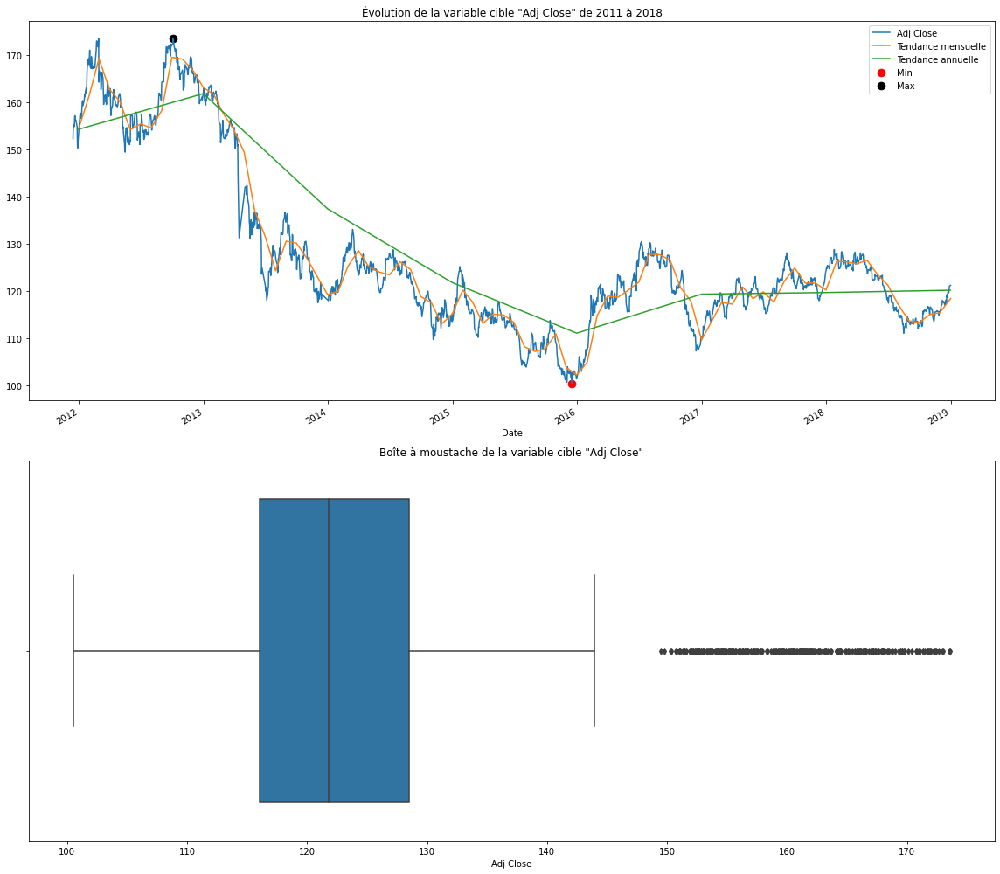

In [31]:
#Évolution de la variable cible
plt.subplot(211)
plt.title('Évolution de la variable cible "Adj Close" de 2011 à 2018')
df['Adj Close'].plot(figsize = (16,14))

#Affichage des tendances mensuelles et annuelles
plt.plot(df['Adj Close'].resample('M').mean(), label='Tendance mensuelle') 
plt.plot(df['Adj Close'].resample('Y').mean(), label='Tendance annuelle')

#Affichage du maximum et du minimum
plt.scatter(df['Adj Close'].idxmin(), df['Adj Close'].min(), marker='.', c='r', s=300, label="Min")
plt.scatter(df['Adj Close'].idxmax(), df['Adj Close'].max(), marker='.', c='black', s=300, label="Max") 
plt.legend()

#Boîte à moustache de la variable cible
plt.subplot(212)
plt.title('Boîte à moustache de la variable cible "Adj Close"')
sns.boxplot(data = df, x = 'Adj Close')

plt.tight_layout()
plt.show()

In [32]:
print(f"Le coût minimal de l'or de 2011 à 2018 est: ${df['Adj Close'].min()}\n Jour: {df['Adj Close'].idxmin()}\n\n")
print(f"Le coût maximal de l'or de 2011 à 2018 est: ${df['Adj Close'].max()}\n Jour: {df['Adj Close'].idxmax()}")

Le coût minimal de l'or de 2011 à 2018 est: $100.5
 Jour: 2015-12-17 00:00:00


Le coût maximal de l'or de 2011 à 2018 est: $173.610001
 Jour: 2012-10-04 00:00:00


### f) Compréhension des différentes variables

In [33]:
#liste de toutes les variables (hormis la variable cible "Adj Close") 
features_list = ['Open','High','Low','Close', 'Volume', 'SP_open','SP_high', 'SP_low', 'SP_close', 'SP_Ajclose', 'SP_volume', 'DJ_open','DJ_high', 'DJ_low', 'DJ_close', 'DJ_Ajclose', 'DJ_volume', 'EG_open','EG_high', 'EG_low', 'EG_close', 'EG_Ajclose', 'EG_volume', 'EU_Price','EU_open', 'EU_high', 'EU_low', 'EU_Trend', 'OF_Price', 'OF_Open','OF_High', 'OF_Low', 'OF_Volume', 'OF_Trend', 'OS_Price', 'OS_Open','OS_High', 'OS_Low', 'OS_Trend', 'SF_Price', 'SF_Open', 'SF_High','SF_Low', 'SF_Volume', 'SF_Trend', 'USB_Price', 'USB_Open', 'USB_High','USB_Low', 'USB_Trend', 'PLT_Price', 'PLT_Open', 'PLT_High', 'PLT_Low','PLT_Trend', 'PLD_Price', 'PLD_Open', 'PLD_High', 'PLD_Low','PLD_Trend', 'RHO_PRICE', 'USDI_Price', 'USDI_Open', 'USDI_High','USDI_Low', 'USDI_Volume', 'USDI_Trend', 'GDX_Open', 'GDX_High','GDX_Low', 'GDX_Close', 'GDX_Adj Close', 'GDX_Volume', 'USO_Open','USO_High', 'USO_Low', 'USO_Close', 'USO_Adj Close', 'USO_Volume']
len(features_list)

79

In [34]:
#Liste des variables quantitatives continues
features_list_quanti = ['Adj Close','Open','High','Low','Close','Volume','SP_open','SP_high','SP_low','SP_close','SP_Ajclose','SP_volume','DJ_open','DJ_high','DJ_low','DJ_close','DJ_Ajclose','DJ_volume','EG_open','EG_high','EG_low','EG_close','EG_Ajclose','EG_volume','EU_Price','EU_open','EU_high','EU_low','OF_Price', 'OF_Open','OF_High','OF_Low','OF_Volume','OS_Price','OS_Open','OS_High','OS_Low','SF_Price','SF_Open', 'SF_High','SF_Low', 'SF_Volume','USB_Price','USB_Open','USB_High','USB_Low','PLT_Price','PLT_Open','PLT_High','PLT_Low','PLD_Price','PLD_Open','PLD_High','PLD_Low','RHO_PRICE','USDI_Price','USDI_Open','USDI_High','USDI_Low','USDI_Volume','GDX_Open','GDX_High','GDX_Low','GDX_Close','GDX_Adj Close','GDX_Volume','USO_Open','USO_High','USO_Low','USO_Close','USO_Adj Close','USO_Volume']
len(features_list_quanti)

72

##### Étude de chaque variable quantitative continue

Pour chacune de ces variables, la courbe et la boîte à moustache nous aideront à mieux les comprendre.

ÉTUDE DE LA VARIABLE "Adj Close"


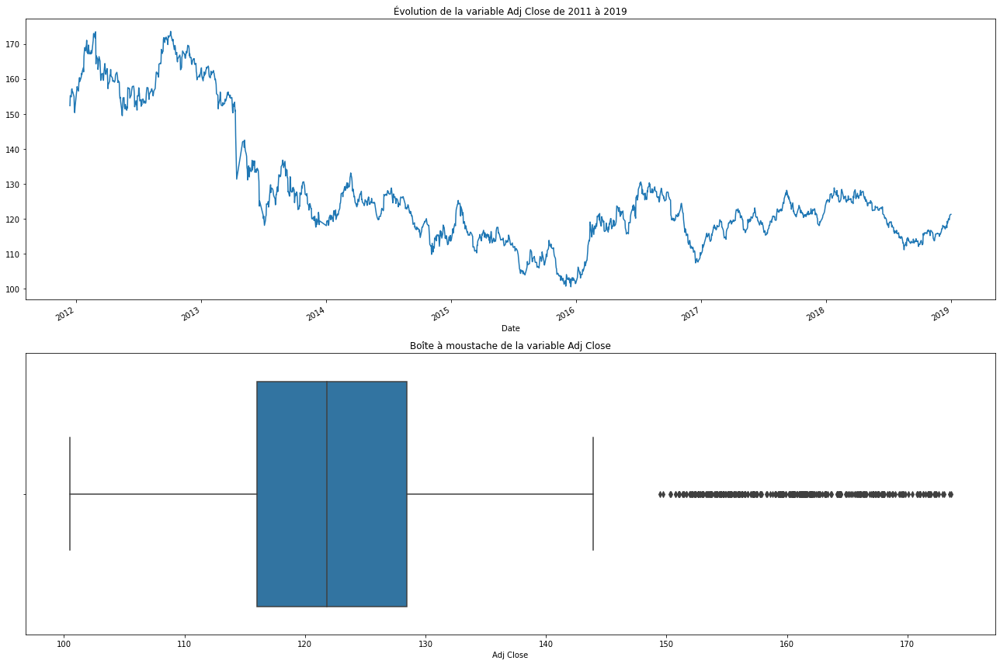

ÉTUDE DE LA VARIABLE "Open"


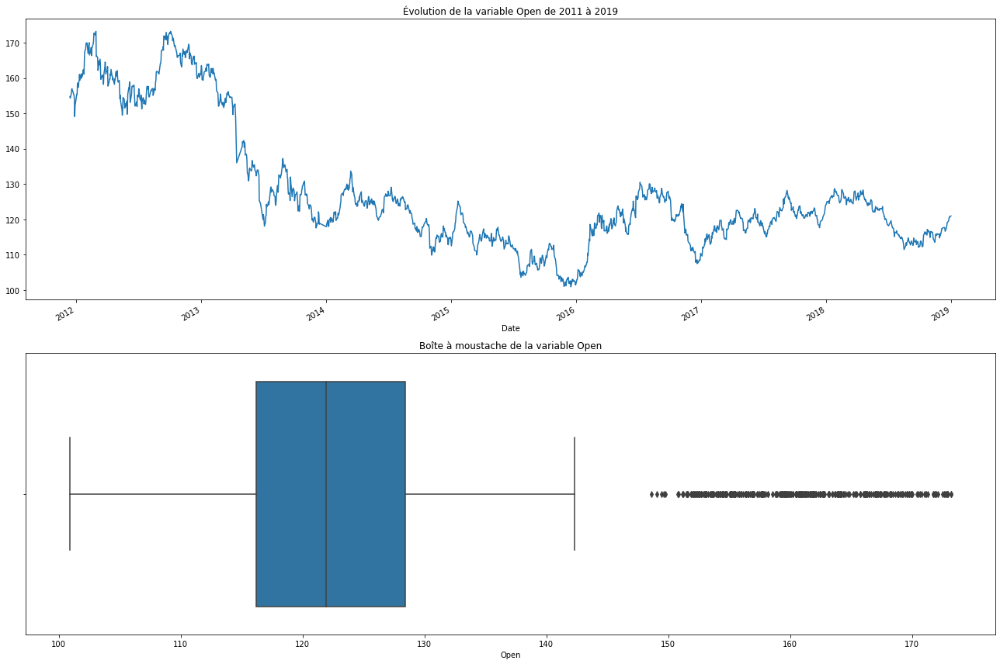

ÉTUDE DE LA VARIABLE "High"


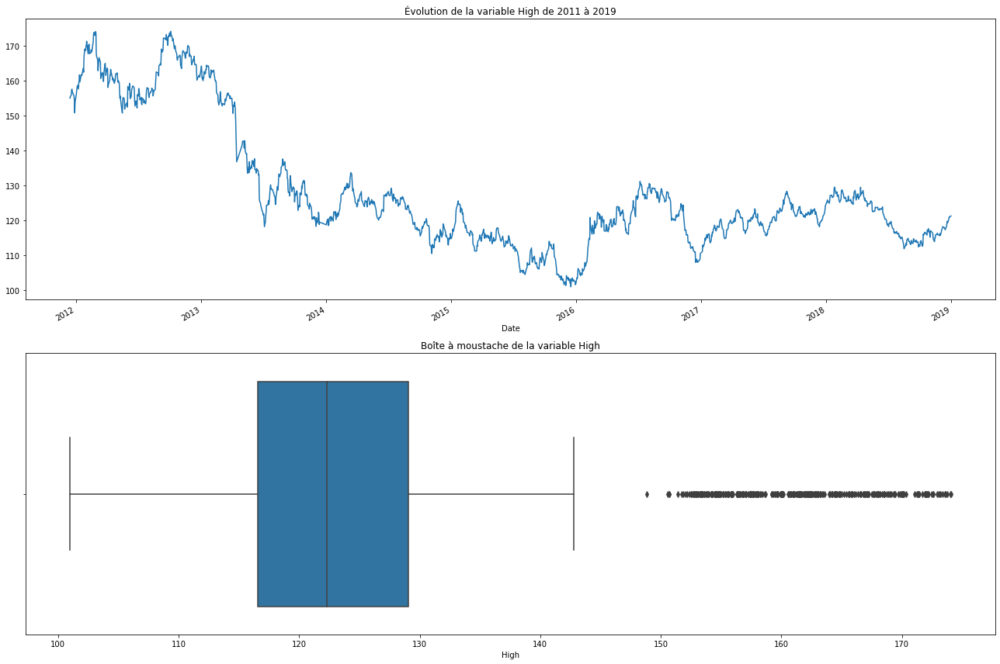

ÉTUDE DE LA VARIABLE "Low"


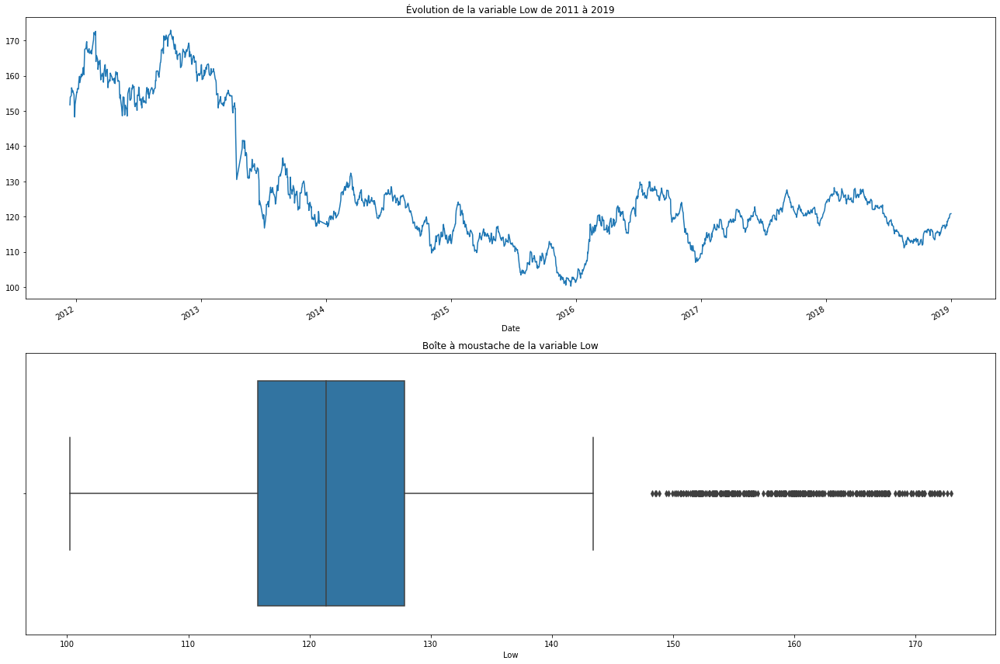

ÉTUDE DE LA VARIABLE "Close"


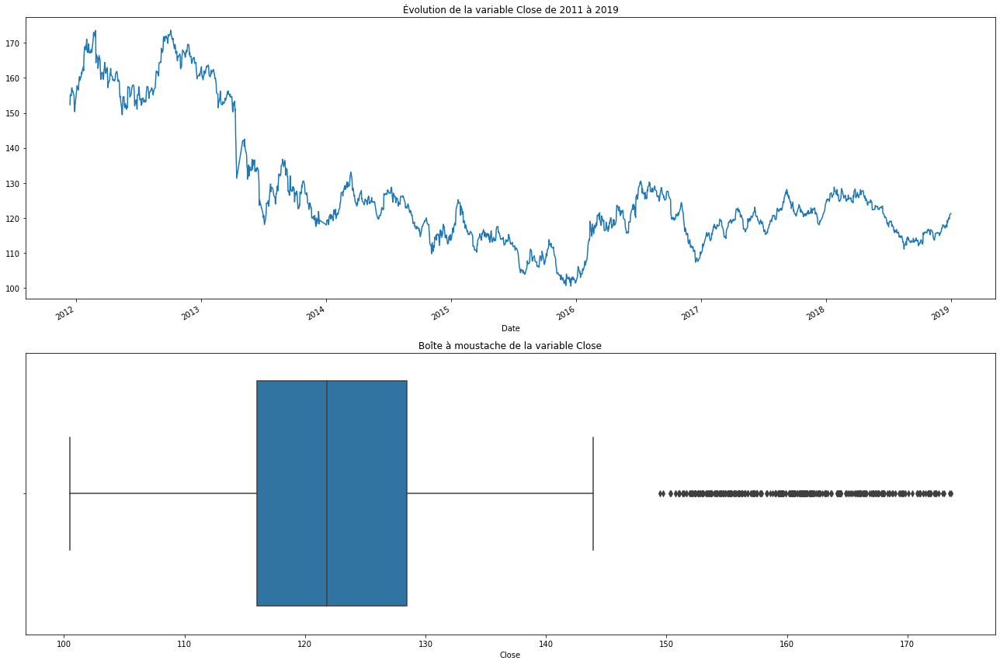

ÉTUDE DE LA VARIABLE "Volume"


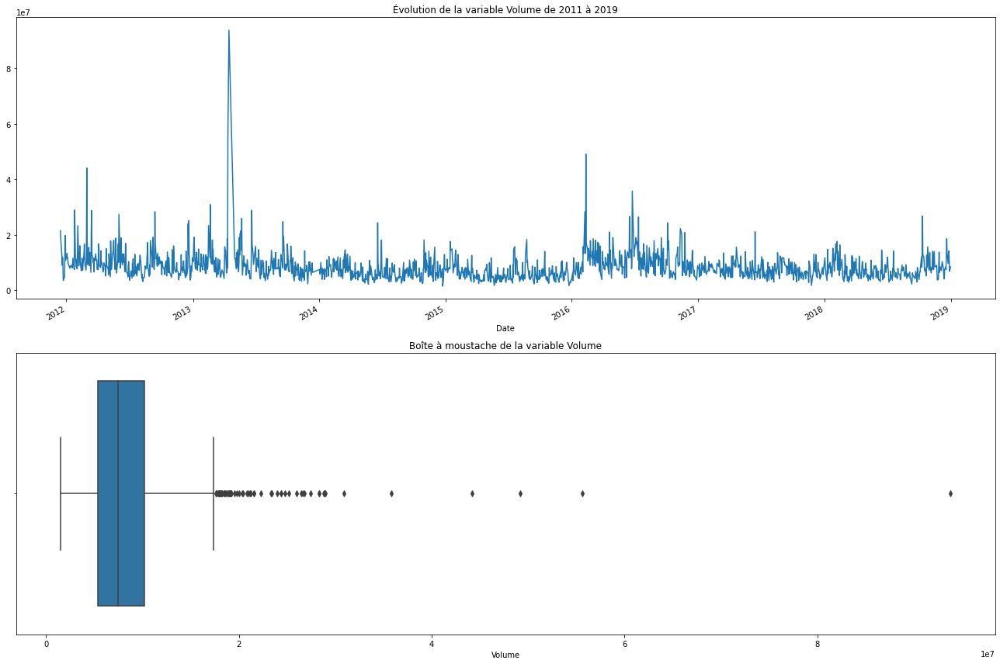

ÉTUDE DE LA VARIABLE "SP_open"


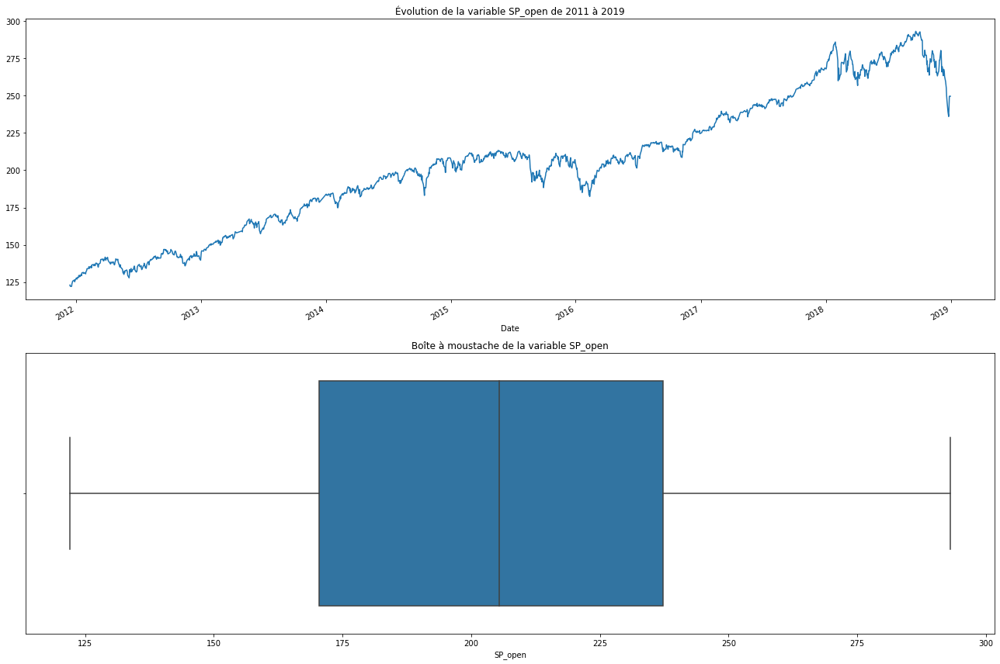

ÉTUDE DE LA VARIABLE "SP_high"


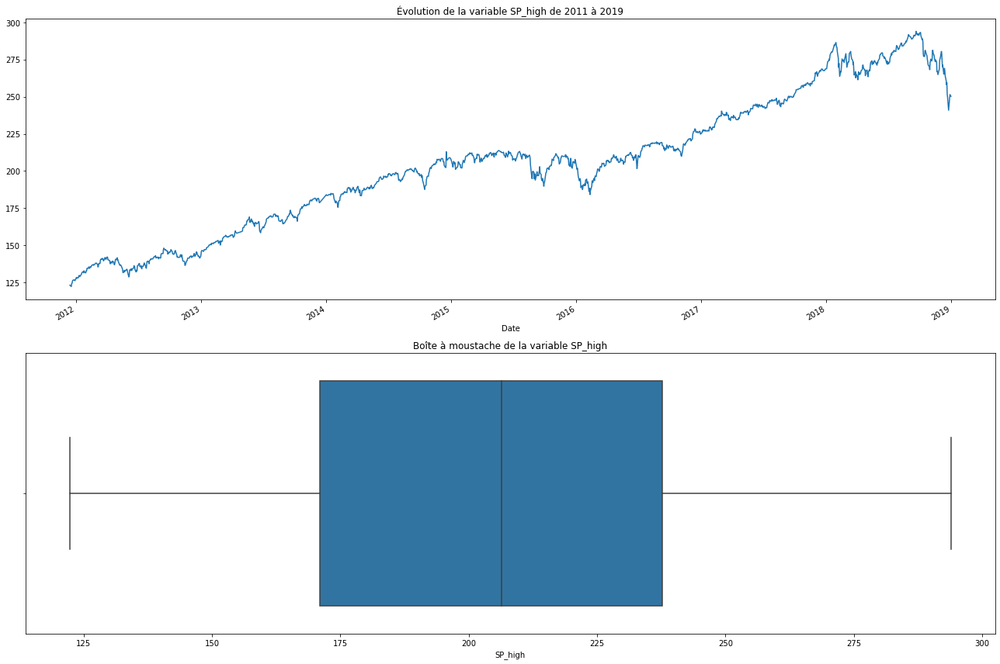

ÉTUDE DE LA VARIABLE "SP_low"


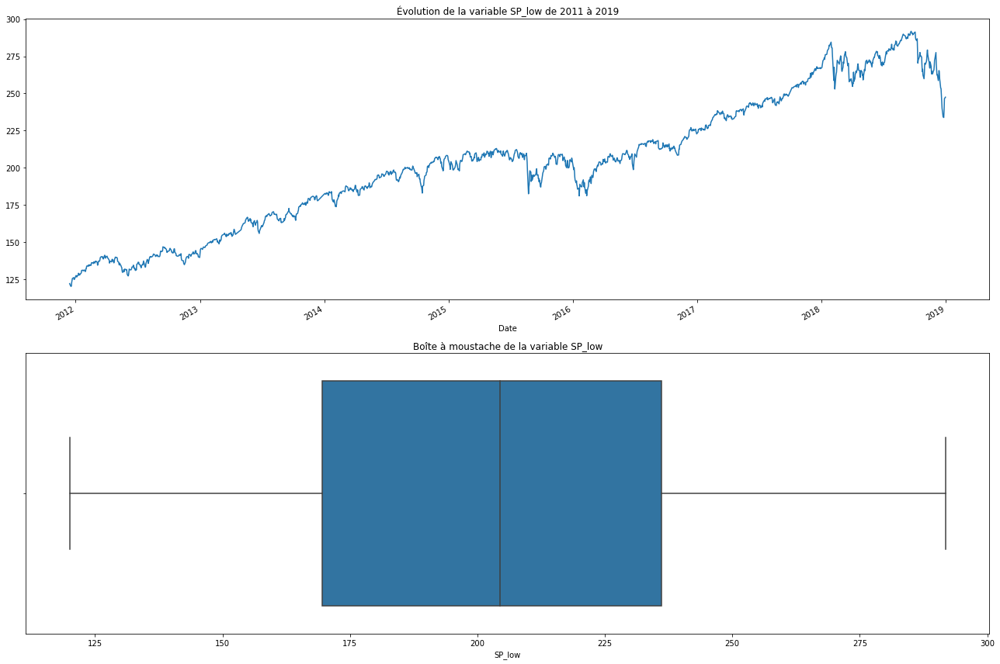

ÉTUDE DE LA VARIABLE "SP_close"


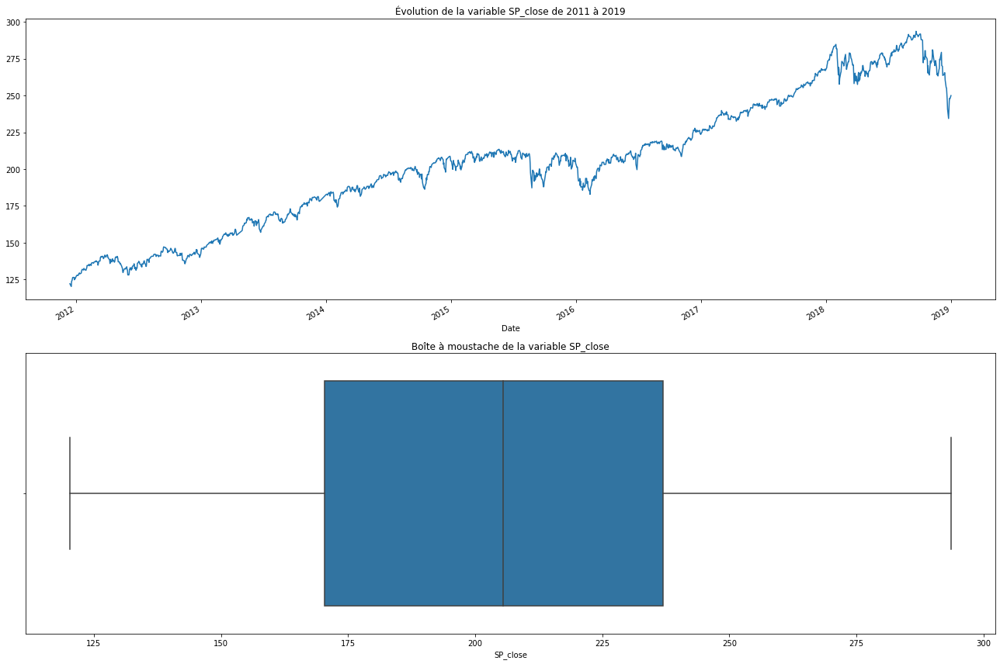

ÉTUDE DE LA VARIABLE "SP_Ajclose"


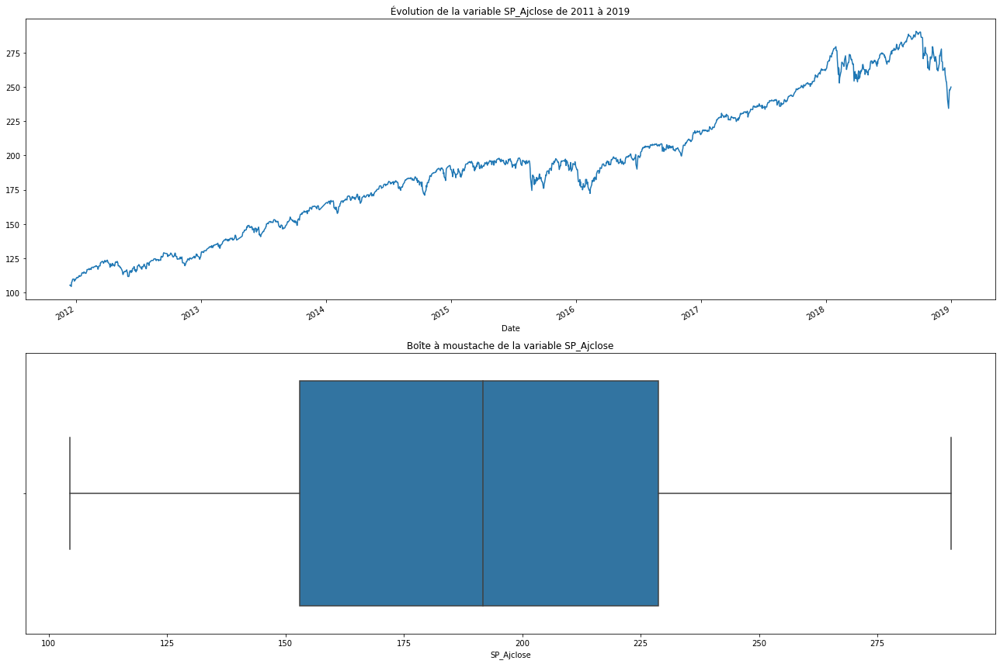

ÉTUDE DE LA VARIABLE "SP_volume"


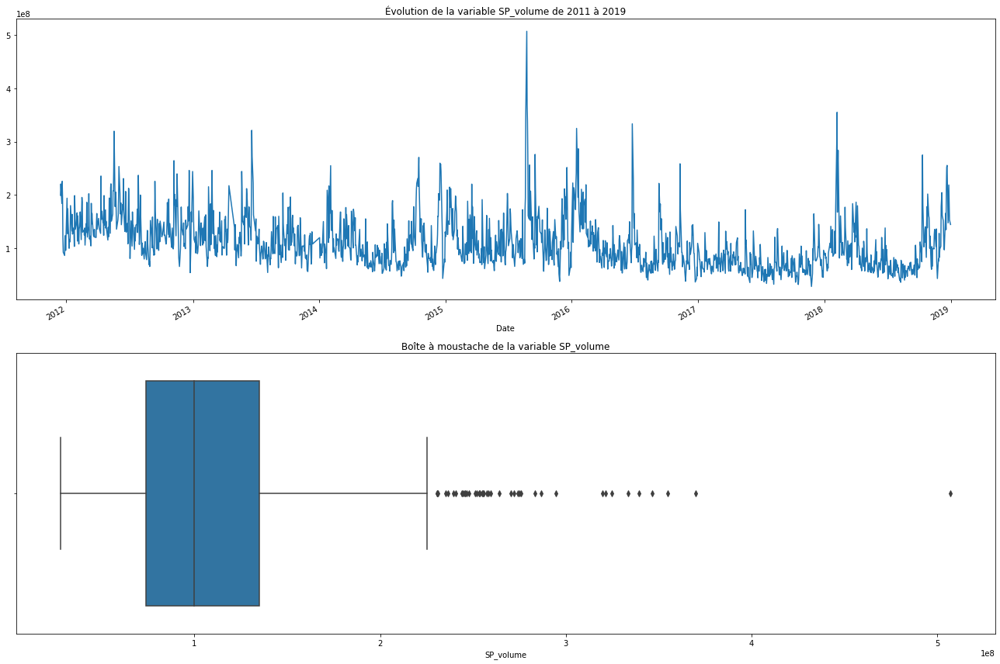

ÉTUDE DE LA VARIABLE "DJ_open"


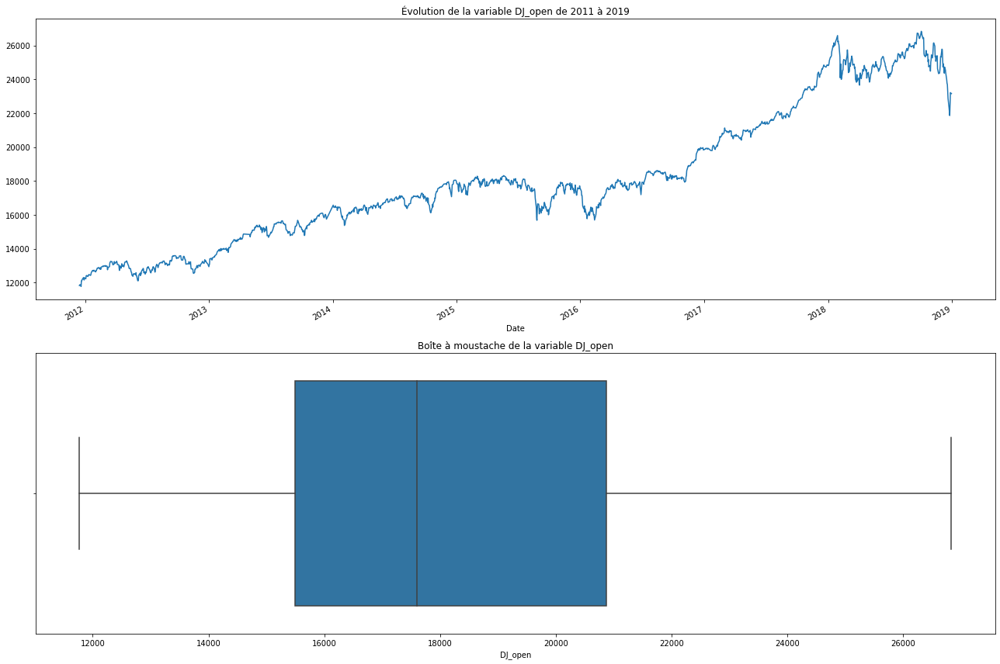

ÉTUDE DE LA VARIABLE "DJ_high"


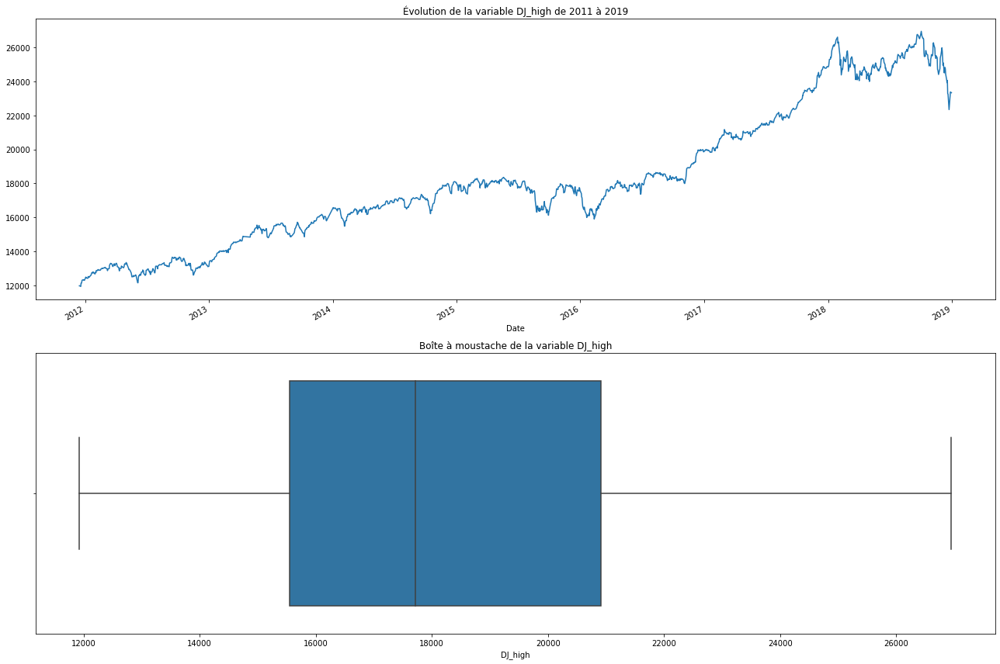

ÉTUDE DE LA VARIABLE "DJ_low"


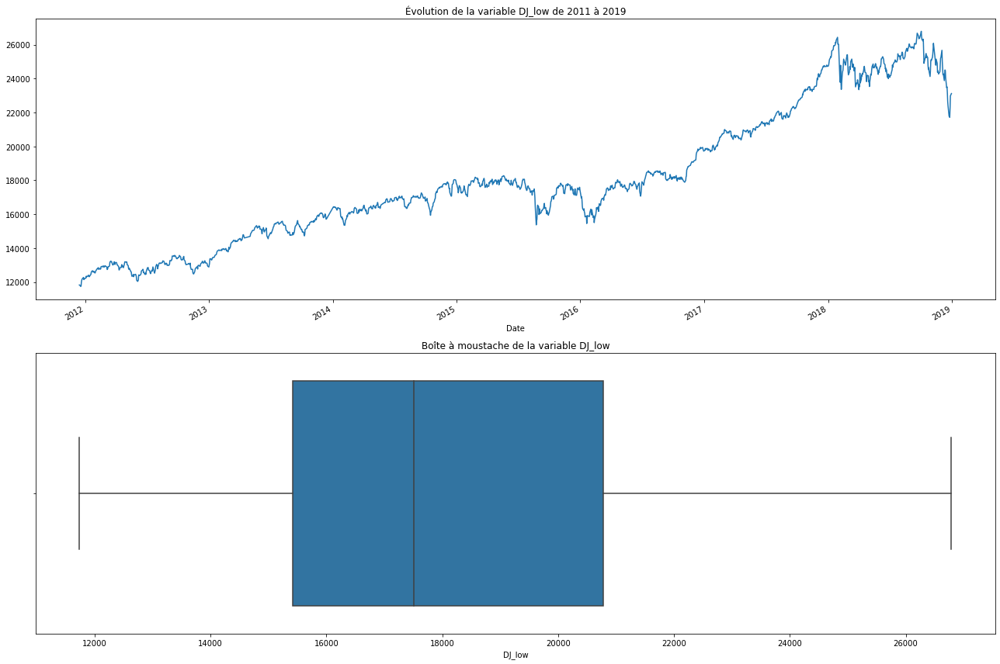

ÉTUDE DE LA VARIABLE "DJ_close"


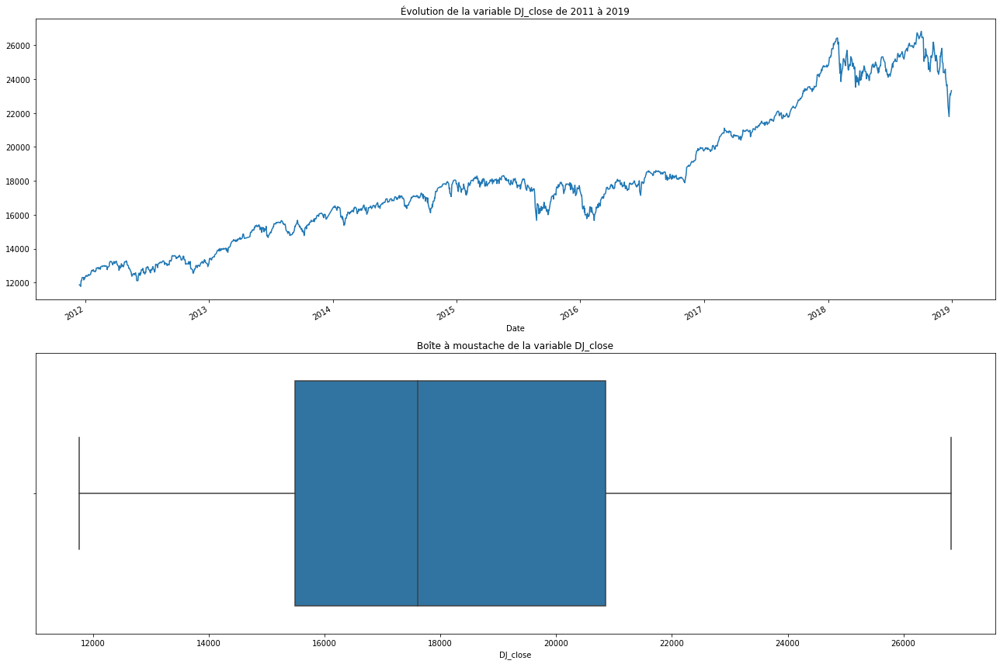

ÉTUDE DE LA VARIABLE "DJ_Ajclose"


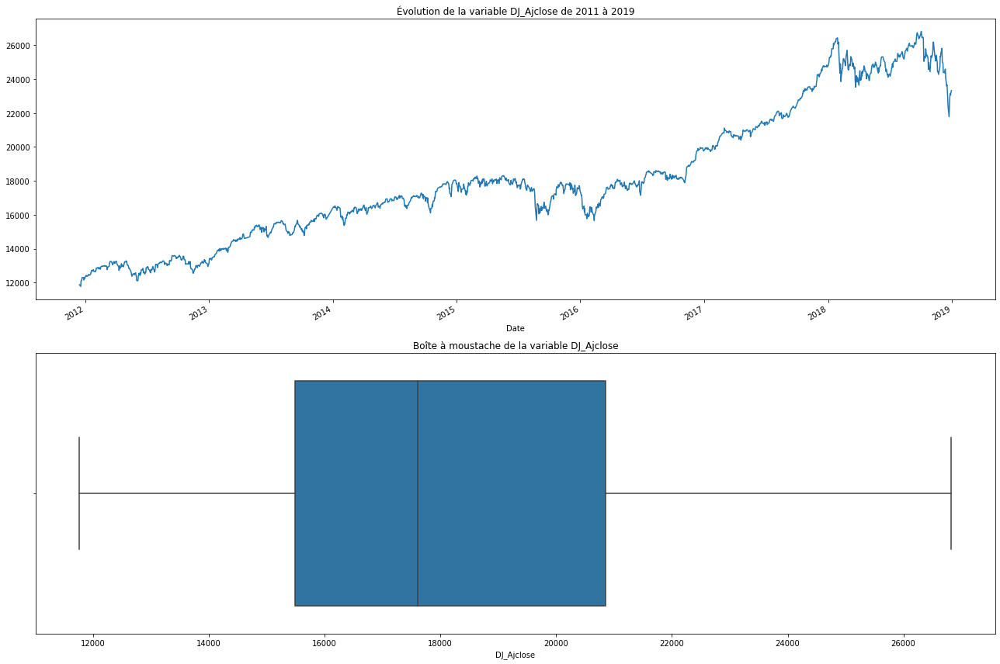

ÉTUDE DE LA VARIABLE "DJ_volume"


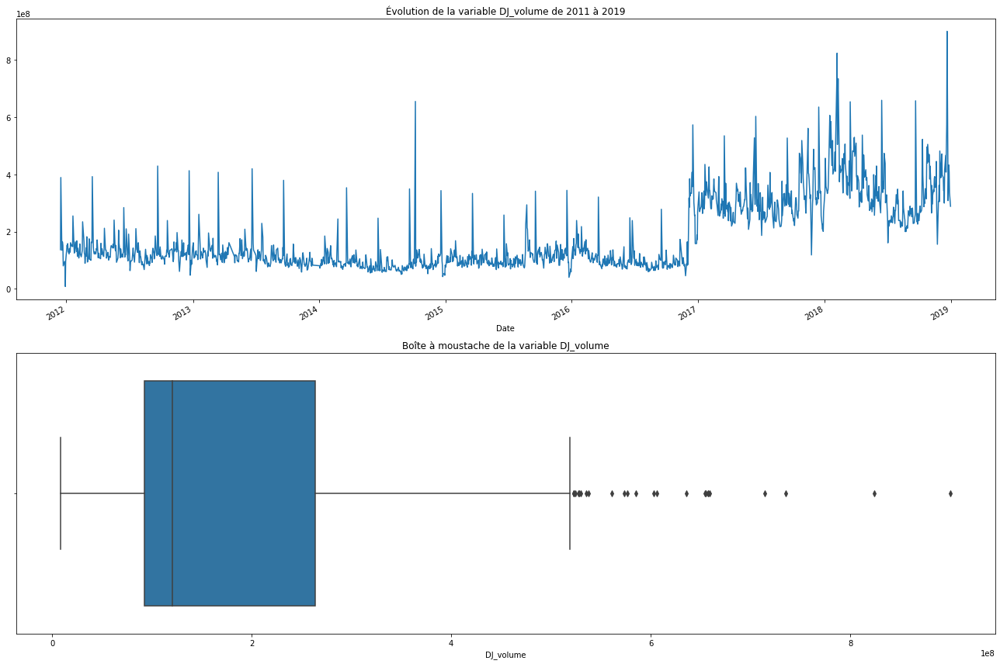

ÉTUDE DE LA VARIABLE "EG_open"


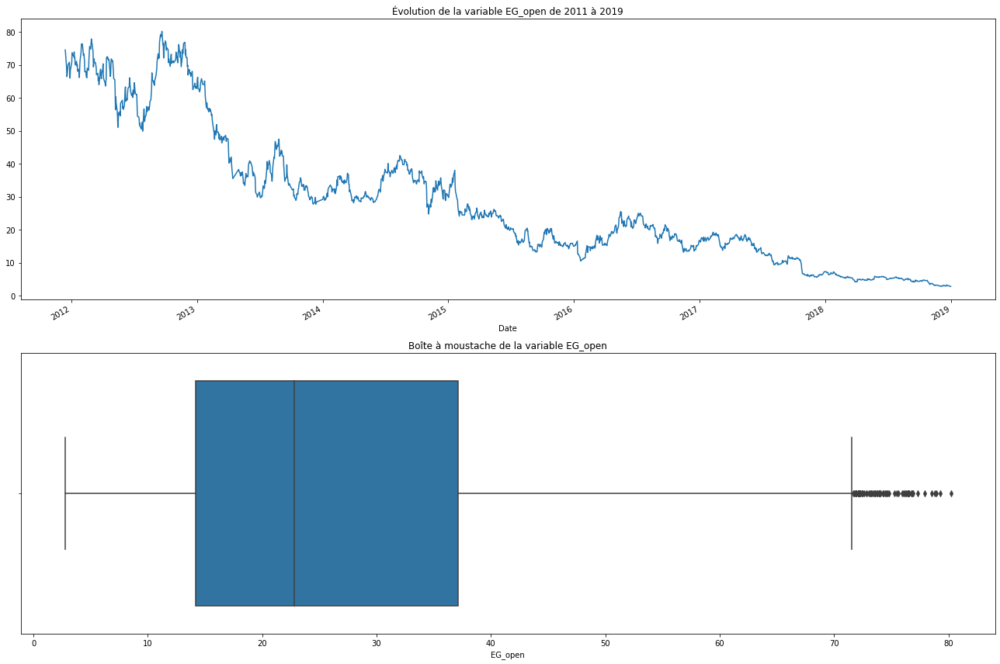

ÉTUDE DE LA VARIABLE "EG_high"


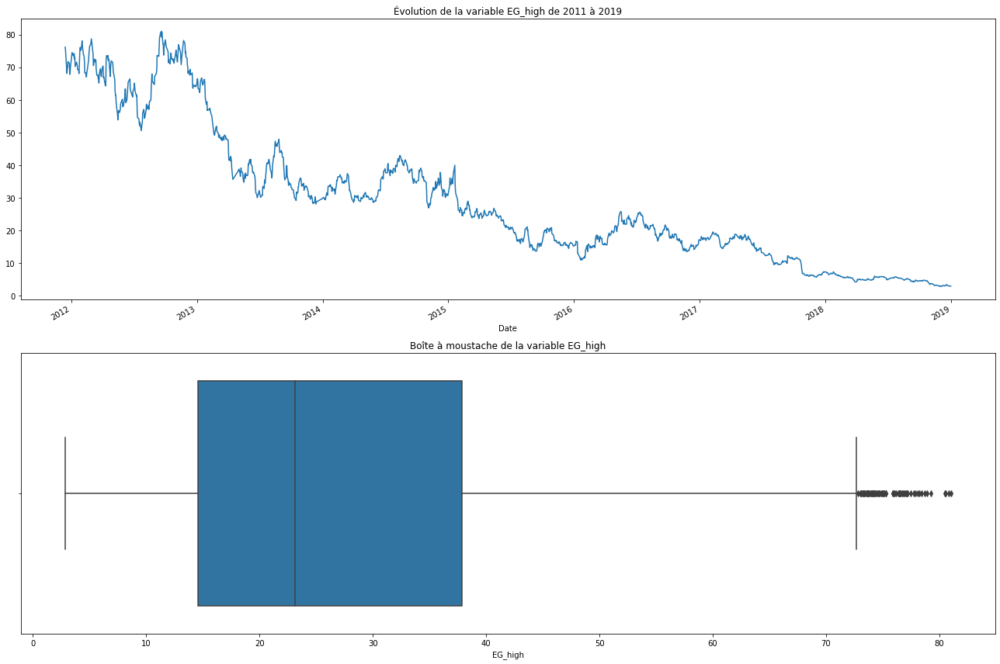

ÉTUDE DE LA VARIABLE "EG_low"


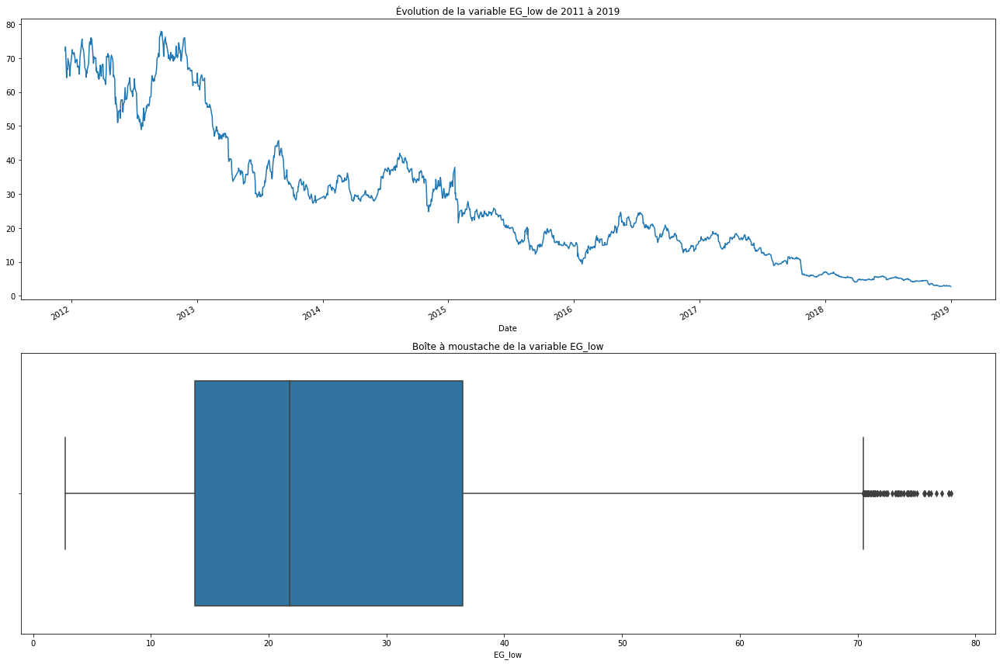

ÉTUDE DE LA VARIABLE "EG_close"


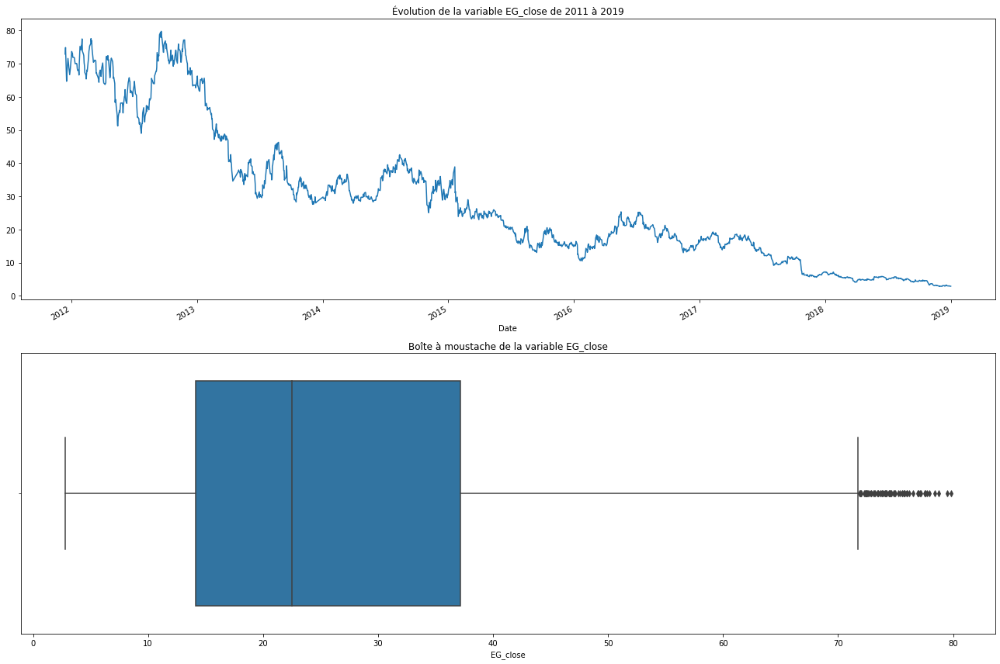

ÉTUDE DE LA VARIABLE "EG_Ajclose"


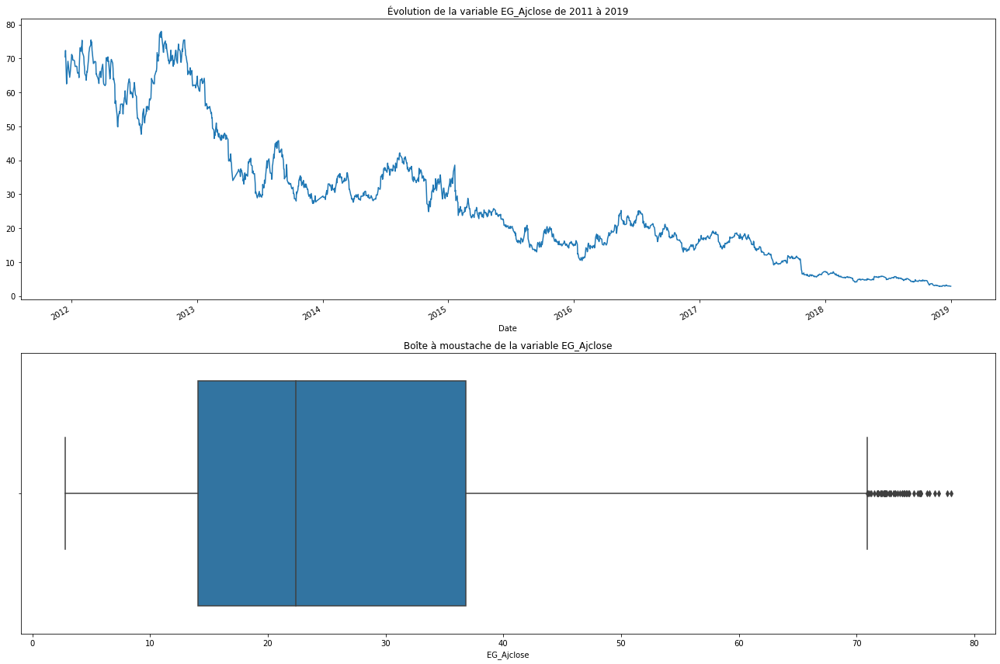

ÉTUDE DE LA VARIABLE "EG_volume"


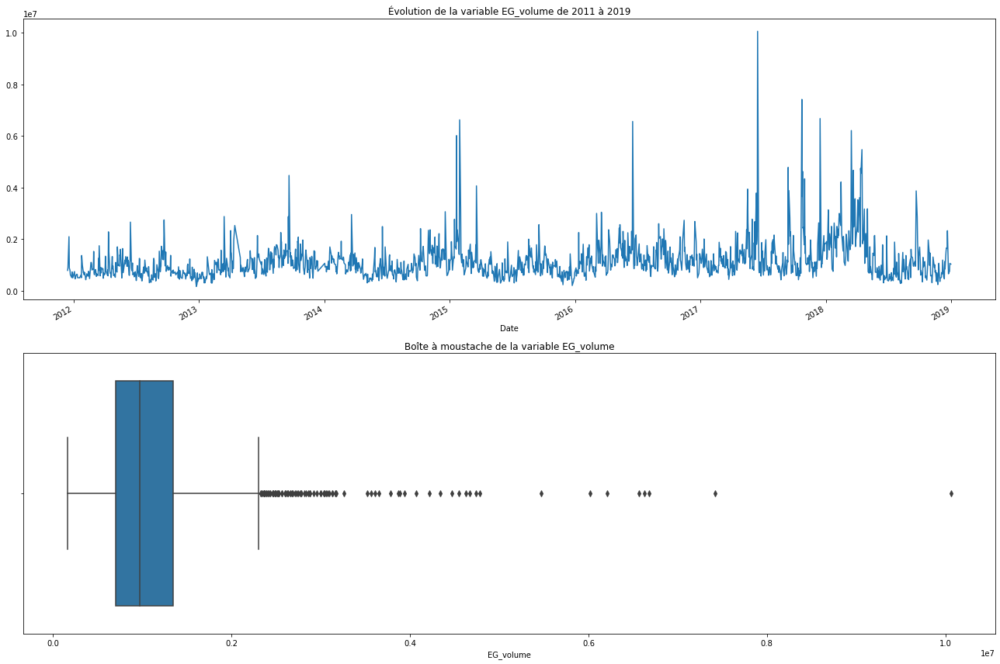

ÉTUDE DE LA VARIABLE "EU_Price"


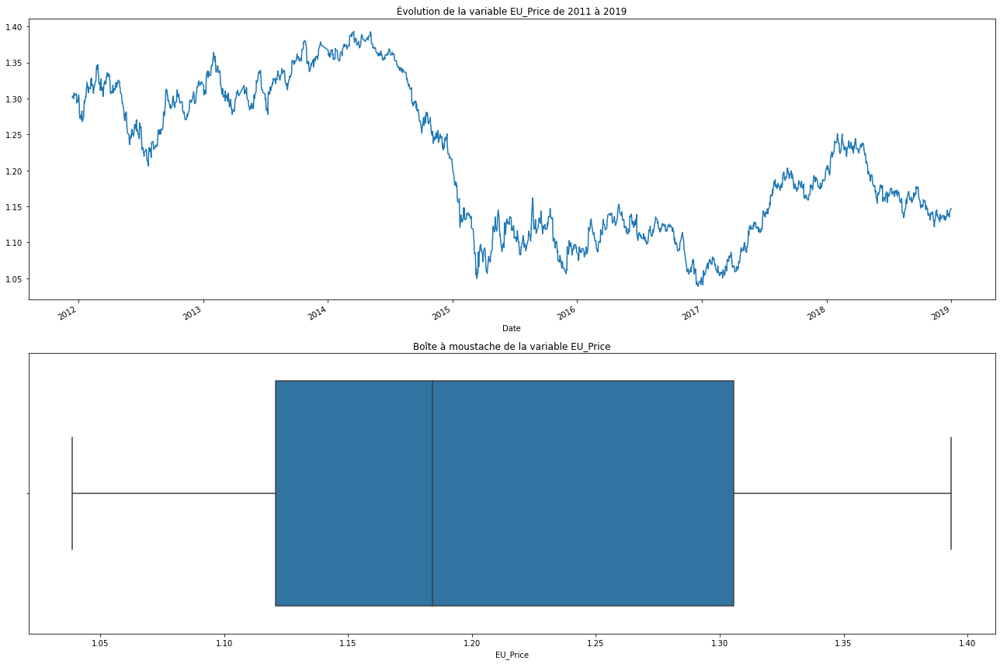

ÉTUDE DE LA VARIABLE "EU_open"


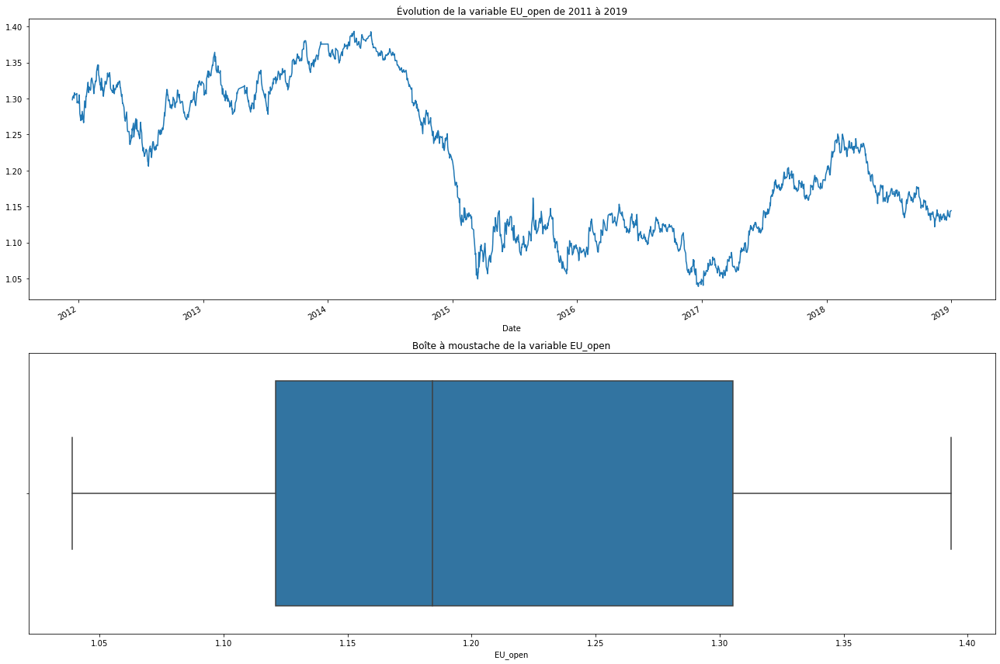

ÉTUDE DE LA VARIABLE "EU_high"


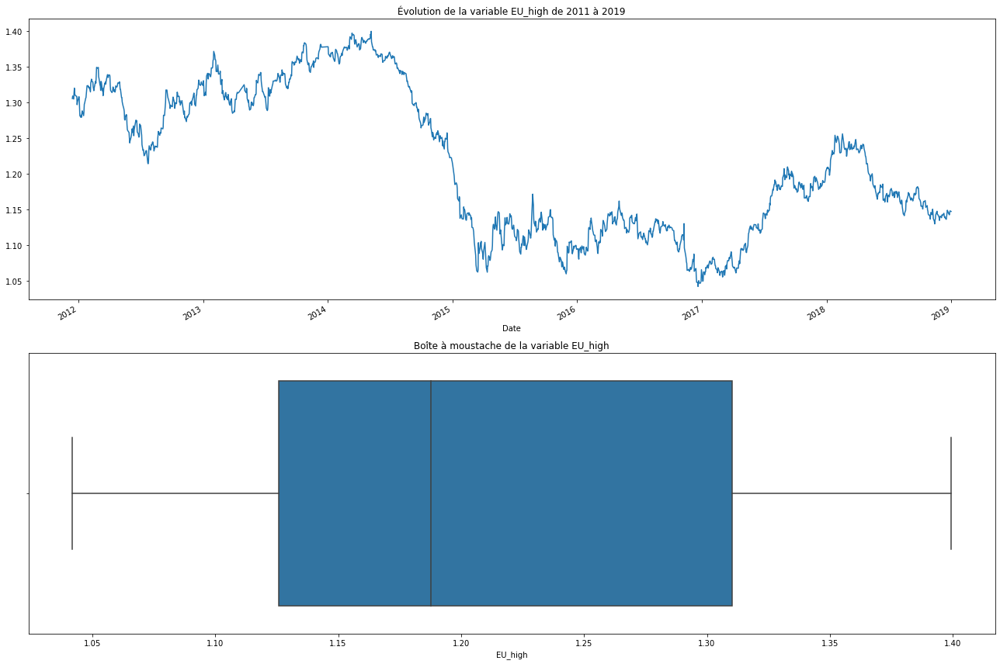

ÉTUDE DE LA VARIABLE "EU_low"


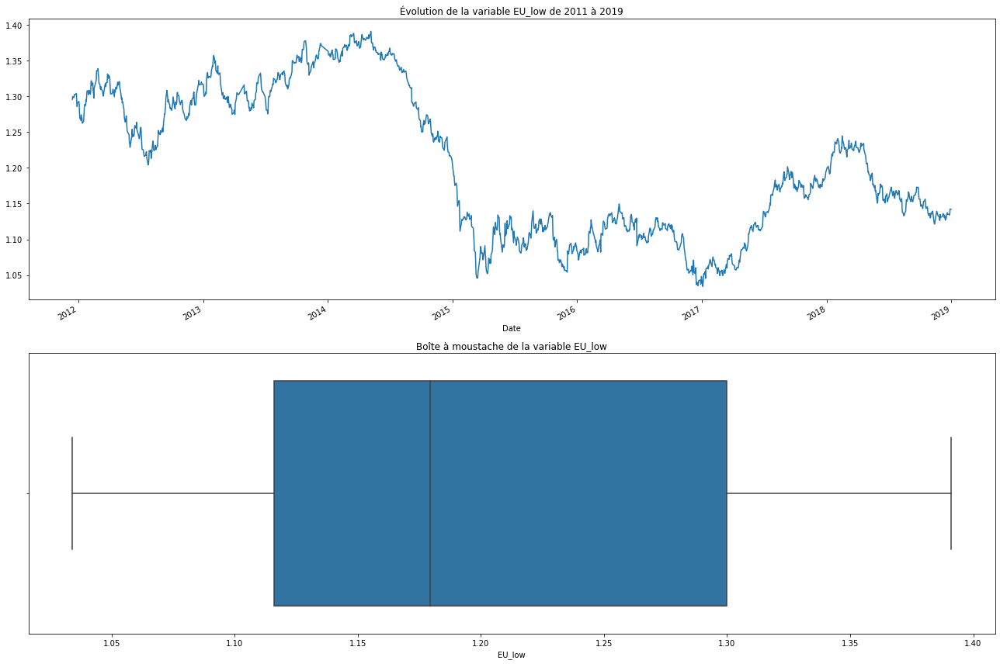

ÉTUDE DE LA VARIABLE "OF_Price"


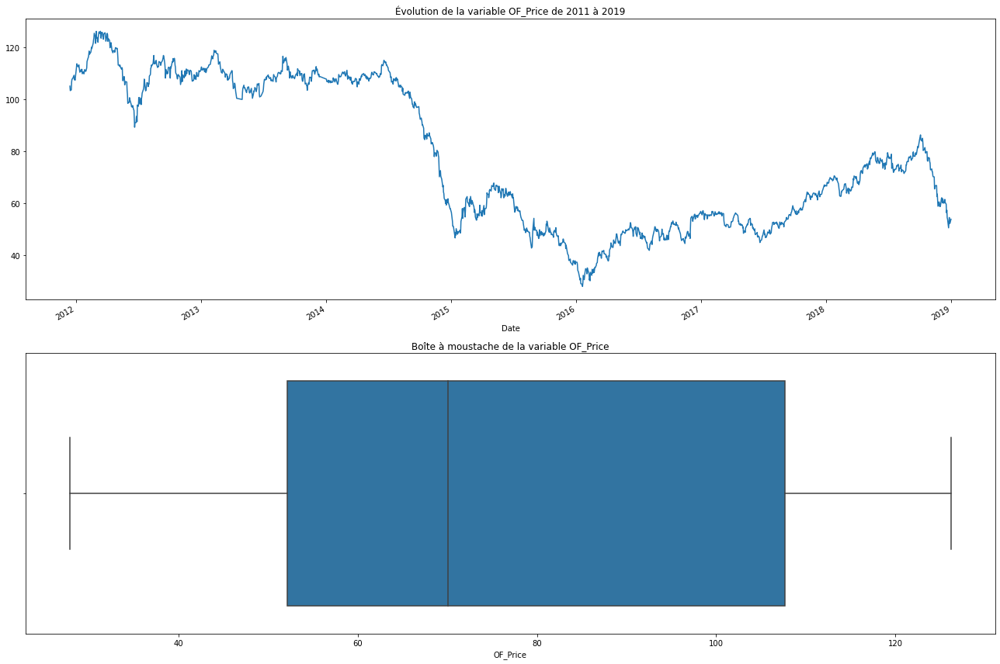

ÉTUDE DE LA VARIABLE "OF_Open"


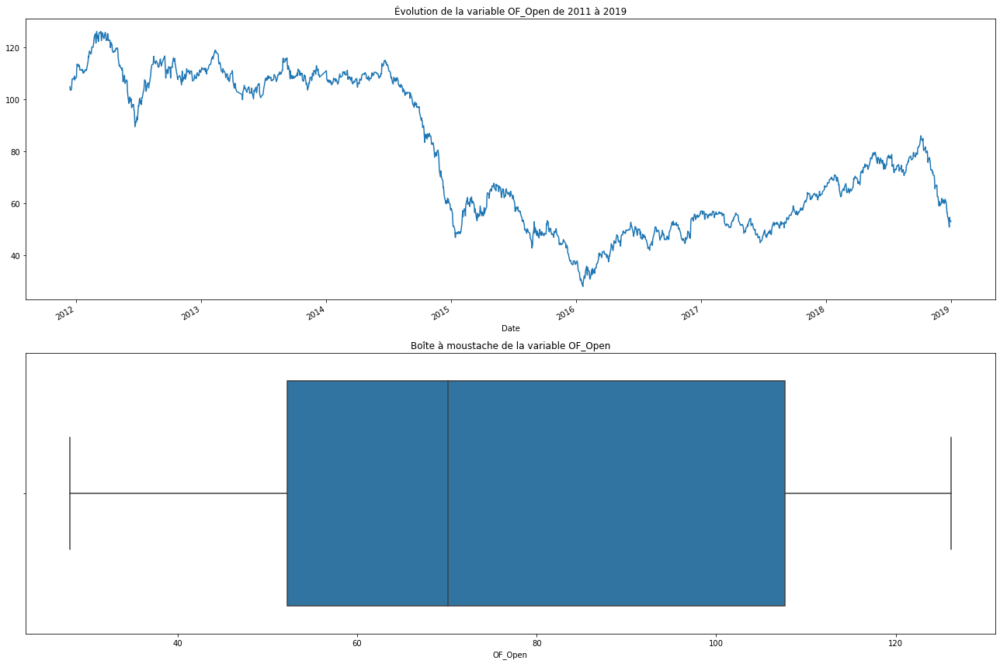

ÉTUDE DE LA VARIABLE "OF_High"


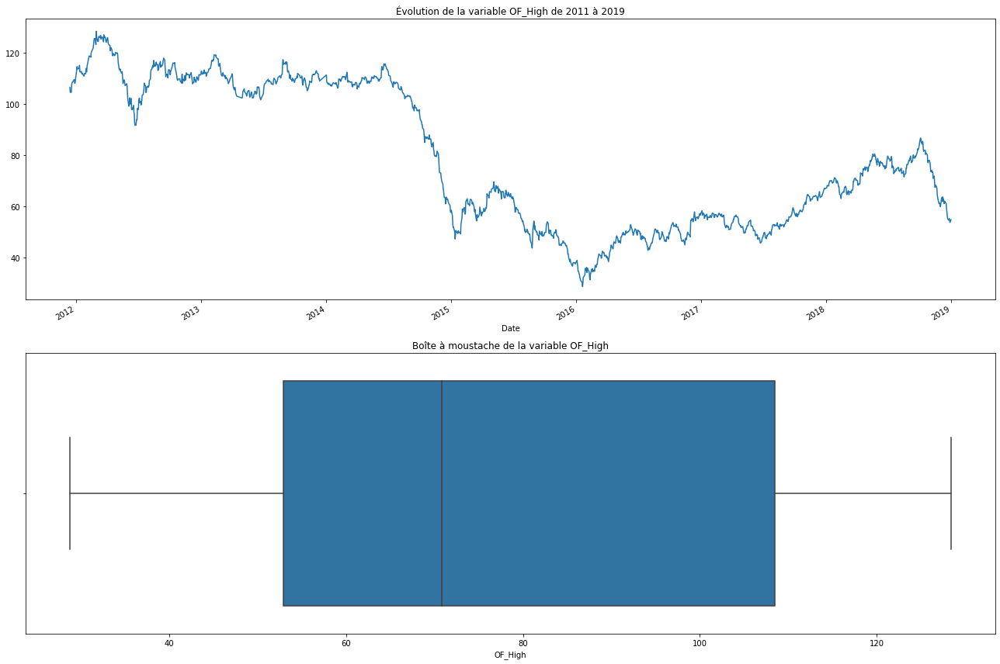

ÉTUDE DE LA VARIABLE "OF_Low"


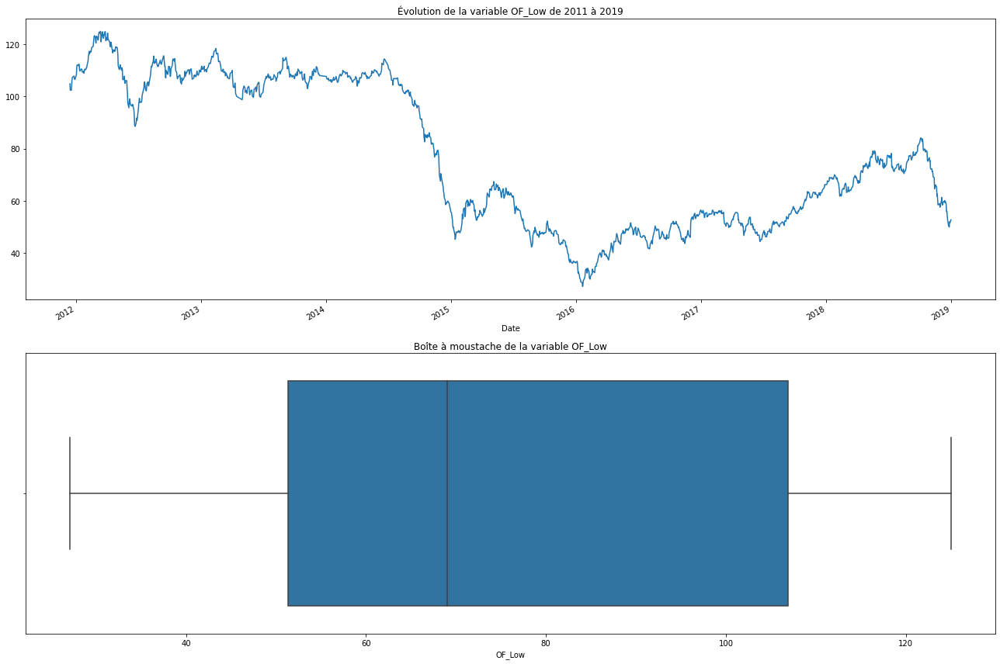

ÉTUDE DE LA VARIABLE "OF_Volume"


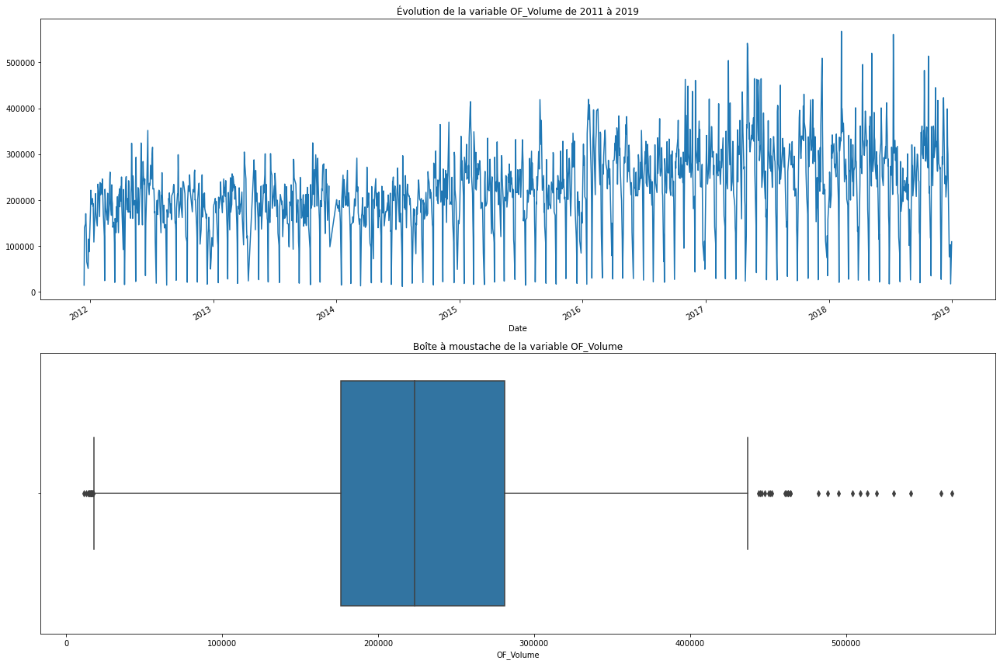

ÉTUDE DE LA VARIABLE "OS_Price"


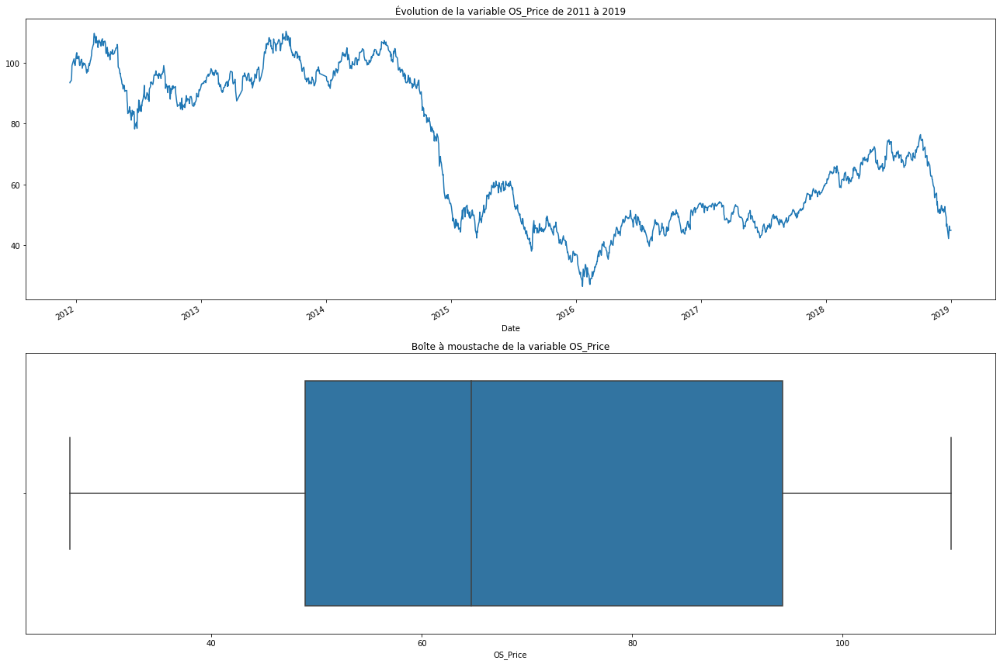

ÉTUDE DE LA VARIABLE "OS_Open"


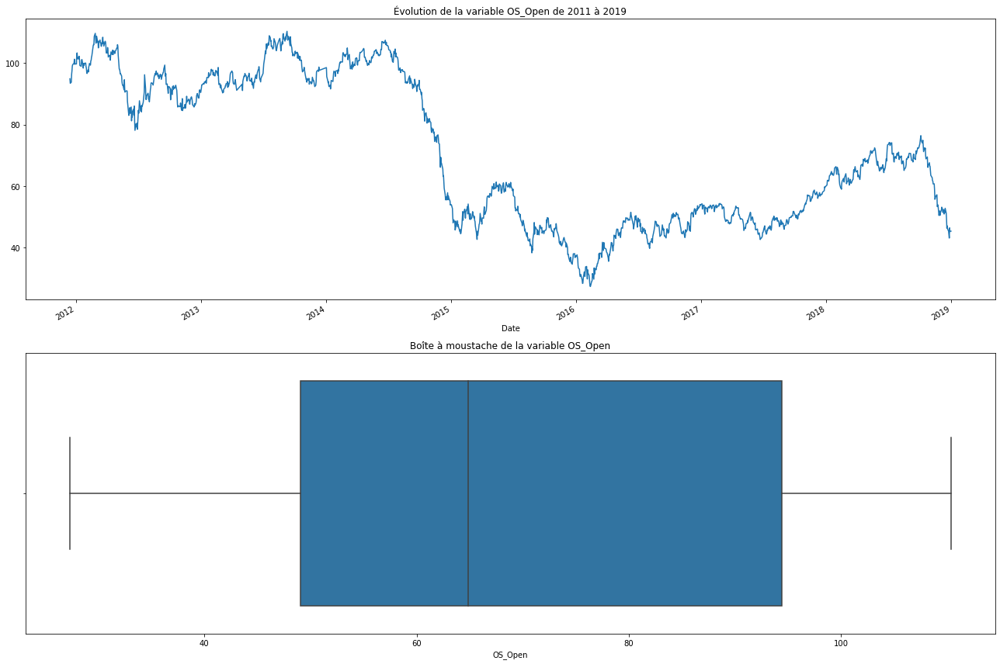

ÉTUDE DE LA VARIABLE "OS_High"


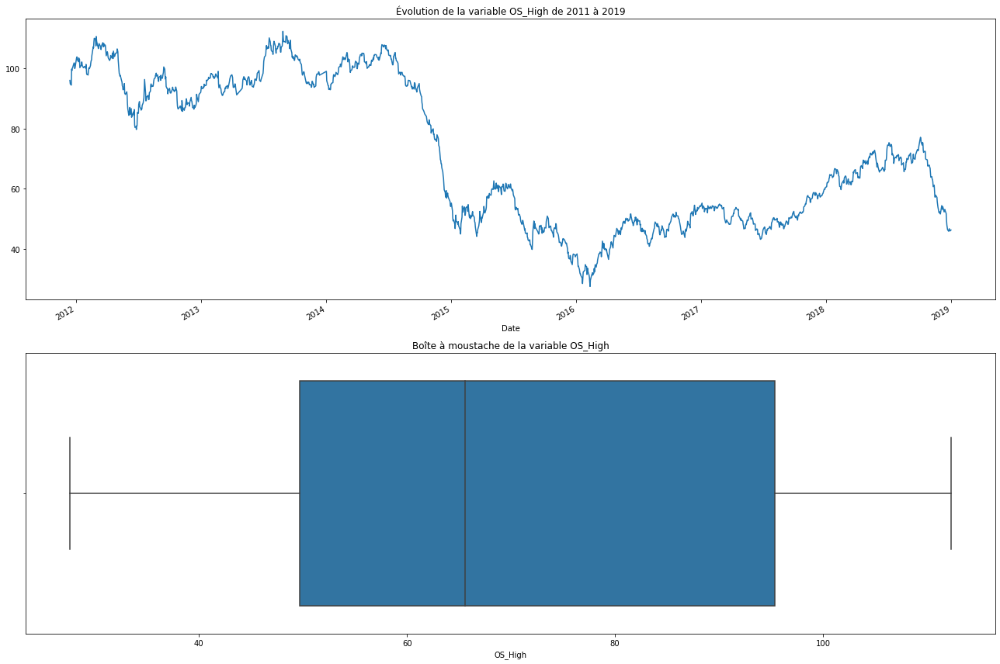

ÉTUDE DE LA VARIABLE "OS_Low"


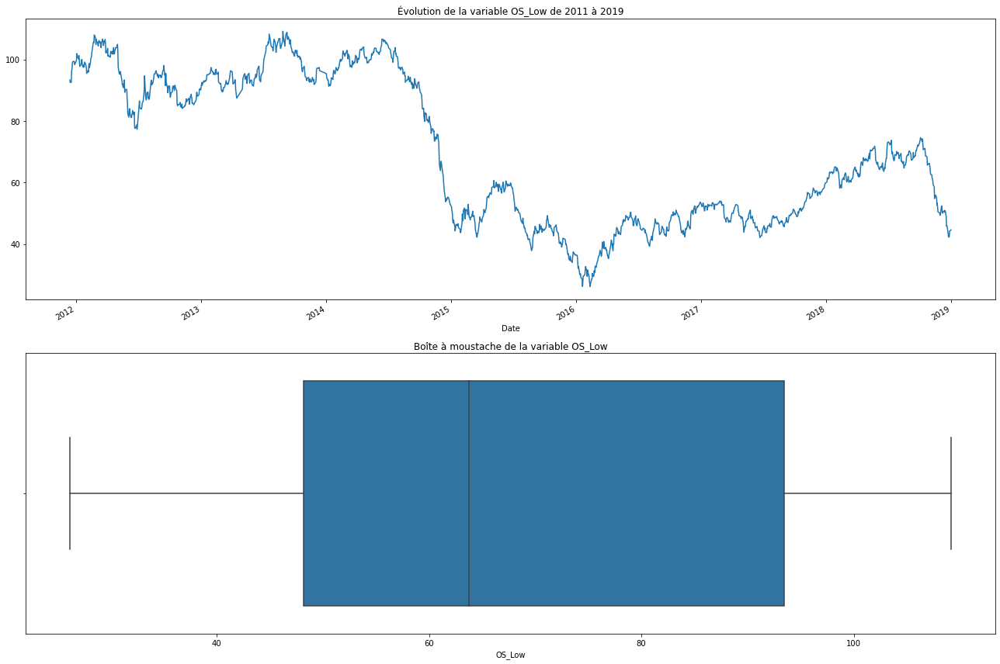

ÉTUDE DE LA VARIABLE "SF_Price"


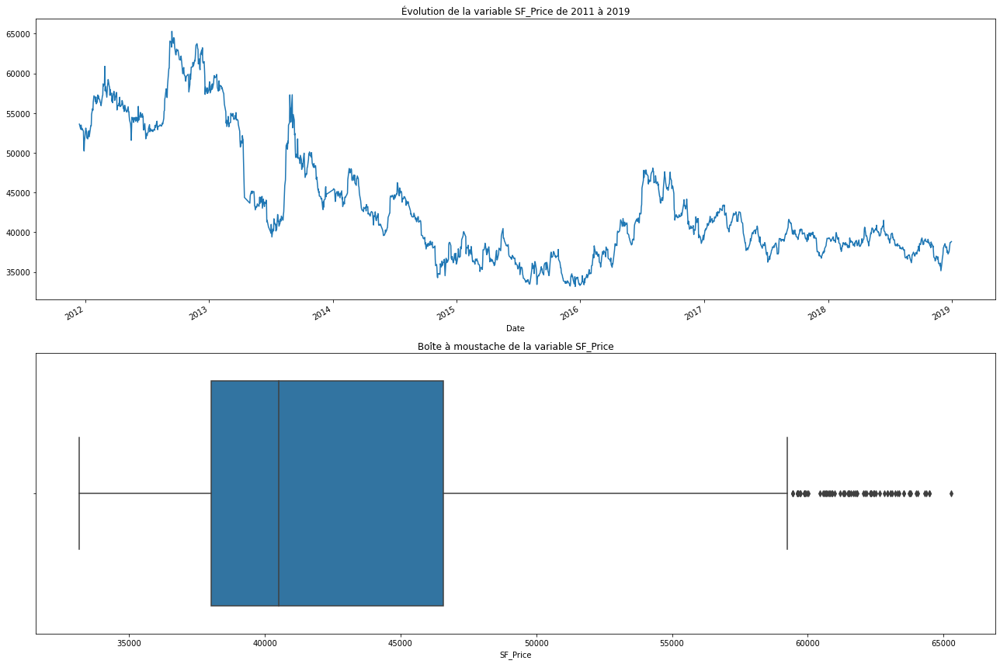

ÉTUDE DE LA VARIABLE "SF_Open"


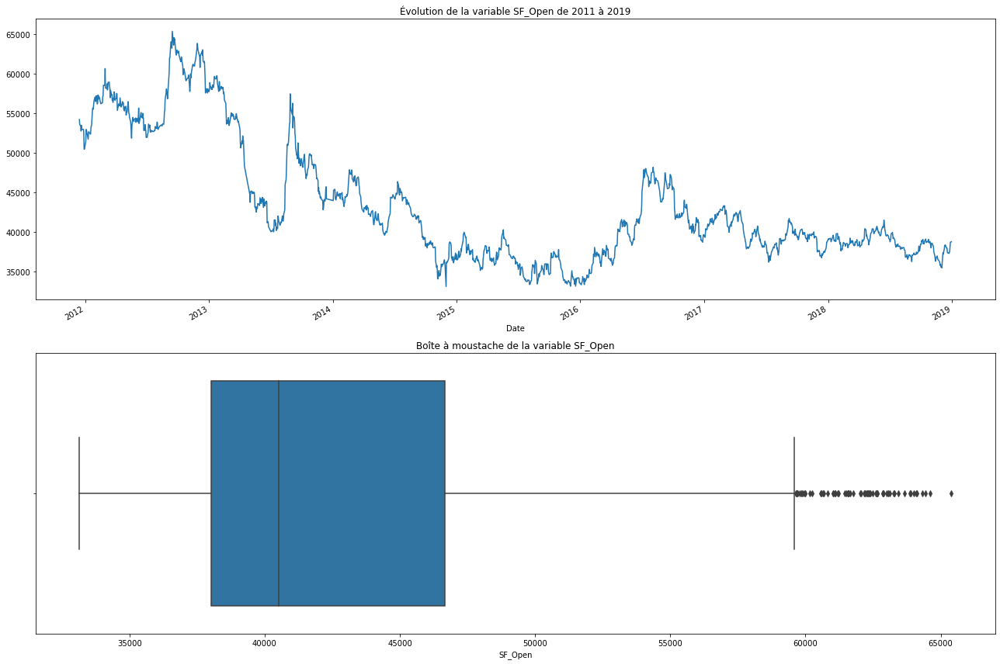

ÉTUDE DE LA VARIABLE "SF_High"


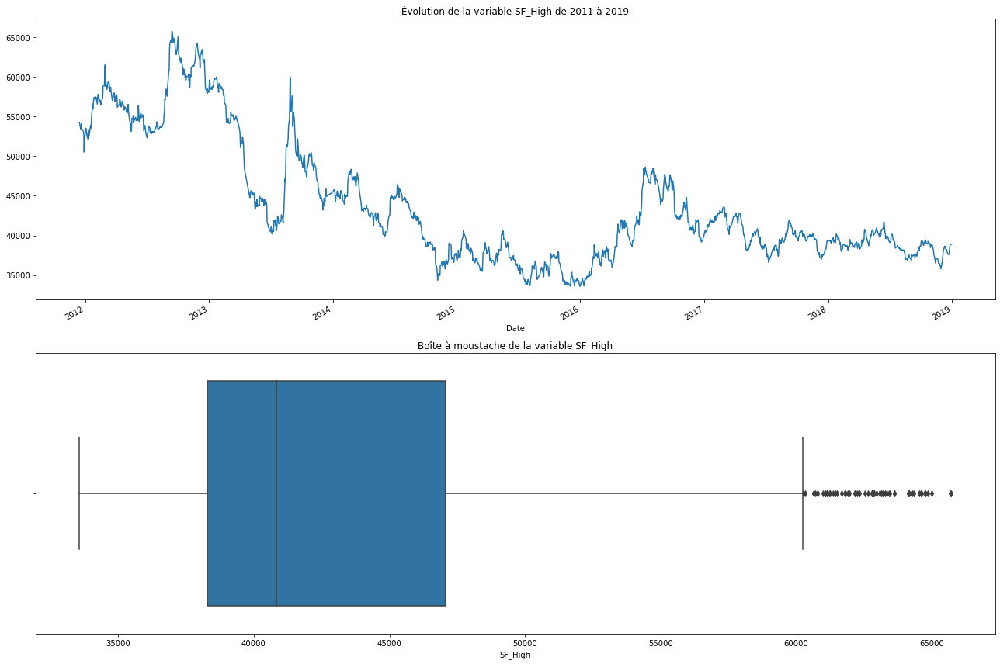

ÉTUDE DE LA VARIABLE "SF_Low"


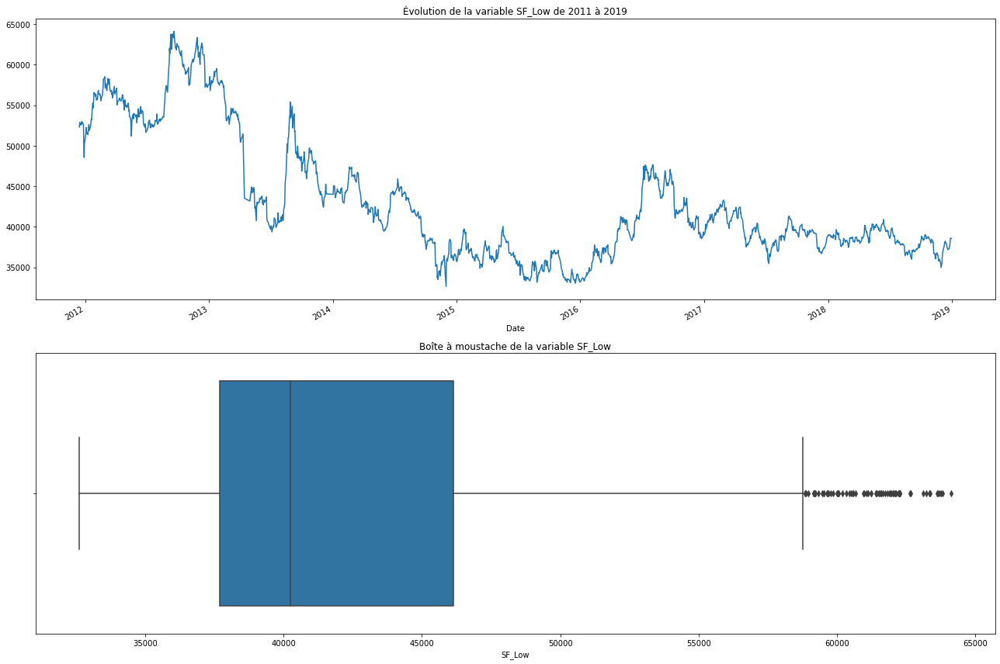

ÉTUDE DE LA VARIABLE "SF_Volume"


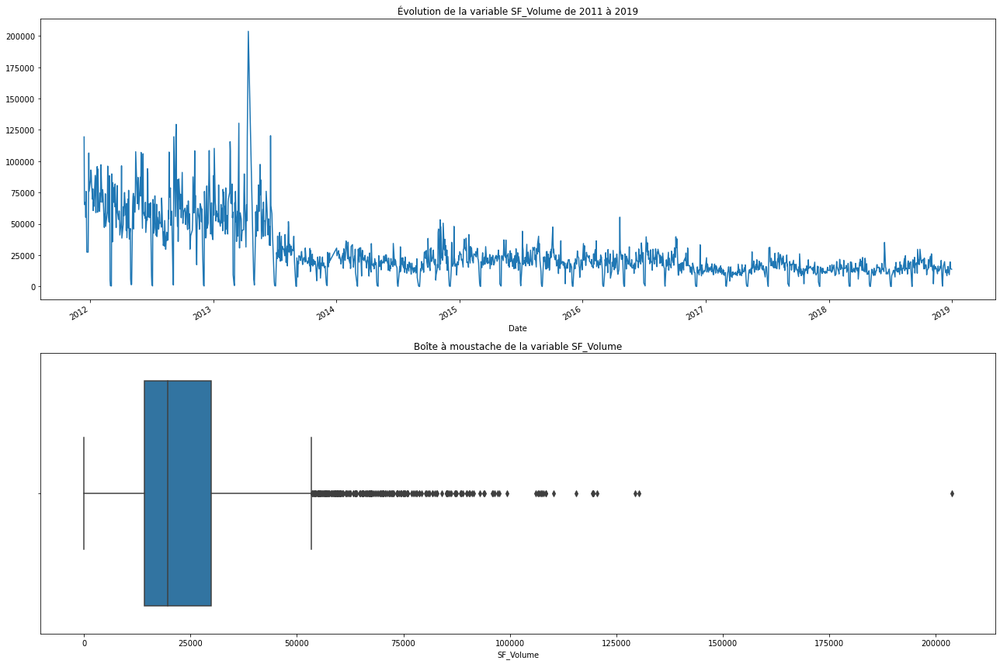

ÉTUDE DE LA VARIABLE "USB_Price"


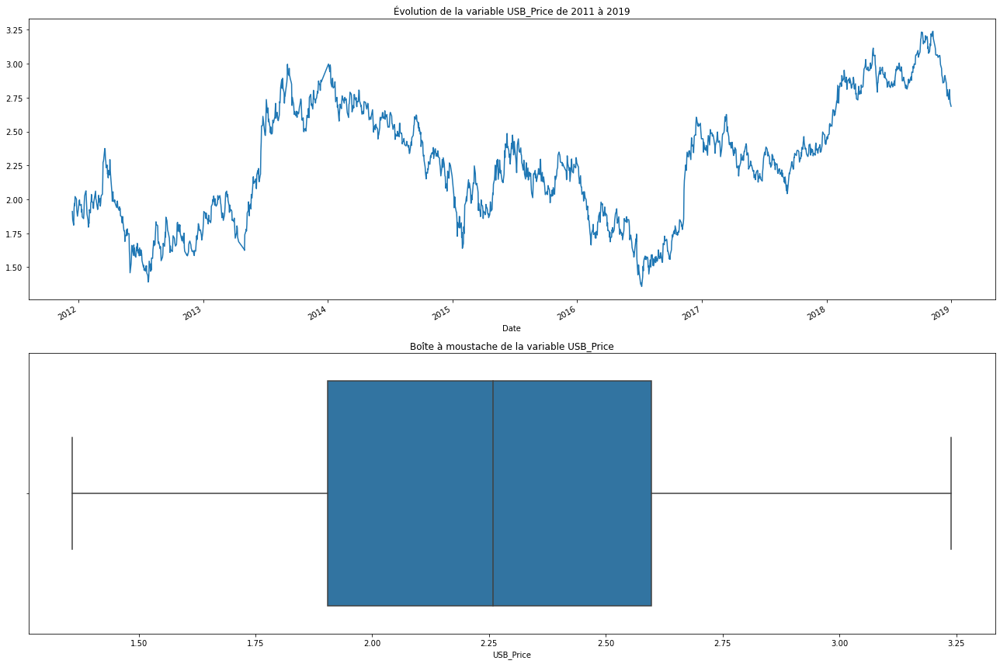

ÉTUDE DE LA VARIABLE "USB_Open"


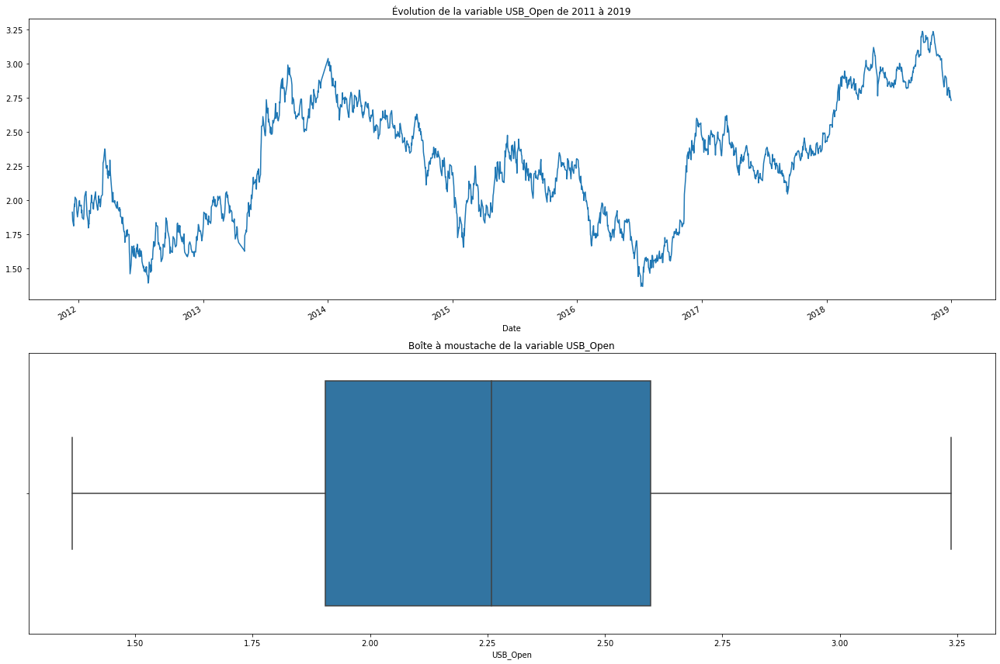

ÉTUDE DE LA VARIABLE "USB_High"


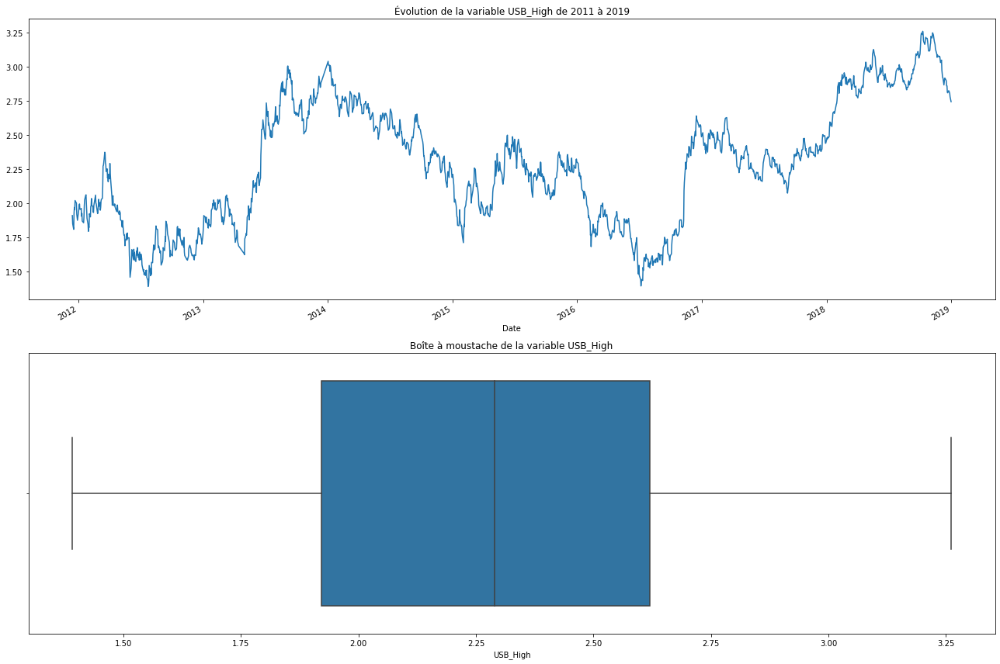

ÉTUDE DE LA VARIABLE "USB_Low"


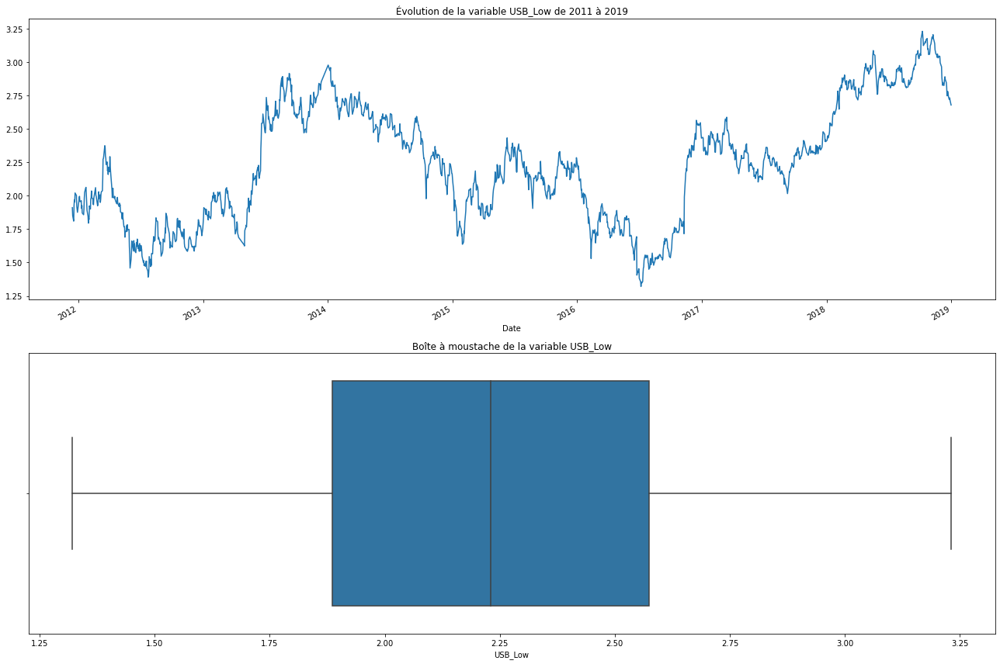

ÉTUDE DE LA VARIABLE "PLT_Price"


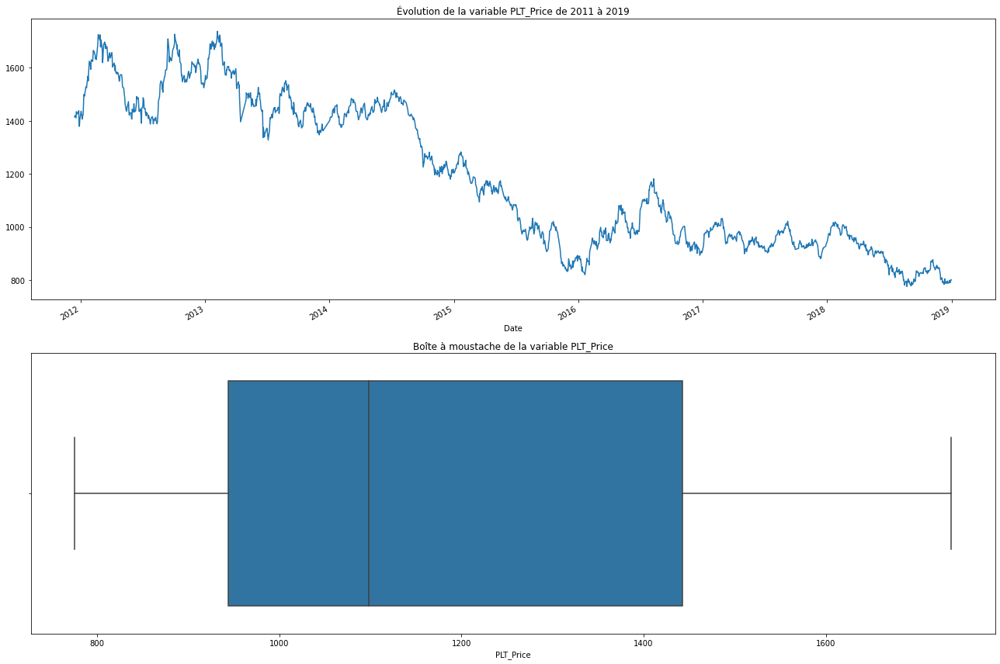

ÉTUDE DE LA VARIABLE "PLT_Open"


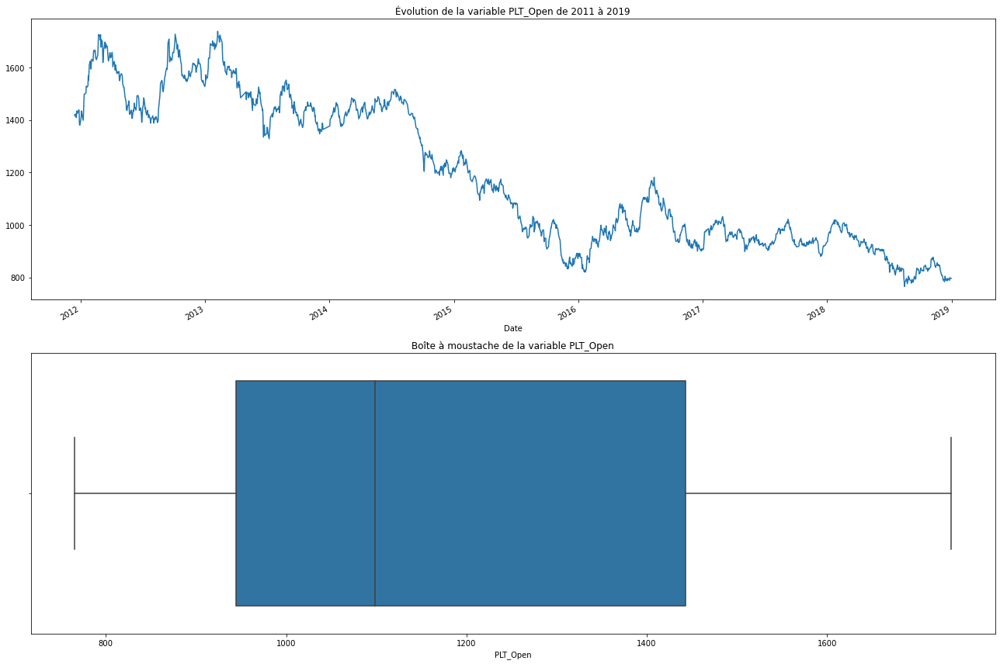

ÉTUDE DE LA VARIABLE "PLT_High"


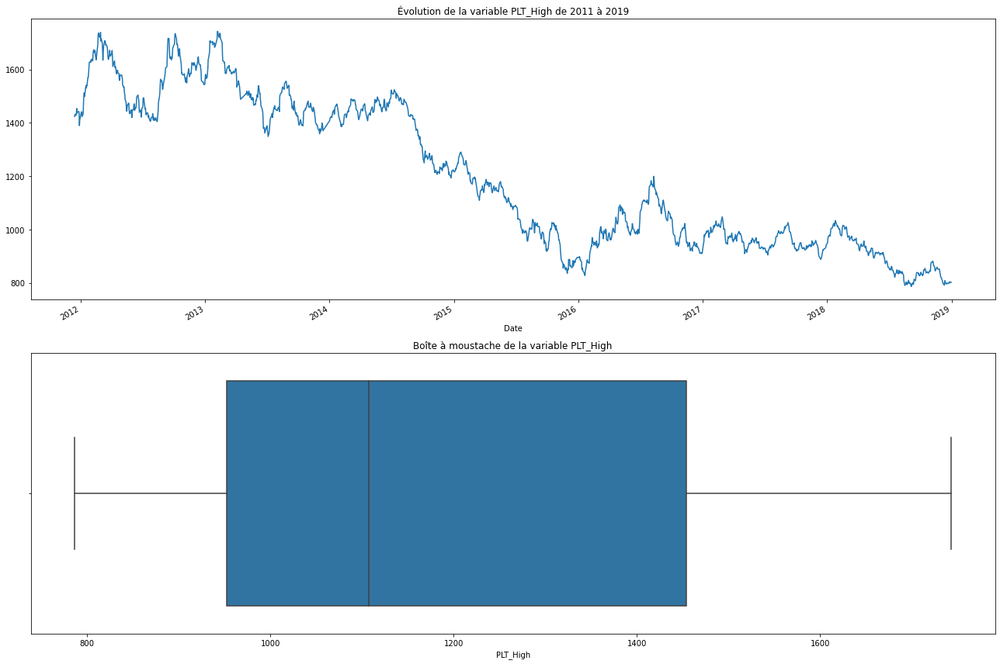

ÉTUDE DE LA VARIABLE "PLT_Low"


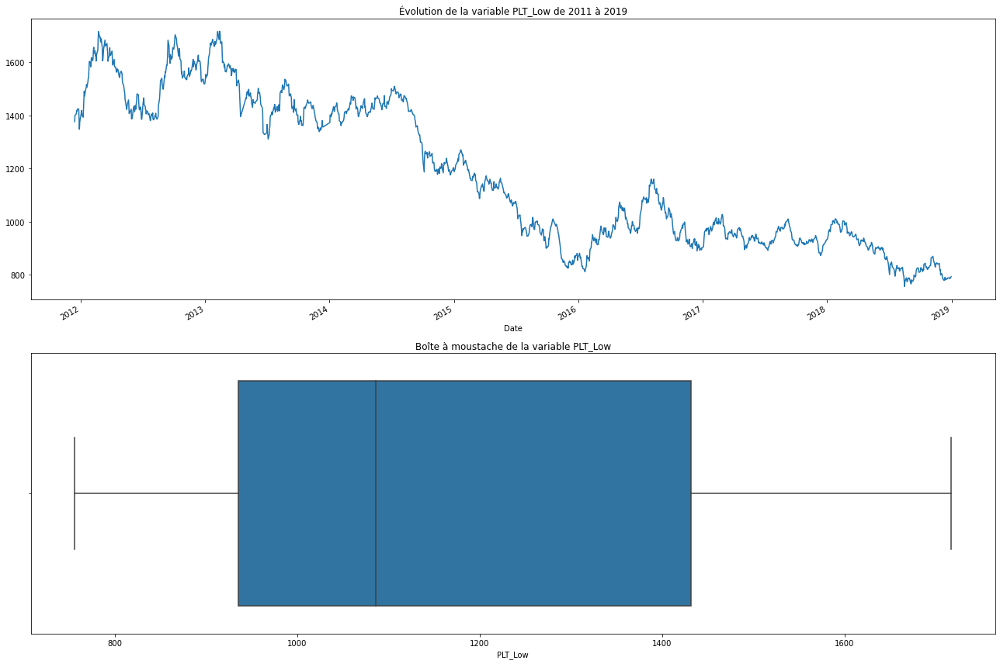

ÉTUDE DE LA VARIABLE "PLD_Price"


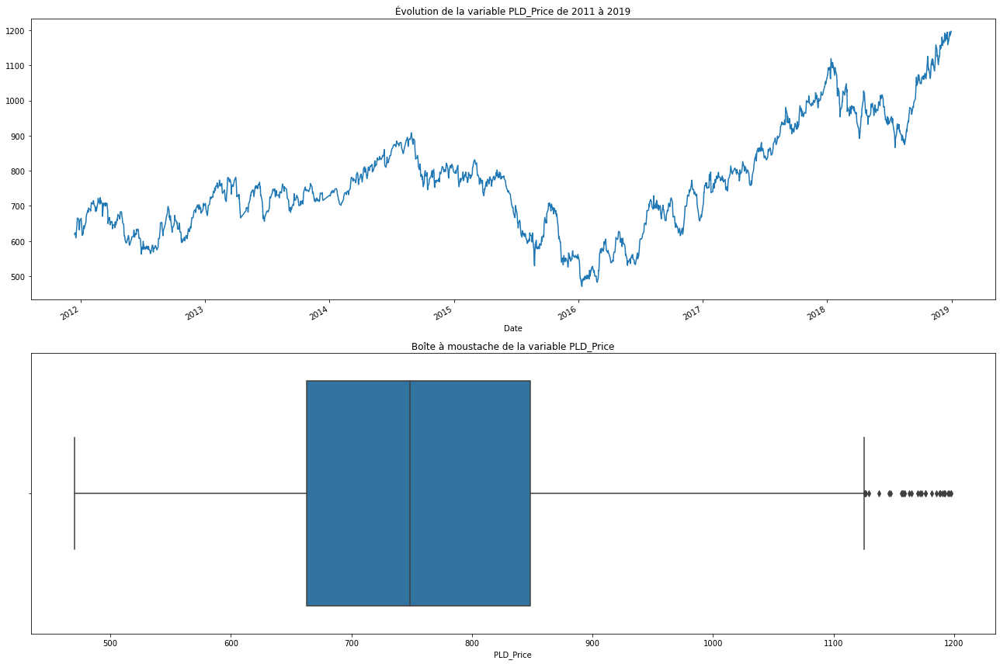

ÉTUDE DE LA VARIABLE "PLD_Open"


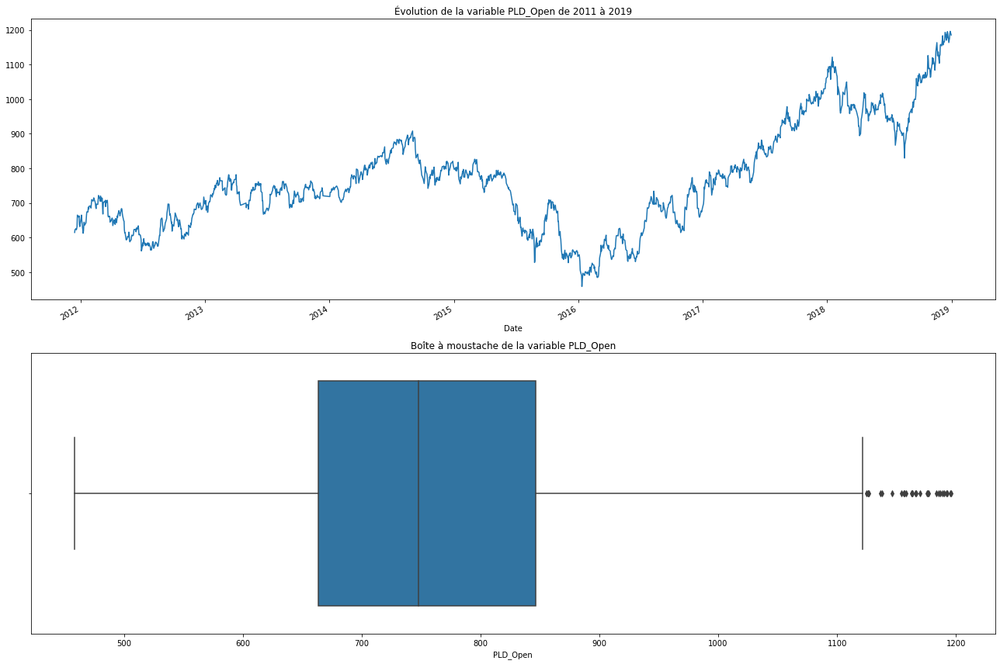

ÉTUDE DE LA VARIABLE "PLD_High"


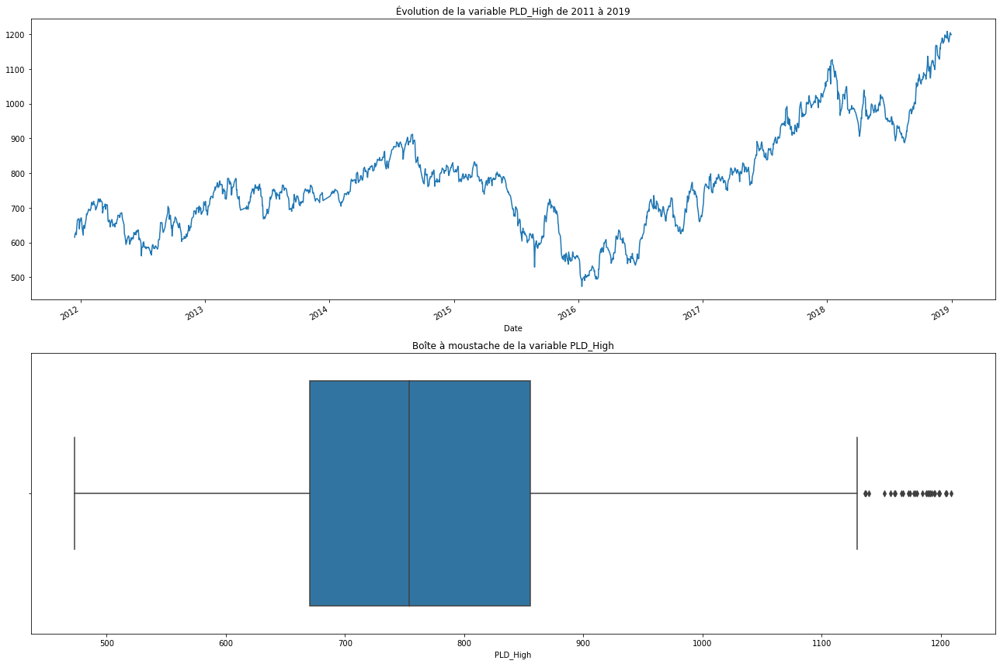

ÉTUDE DE LA VARIABLE "PLD_Low"


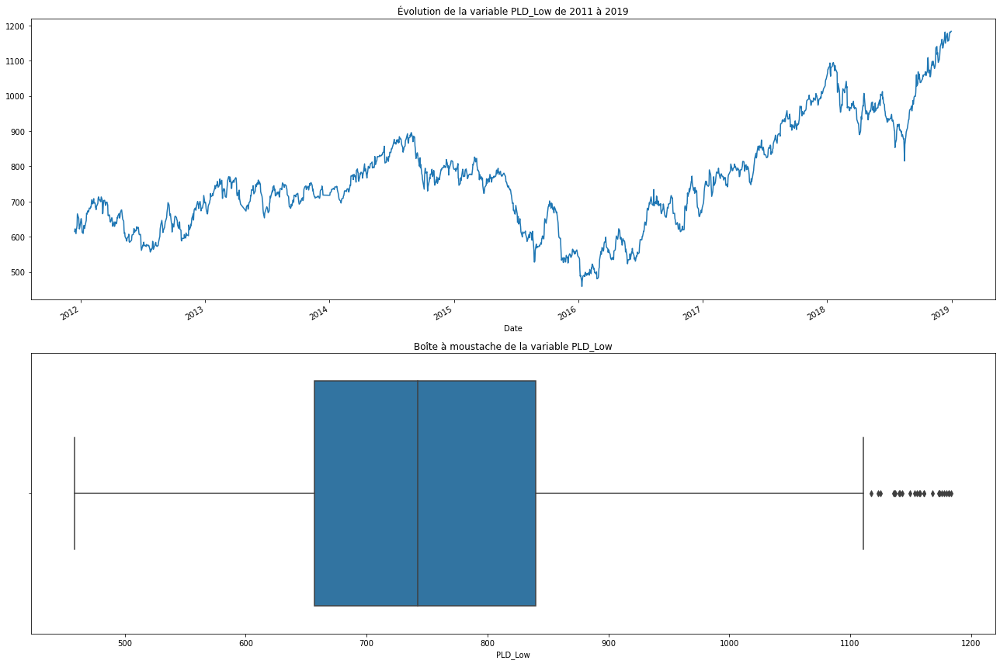

ÉTUDE DE LA VARIABLE "RHO_PRICE"


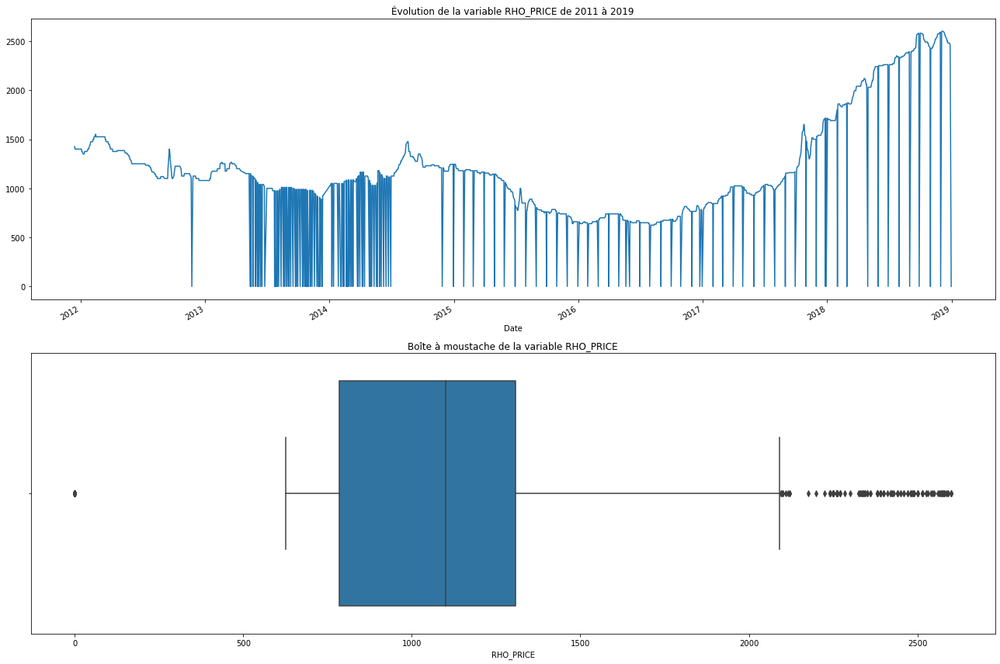

ÉTUDE DE LA VARIABLE "USDI_Price"


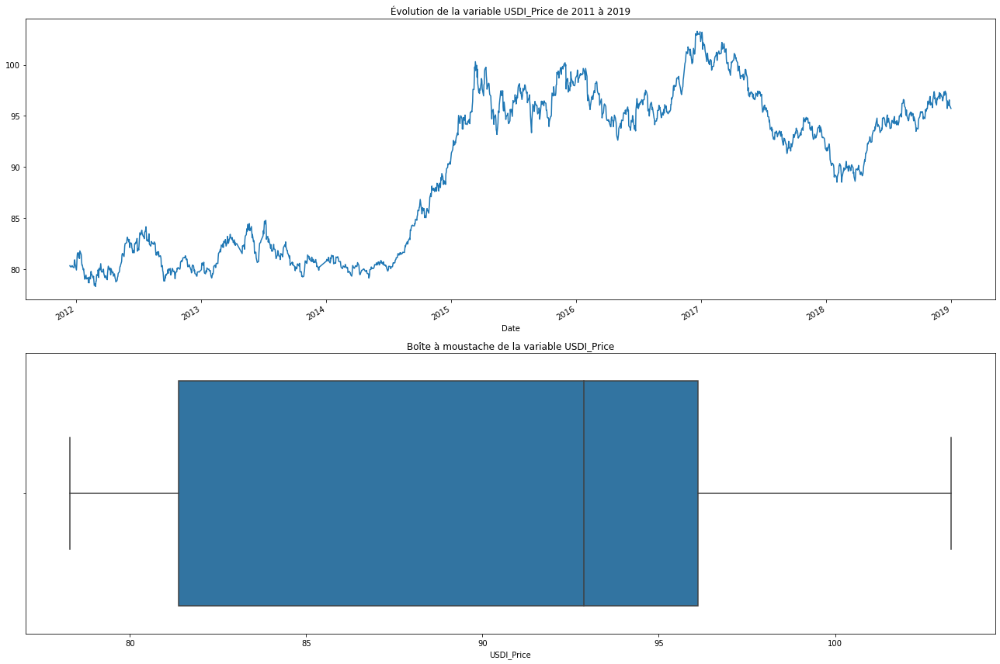

ÉTUDE DE LA VARIABLE "USDI_Open"


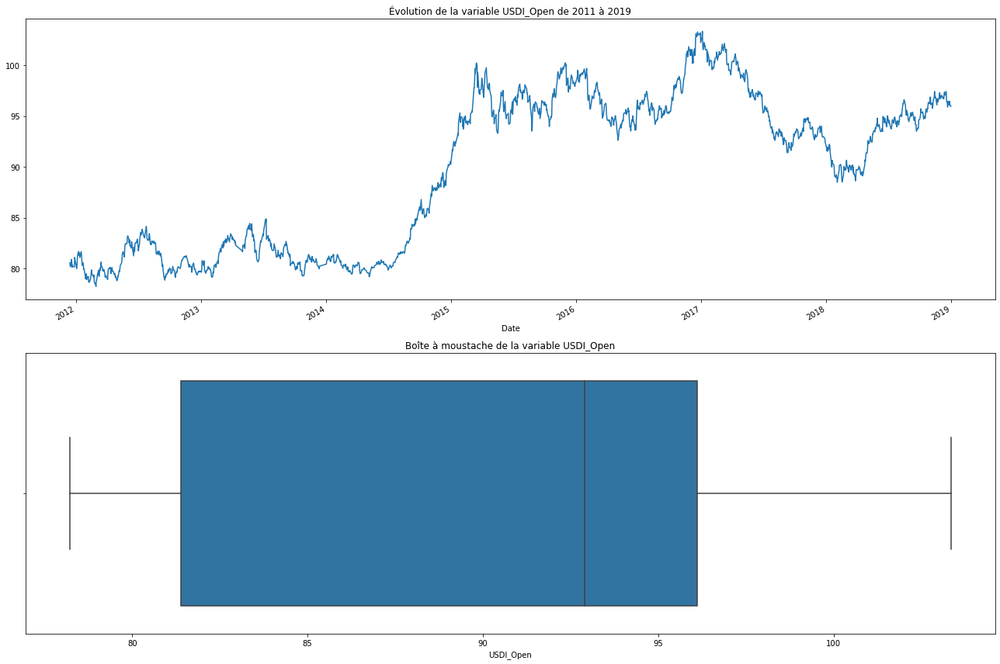

ÉTUDE DE LA VARIABLE "USDI_High"


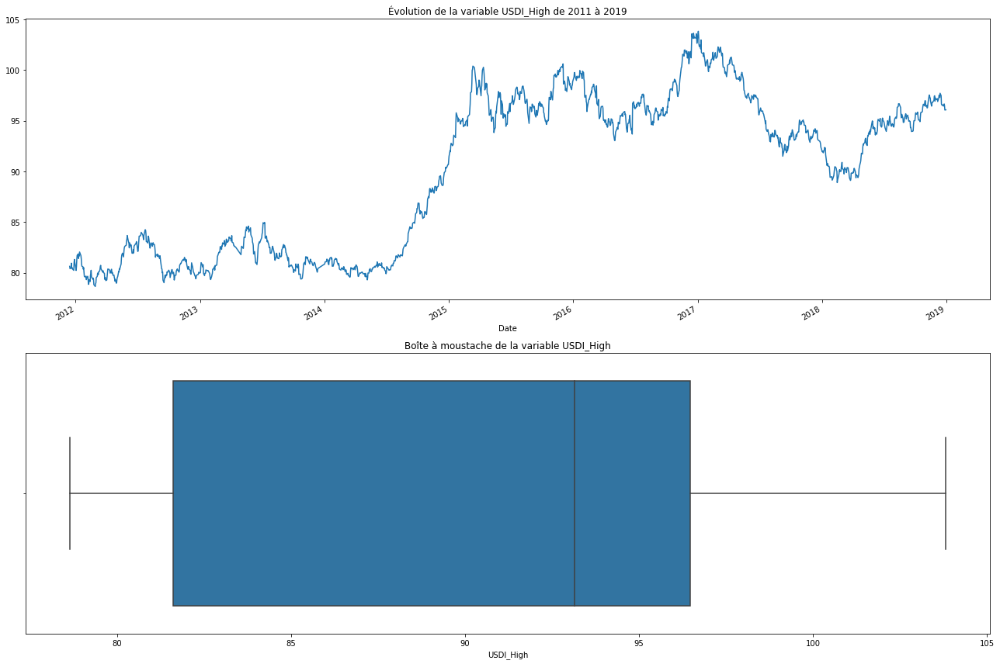

ÉTUDE DE LA VARIABLE "USDI_Low"


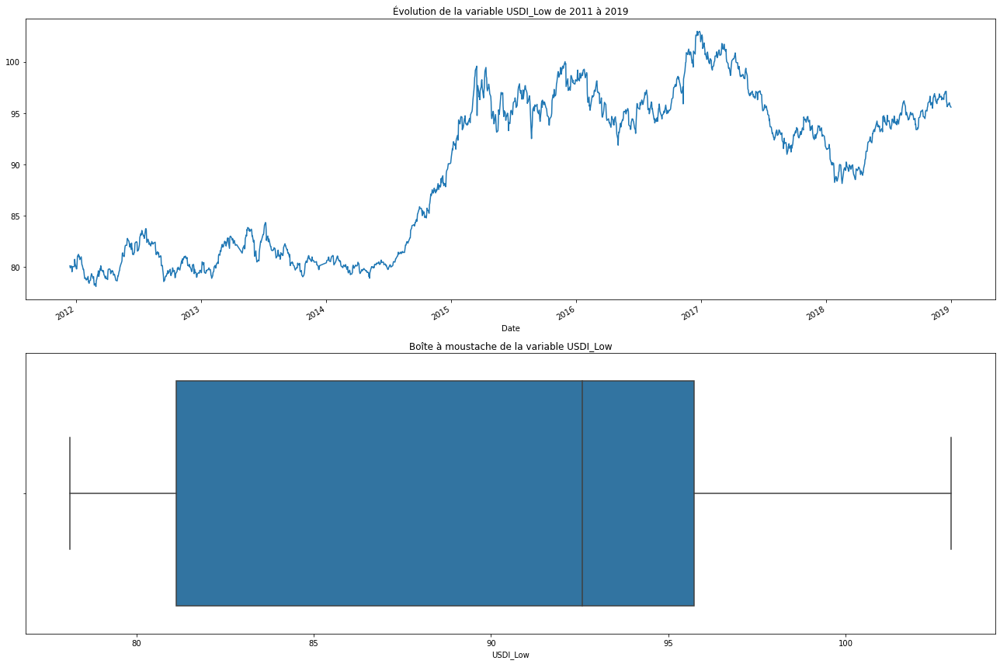

ÉTUDE DE LA VARIABLE "USDI_Volume"


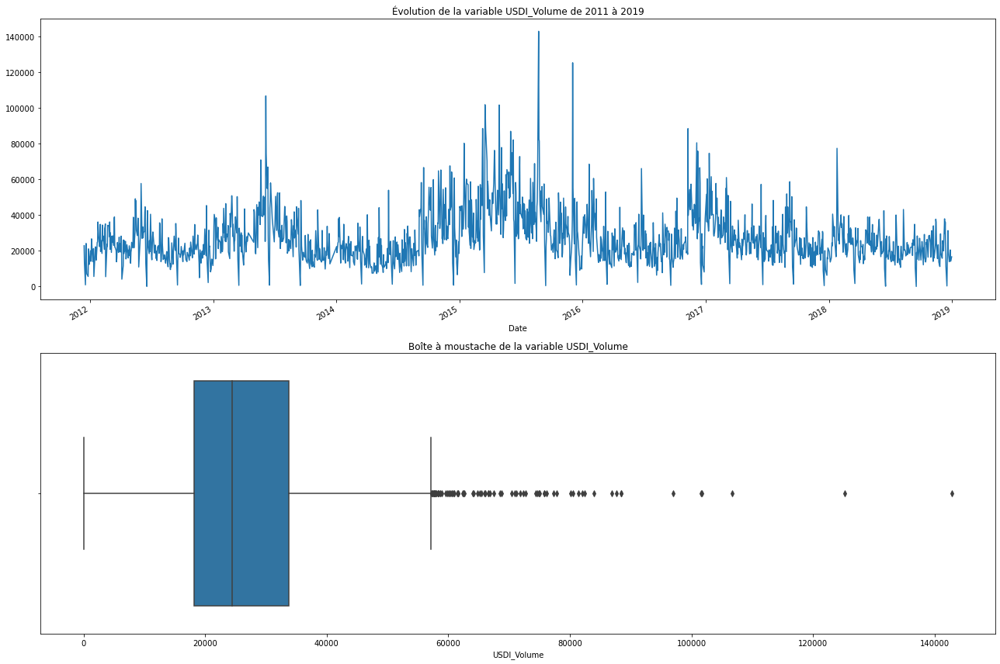

ÉTUDE DE LA VARIABLE "GDX_Open"


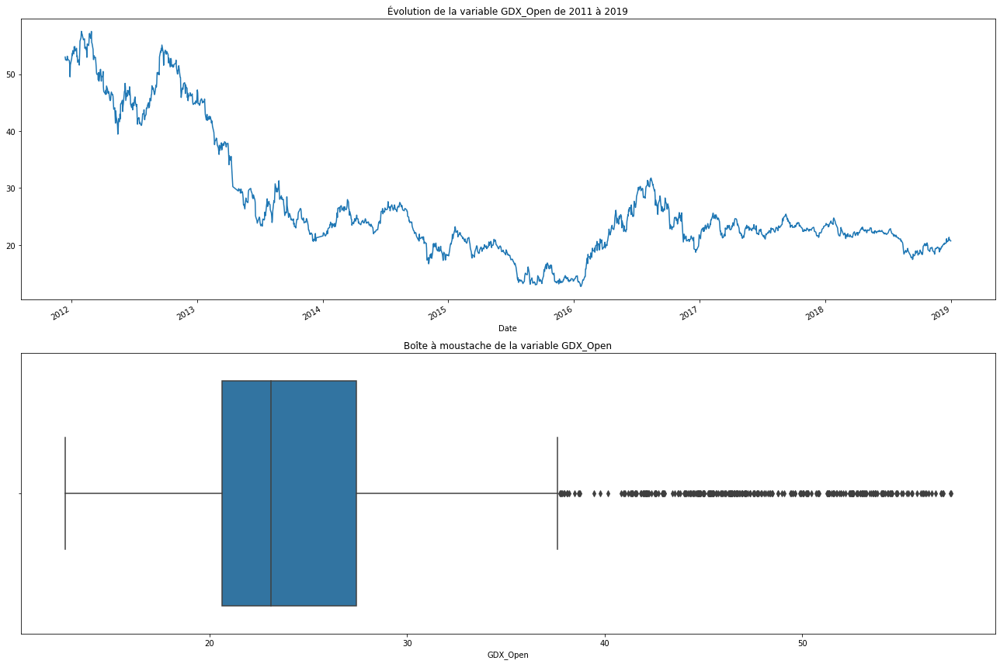

ÉTUDE DE LA VARIABLE "GDX_High"


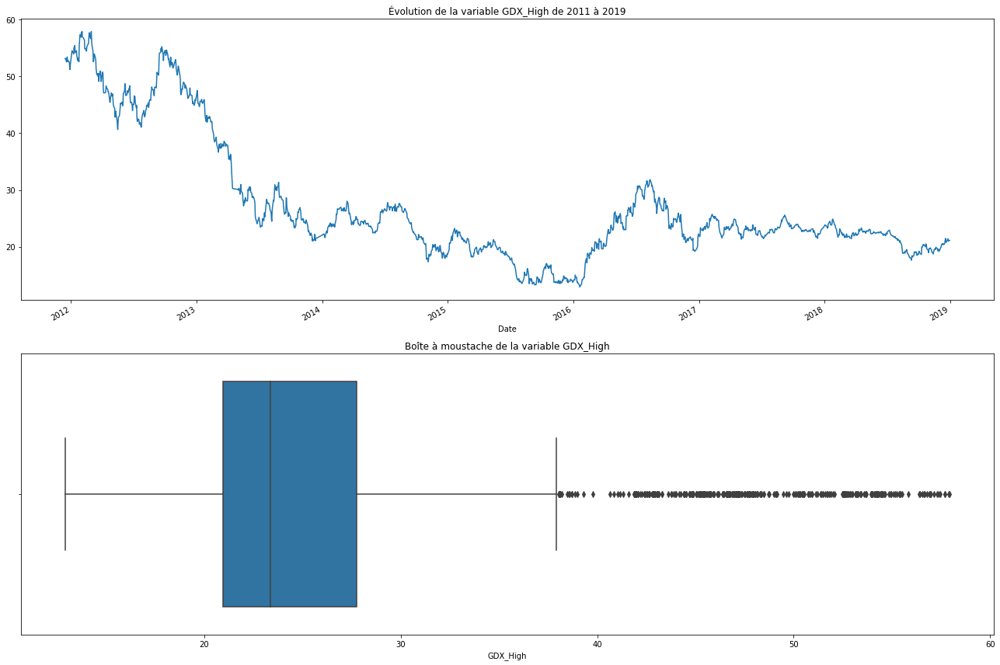

ÉTUDE DE LA VARIABLE "GDX_Low"


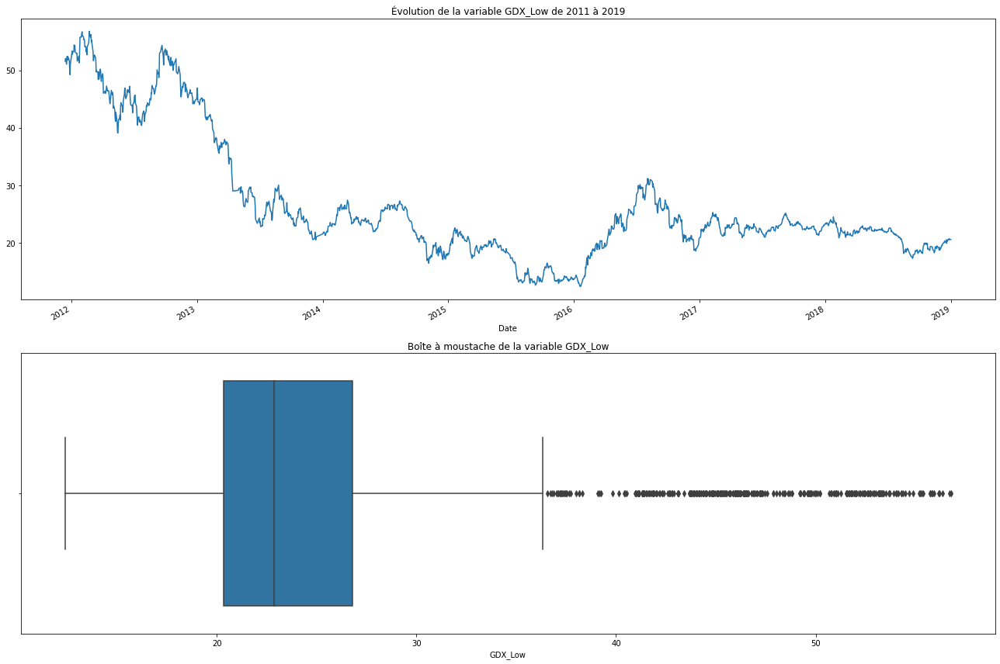

ÉTUDE DE LA VARIABLE "GDX_Close"


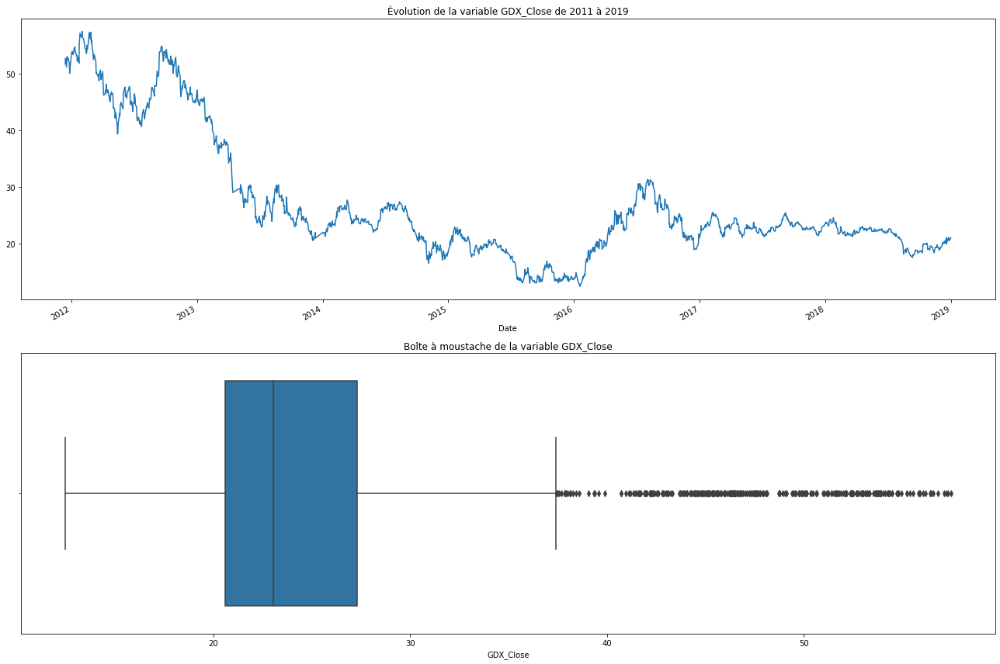

ÉTUDE DE LA VARIABLE "GDX_Adj Close"


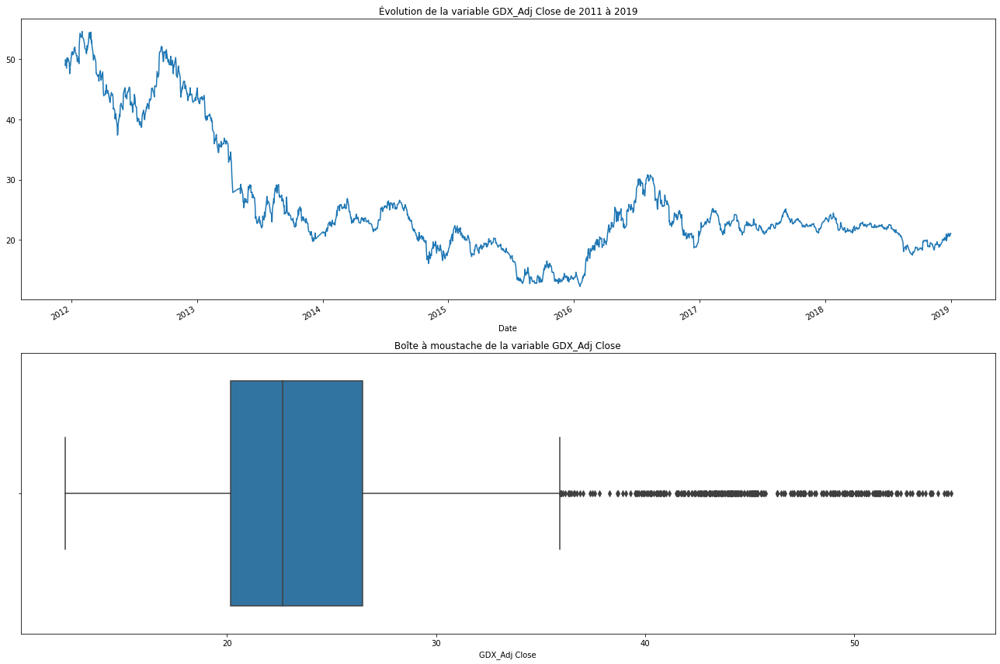

ÉTUDE DE LA VARIABLE "GDX_Volume"


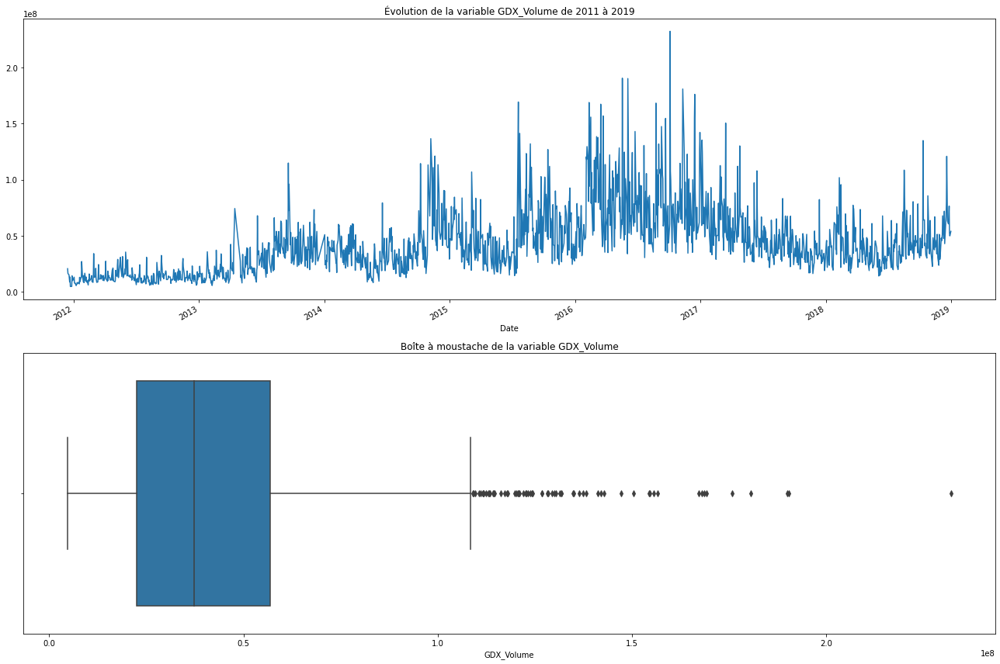

ÉTUDE DE LA VARIABLE "USO_Open"


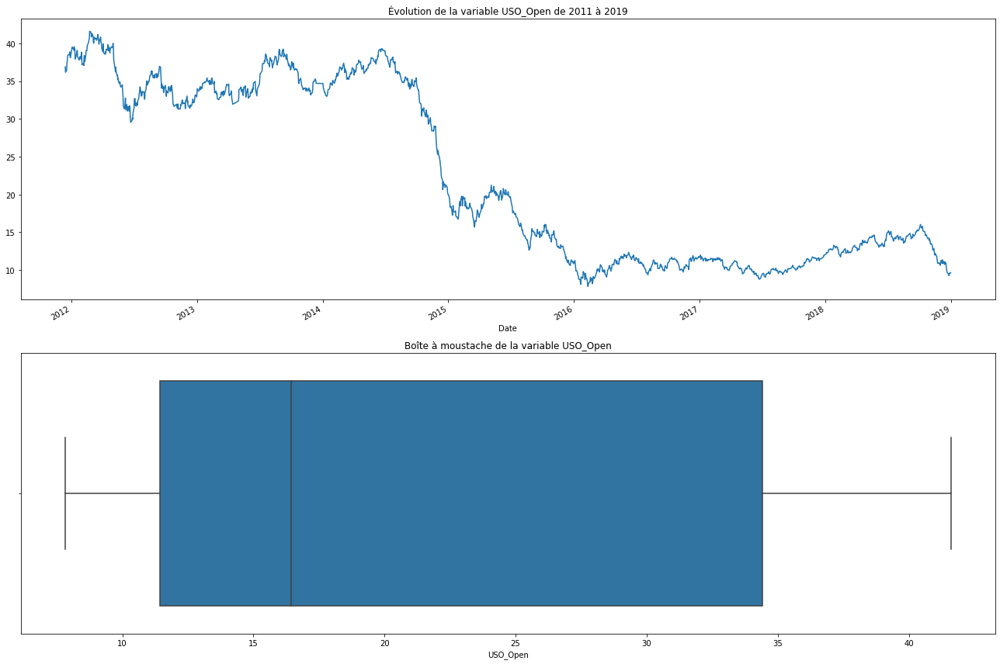

ÉTUDE DE LA VARIABLE "USO_High"


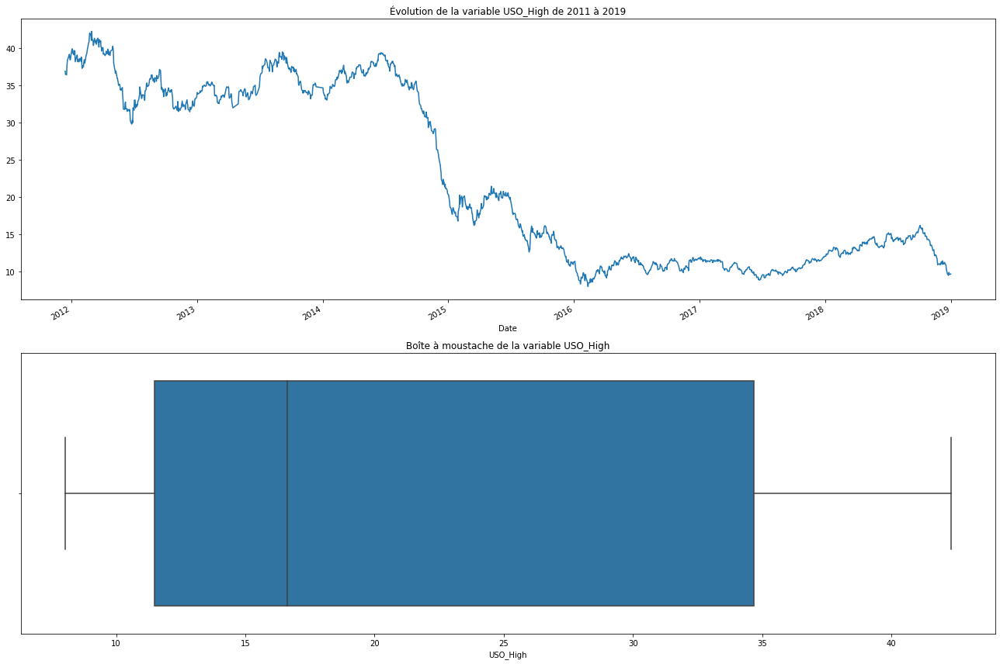

ÉTUDE DE LA VARIABLE "USO_Low"


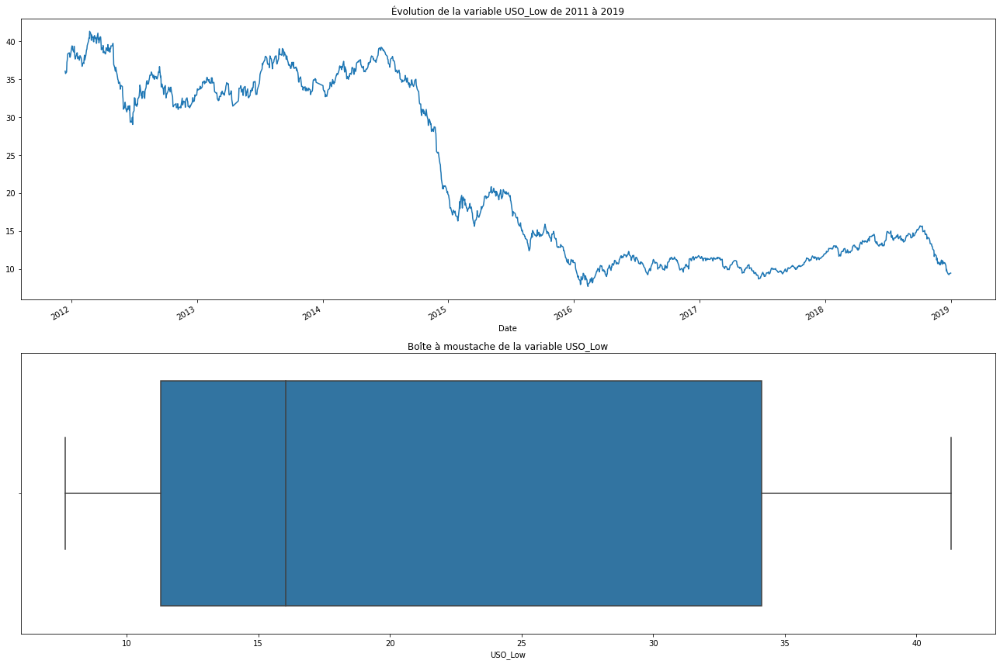

ÉTUDE DE LA VARIABLE "USO_Close"


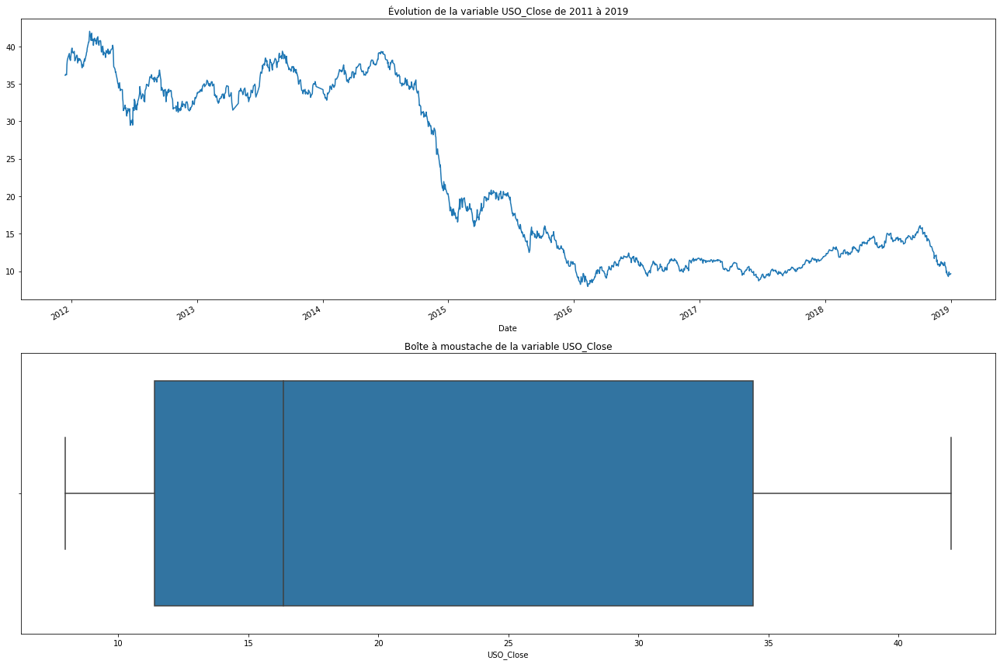

ÉTUDE DE LA VARIABLE "USO_Adj Close"


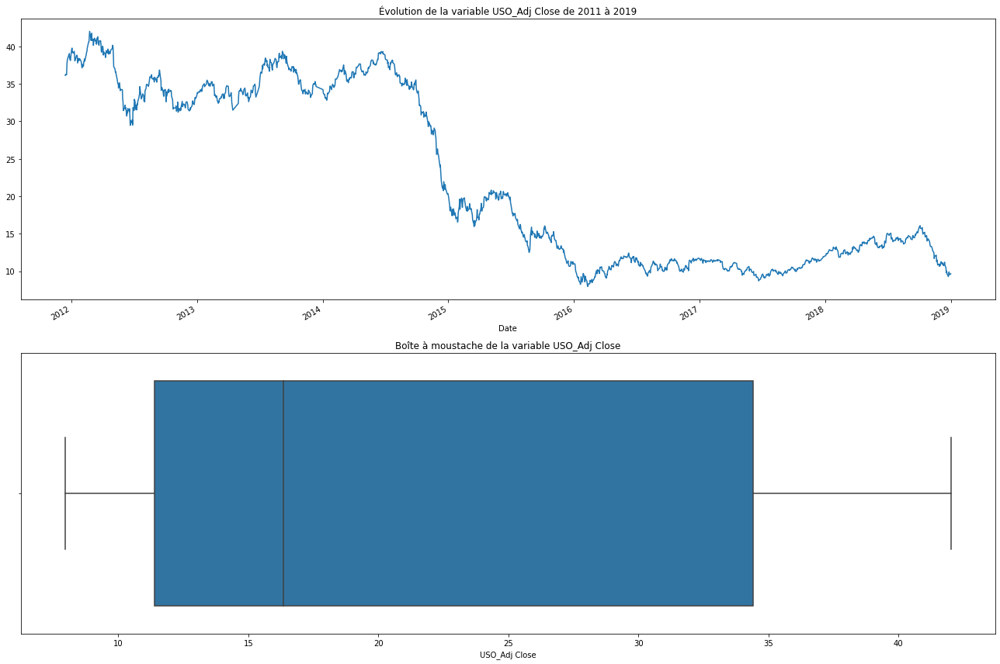

ÉTUDE DE LA VARIABLE "USO_Volume"


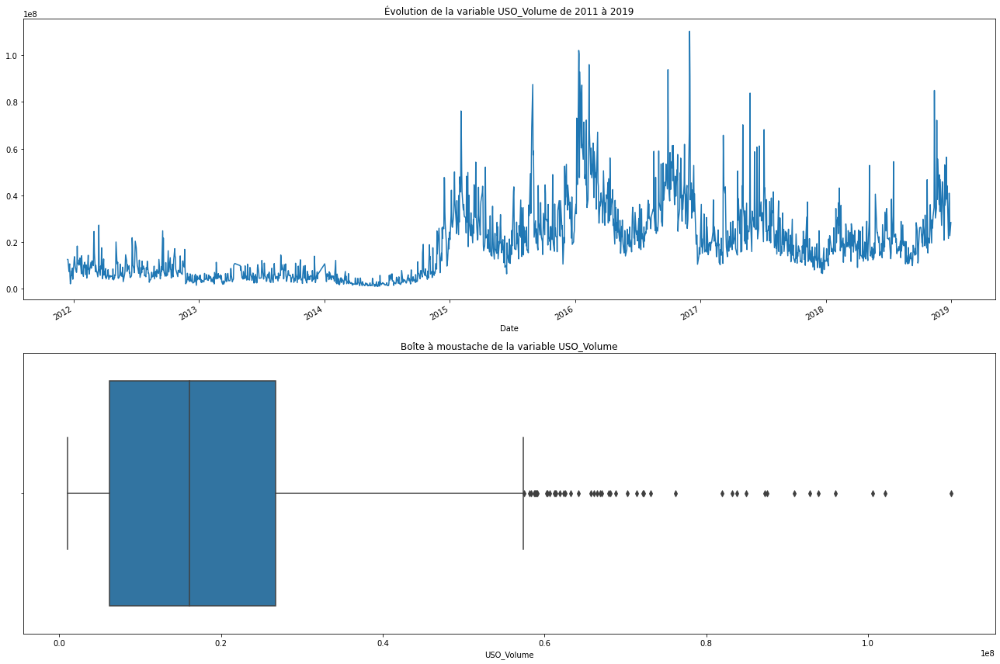

In [35]:
for i in features_list_quanti:    
    print("="*110)
    print(f'ÉTUDE DE LA VARIABLE "{i}"')

    #Représentation graphique de l'évolution d'une variable au cours du temps
    plt.subplot(211)
    df[i].plot(figsize = (18,12))
    plt.title(f'Évolution de la variable {i} de 2011 à 2019')

    #Boîte à moustache d'une variable
    plt.subplot(212)
    plt.title(f'Boîte à moustache de la variable {i}')
    sns.boxplot(data = df, x = i)

    plt.tight_layout()
    plt.show()

##### Étude de chaque variable quantitative discrète

Pour chacune de ces variables, les diagrammes circulaire et à barre nous aideront à mieux les comprendre.

In [36]:
#Liste des variables quantitatives discrètes
features_list_trend = ['EU_Trend','OF_Trend','OS_Trend','SF_Trend','USB_Trend','PLT_Trend','PLD_Trend','USDI_Trend']
len(features_list_trend)

8

ÉTUDE DE LA VARIABLE "EU_Trend"


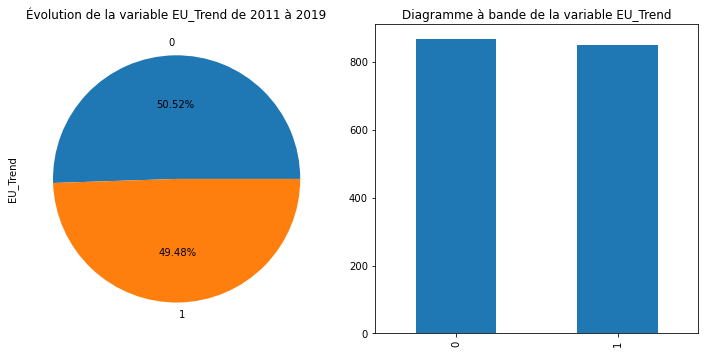

ÉTUDE DE LA VARIABLE "OF_Trend"


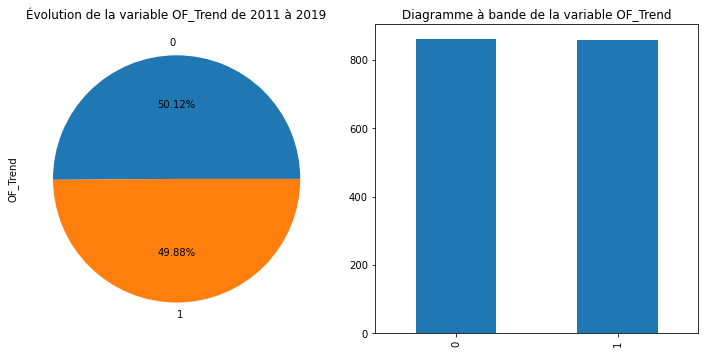

ÉTUDE DE LA VARIABLE "OS_Trend"


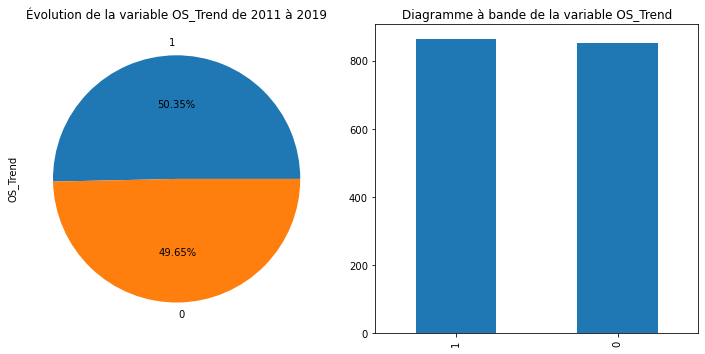

ÉTUDE DE LA VARIABLE "SF_Trend"


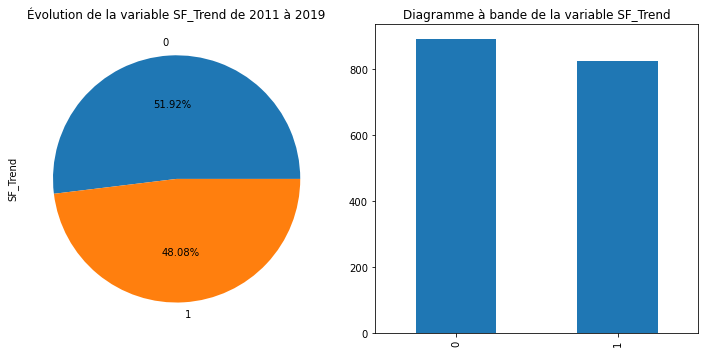

ÉTUDE DE LA VARIABLE "USB_Trend"


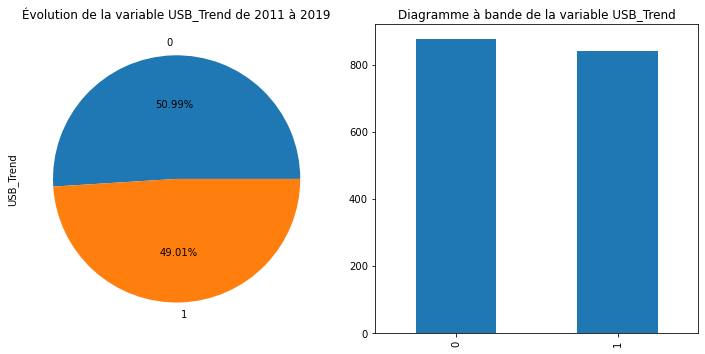

ÉTUDE DE LA VARIABLE "PLT_Trend"


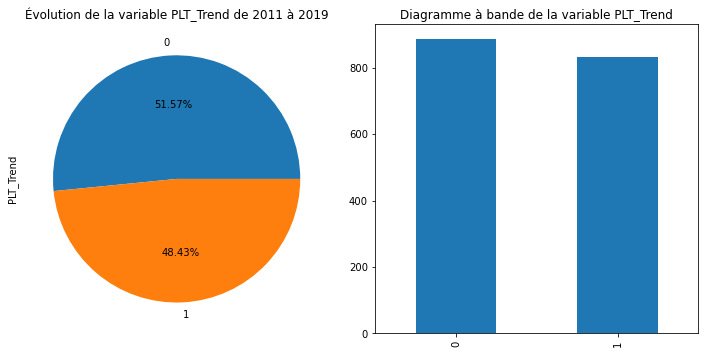

ÉTUDE DE LA VARIABLE "PLD_Trend"


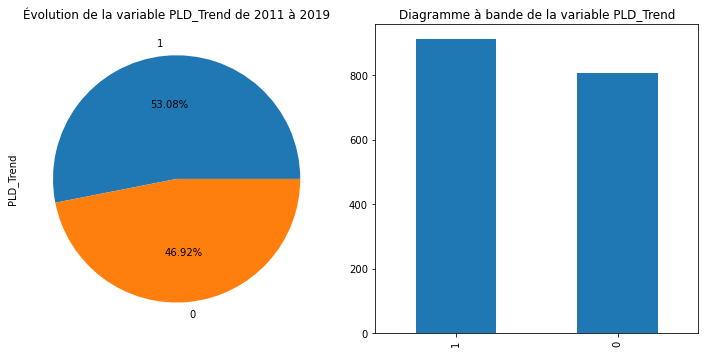

ÉTUDE DE LA VARIABLE "USDI_Trend"


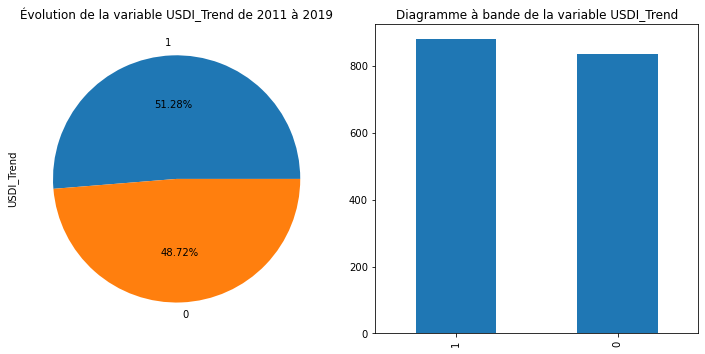

In [37]:
for i in features_list_trend:    
    print("="*110)
    print(f'ÉTUDE DE LA VARIABLE "{i}"')

    #Représentation graphique de l'évolution d'une variable au cours du temps
    plt.subplot(121)
    df[i].value_counts(normalize=True).plot(kind='pie',autopct= "%1.2f%%",figsize = (10,5))
    plt.title(f'Évolution de la variable {i} de 2011 à 2019')

    #Boîte à moustache d'une variable
    plt.subplot(122)
    plt.title(f'Diagramme à bande de la variable {i}')
    df[i].value_counts().plot.bar()
    
    plt.tight_layout()
    plt.show()

### g) Visualisation des relations : features/target

Pour visualiser et comprendre les relations feature/target il nous faudra:
<br> -tracer les graphiques de comparaison deux-à-deux (courbe comparative, nuage de points);
<br> -déterminer le coefficient de de correlation linéaire entre chaque 'feature' et la 'target'

##### Tracé des graphiques de comparaison deux-à-deux (courbe comparative, nuage de points)

##### Normalisation des variables quantitatives continues du dataframe

In [38]:
df_norm = df[features_list_quanti]

In [39]:
Normaliser = RobustScaler().fit(df_norm)
df_normaliser = pd.DataFrame(Normaliser.transform(df_norm), columns = features_list_quanti, index = df_norm.index)

##### Nuage de points de chaque feature et la variable cible "Adj Close"

VISUALISATION DE LA RELATION: Adj Close / Adj Closed


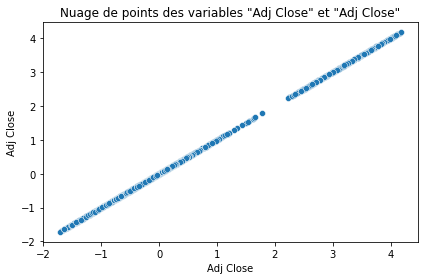

VISUALISATION DE LA RELATION: Open / Adj Closed


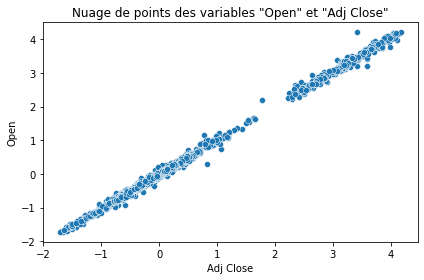

VISUALISATION DE LA RELATION: High / Adj Closed


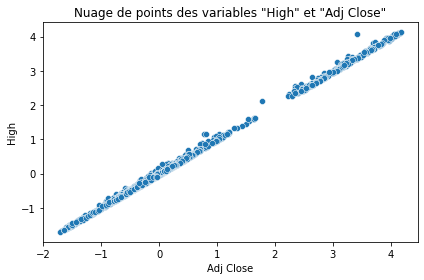

VISUALISATION DE LA RELATION: Low / Adj Closed


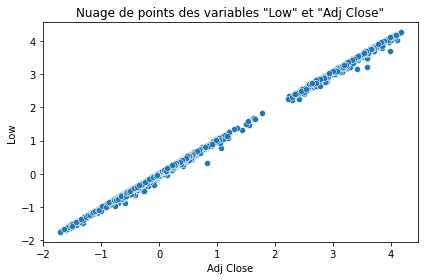

VISUALISATION DE LA RELATION: Close / Adj Closed


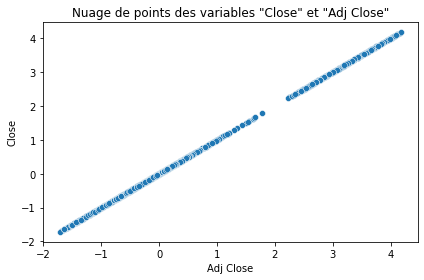

VISUALISATION DE LA RELATION: Volume / Adj Closed


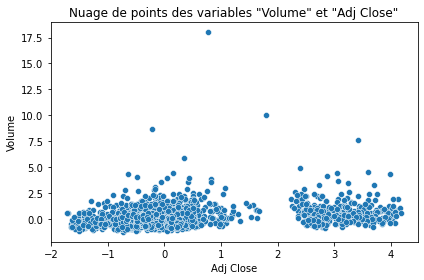

VISUALISATION DE LA RELATION: SP_open / Adj Closed


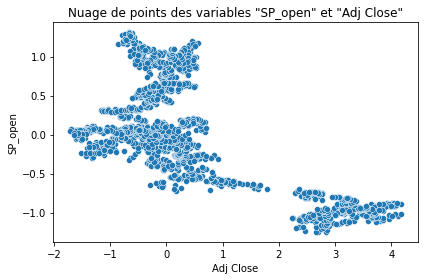

VISUALISATION DE LA RELATION: SP_high / Adj Closed


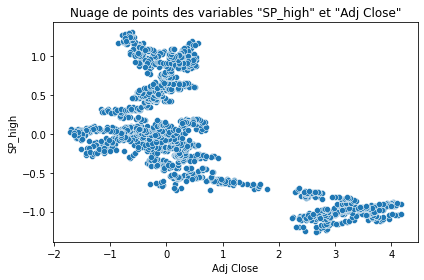

VISUALISATION DE LA RELATION: SP_low / Adj Closed


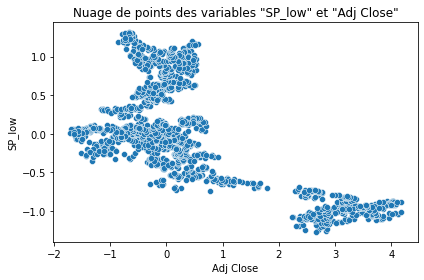

VISUALISATION DE LA RELATION: SP_close / Adj Closed


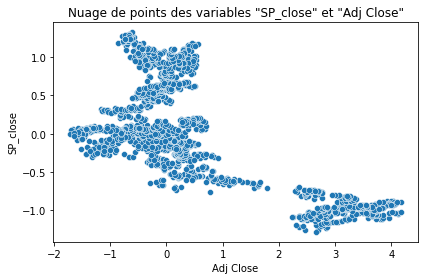

VISUALISATION DE LA RELATION: SP_Ajclose / Adj Closed


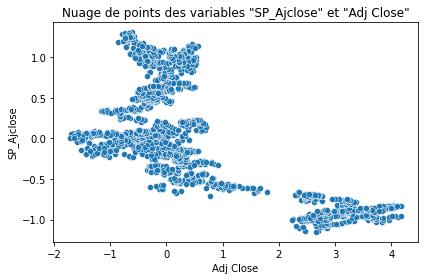

VISUALISATION DE LA RELATION: SP_volume / Adj Closed


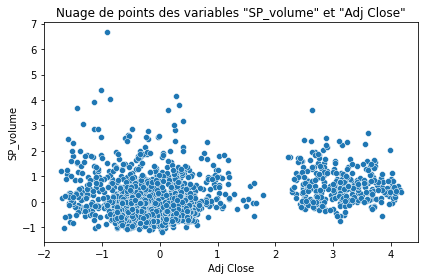

VISUALISATION DE LA RELATION: DJ_open / Adj Closed


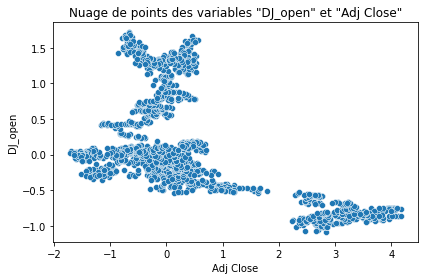

VISUALISATION DE LA RELATION: DJ_high / Adj Closed


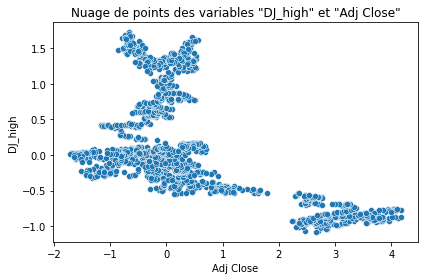

VISUALISATION DE LA RELATION: DJ_low / Adj Closed


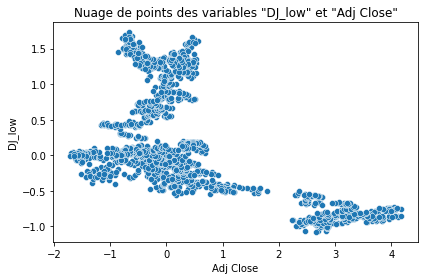

VISUALISATION DE LA RELATION: DJ_close / Adj Closed


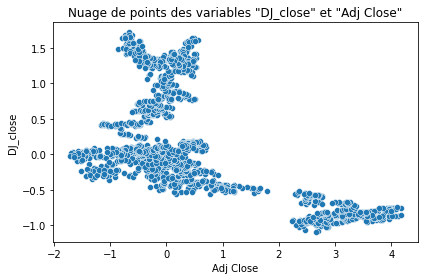

VISUALISATION DE LA RELATION: DJ_Ajclose / Adj Closed


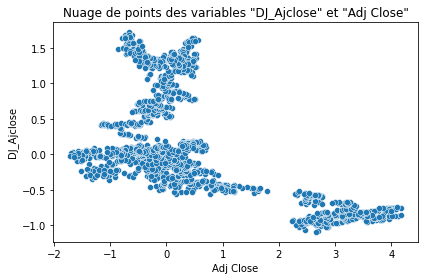

VISUALISATION DE LA RELATION: DJ_volume / Adj Closed


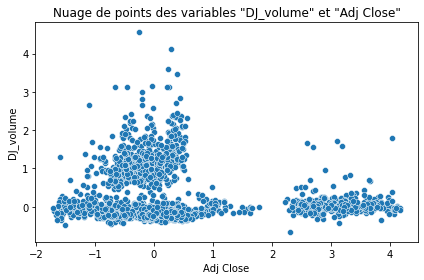

VISUALISATION DE LA RELATION: EG_open / Adj Closed


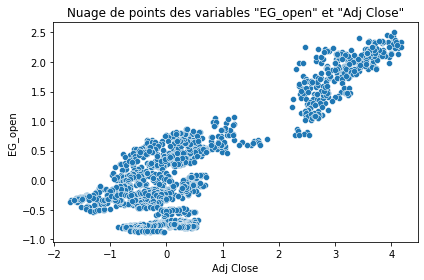

VISUALISATION DE LA RELATION: EG_high / Adj Closed


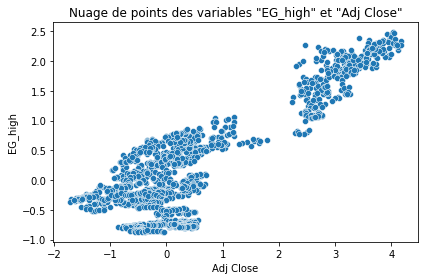

VISUALISATION DE LA RELATION: EG_low / Adj Closed


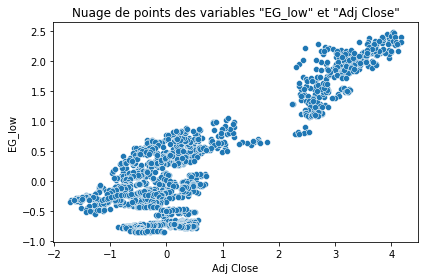

VISUALISATION DE LA RELATION: EG_close / Adj Closed


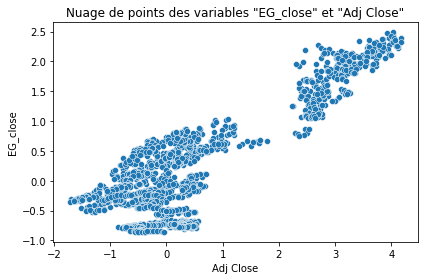

VISUALISATION DE LA RELATION: EG_Ajclose / Adj Closed


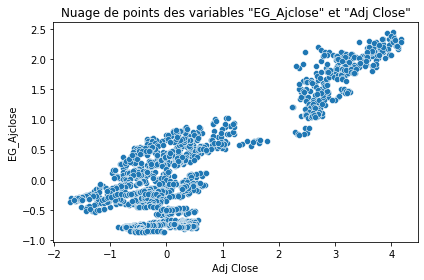

VISUALISATION DE LA RELATION: EG_volume / Adj Closed


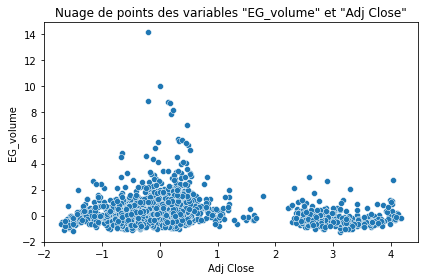

VISUALISATION DE LA RELATION: EU_Price / Adj Closed


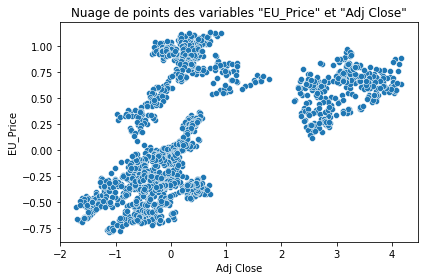

VISUALISATION DE LA RELATION: EU_open / Adj Closed


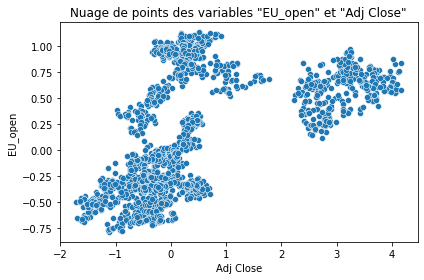

VISUALISATION DE LA RELATION: EU_high / Adj Closed


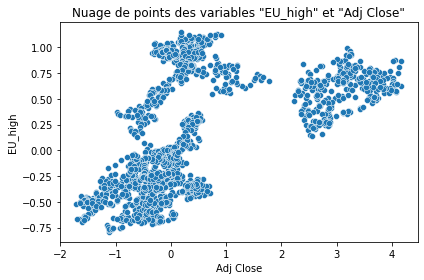

VISUALISATION DE LA RELATION: EU_low / Adj Closed


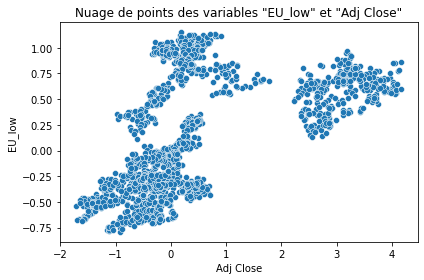

VISUALISATION DE LA RELATION: OF_Price / Adj Closed


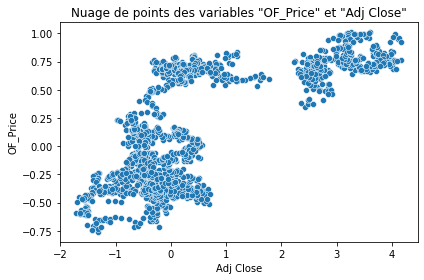

VISUALISATION DE LA RELATION: OF_Open / Adj Closed


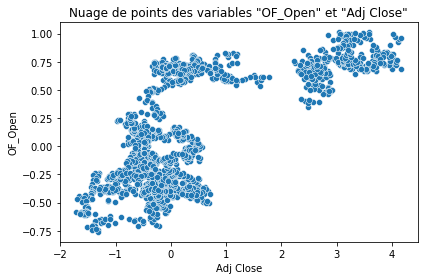

VISUALISATION DE LA RELATION: OF_High / Adj Closed


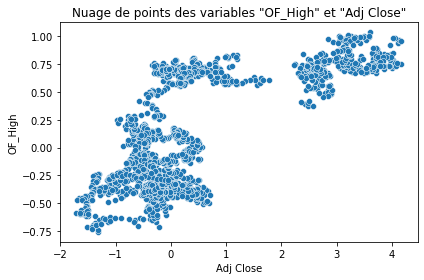

VISUALISATION DE LA RELATION: OF_Low / Adj Closed


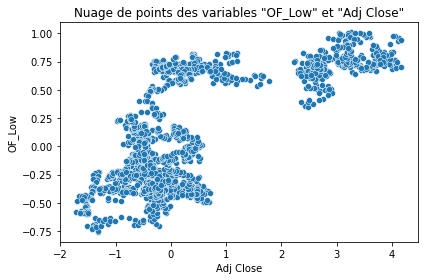

VISUALISATION DE LA RELATION: OF_Volume / Adj Closed


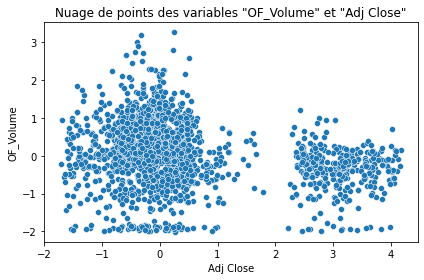

VISUALISATION DE LA RELATION: OS_Price / Adj Closed


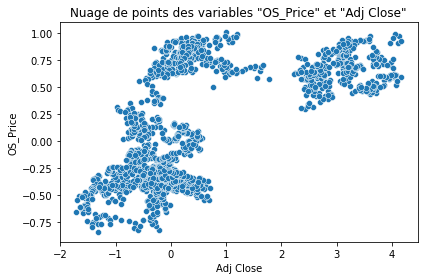

VISUALISATION DE LA RELATION: OS_Open / Adj Closed


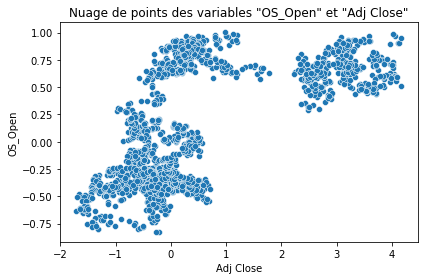

VISUALISATION DE LA RELATION: OS_High / Adj Closed


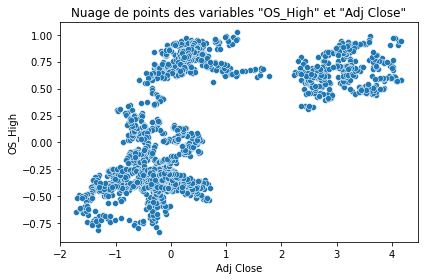

VISUALISATION DE LA RELATION: OS_Low / Adj Closed


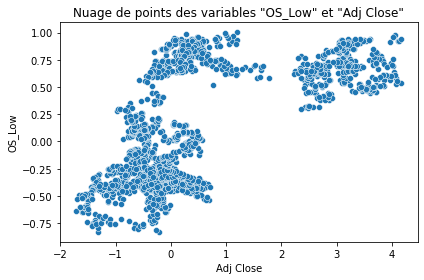

VISUALISATION DE LA RELATION: SF_Price / Adj Closed


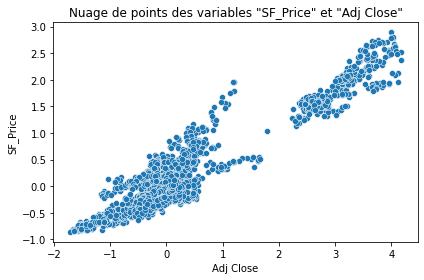

VISUALISATION DE LA RELATION: SF_Open / Adj Closed


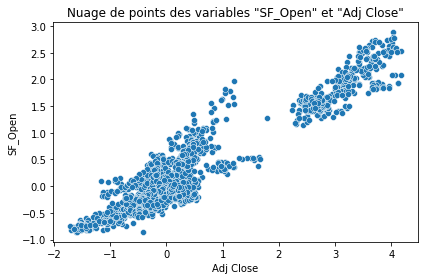

VISUALISATION DE LA RELATION: SF_High / Adj Closed


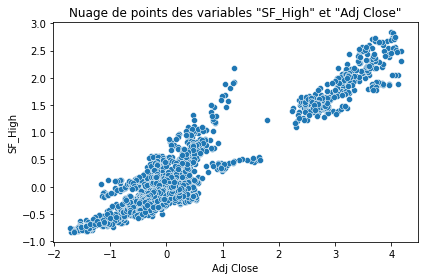

VISUALISATION DE LA RELATION: SF_Low / Adj Closed


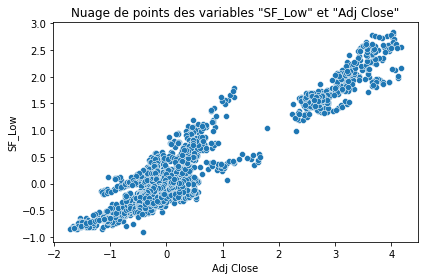

VISUALISATION DE LA RELATION: SF_Volume / Adj Closed


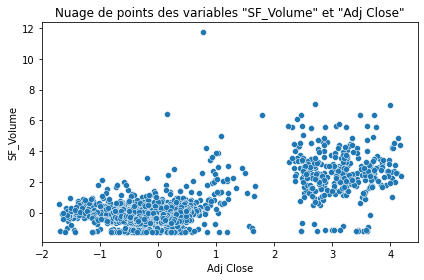

VISUALISATION DE LA RELATION: USB_Price / Adj Closed


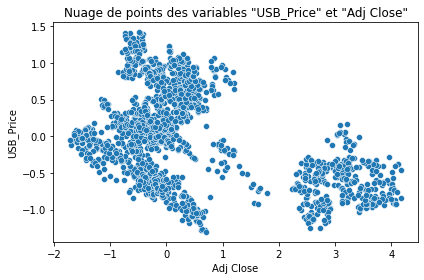

VISUALISATION DE LA RELATION: USB_Open / Adj Closed


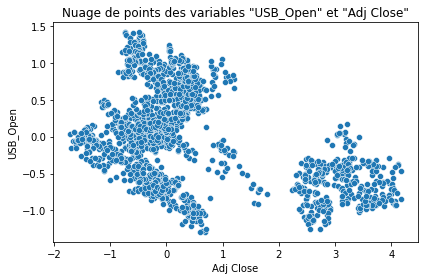

VISUALISATION DE LA RELATION: USB_High / Adj Closed


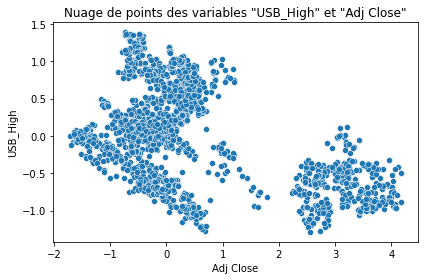

VISUALISATION DE LA RELATION: USB_Low / Adj Closed


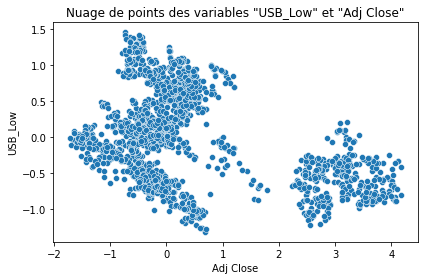

VISUALISATION DE LA RELATION: PLT_Price / Adj Closed


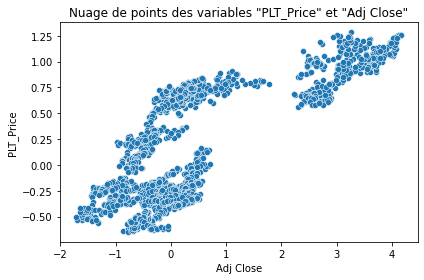

VISUALISATION DE LA RELATION: PLT_Open / Adj Closed


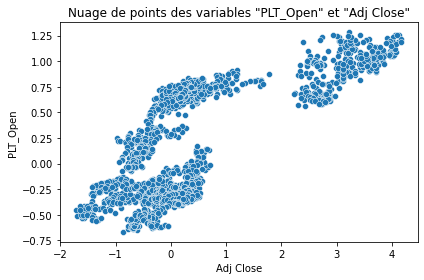

VISUALISATION DE LA RELATION: PLT_High / Adj Closed


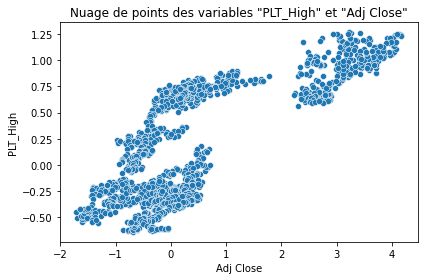

VISUALISATION DE LA RELATION: PLT_Low / Adj Closed


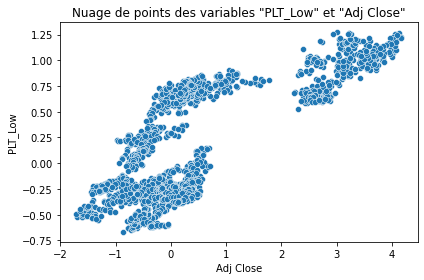

VISUALISATION DE LA RELATION: PLD_Price / Adj Closed


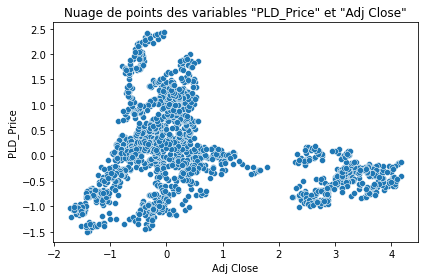

VISUALISATION DE LA RELATION: PLD_Open / Adj Closed


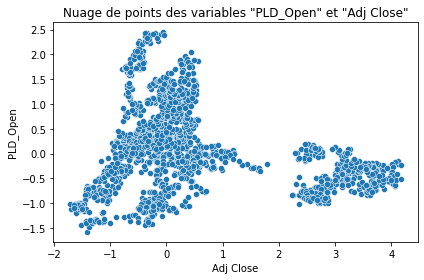

VISUALISATION DE LA RELATION: PLD_High / Adj Closed


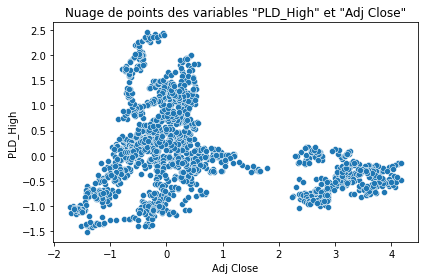

VISUALISATION DE LA RELATION: PLD_Low / Adj Closed


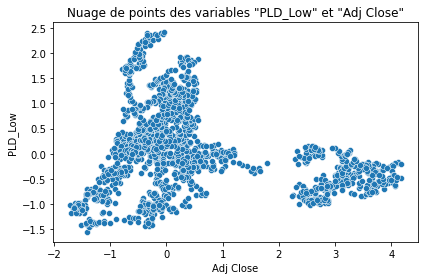

VISUALISATION DE LA RELATION: RHO_PRICE / Adj Closed


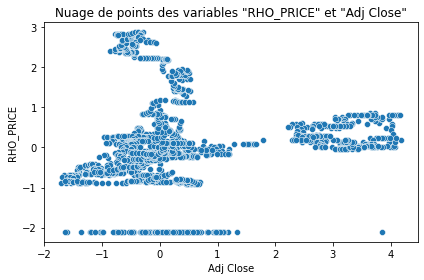

VISUALISATION DE LA RELATION: USDI_Price / Adj Closed


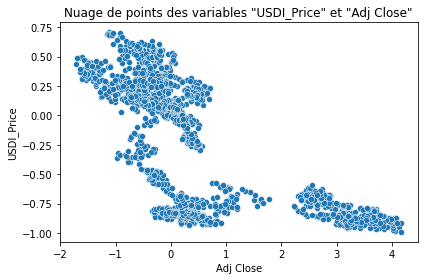

VISUALISATION DE LA RELATION: USDI_Open / Adj Closed


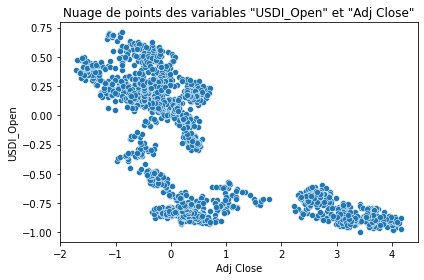

VISUALISATION DE LA RELATION: USDI_High / Adj Closed


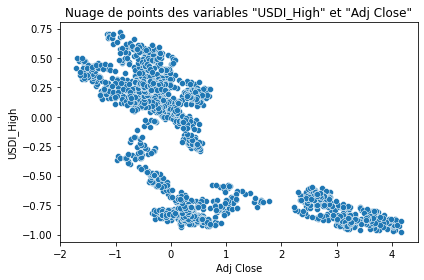

VISUALISATION DE LA RELATION: USDI_Low / Adj Closed


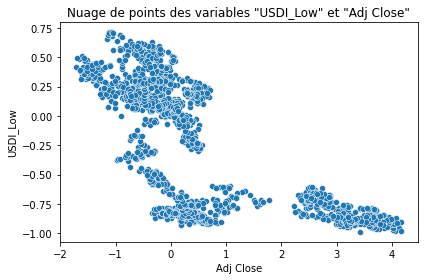

VISUALISATION DE LA RELATION: USDI_Volume / Adj Closed


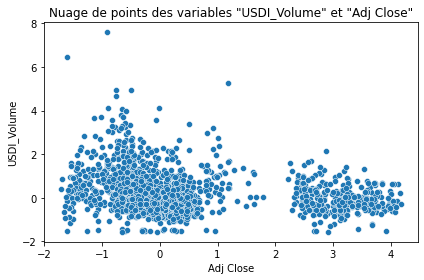

VISUALISATION DE LA RELATION: GDX_Open / Adj Closed


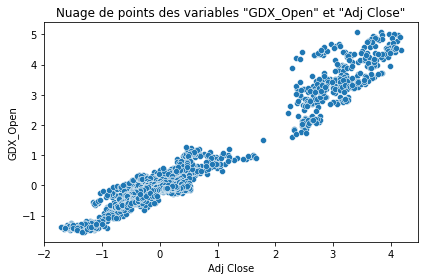

VISUALISATION DE LA RELATION: GDX_High / Adj Closed


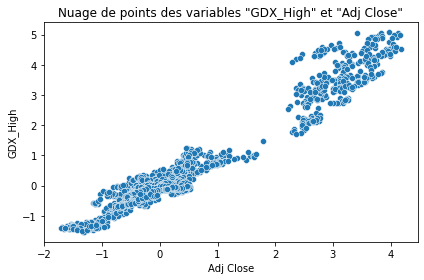

VISUALISATION DE LA RELATION: GDX_Low / Adj Closed


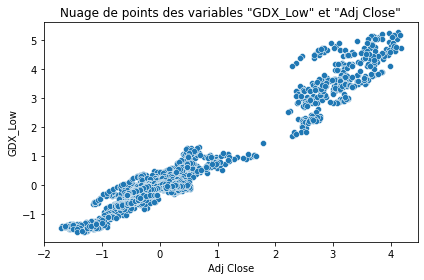

VISUALISATION DE LA RELATION: GDX_Close / Adj Closed


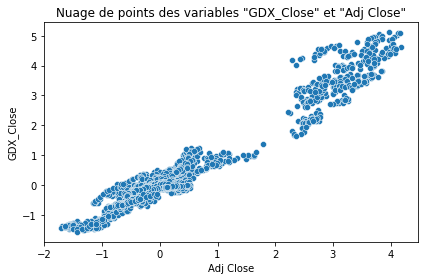

VISUALISATION DE LA RELATION: GDX_Adj Close / Adj Closed


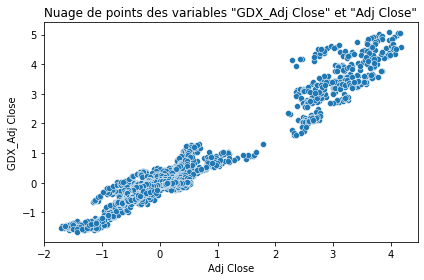

VISUALISATION DE LA RELATION: GDX_Volume / Adj Closed


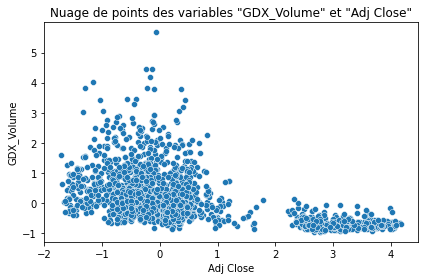

VISUALISATION DE LA RELATION: USO_Open / Adj Closed


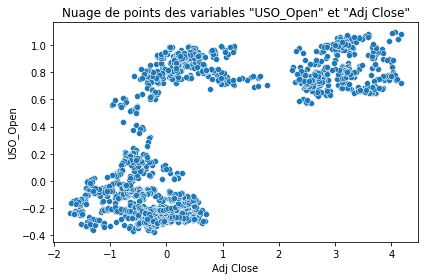

VISUALISATION DE LA RELATION: USO_High / Adj Closed


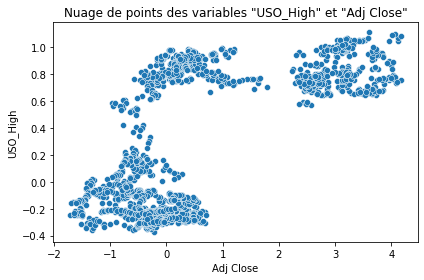

VISUALISATION DE LA RELATION: USO_Low / Adj Closed


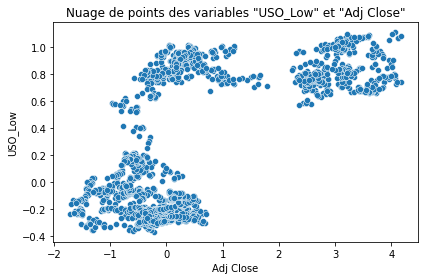

VISUALISATION DE LA RELATION: USO_Close / Adj Closed


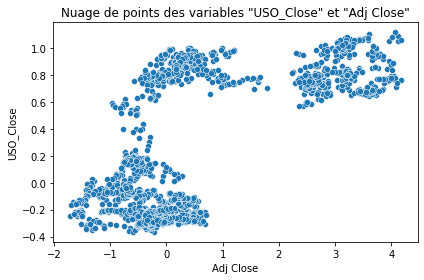

VISUALISATION DE LA RELATION: USO_Adj Close / Adj Closed


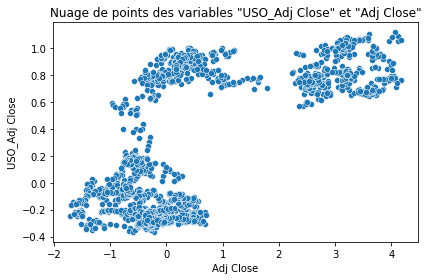

VISUALISATION DE LA RELATION: USO_Volume / Adj Closed


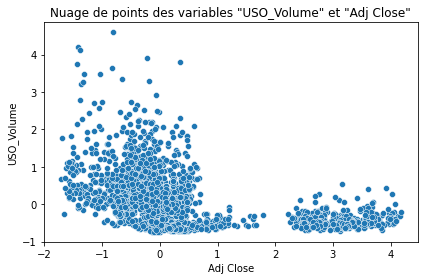

In [40]:
for i in features_list_quanti: 
    print("="*120)
    print(f'VISUALISATION DE LA RELATION: {i} / Adj Closed')

    #Nuage de points d'une feature et de la target
    plt.title(f'Nuage de points des variables "{i}" et "Adj Close"')
    sns.scatterplot(data = df_normaliser, x = 'Adj Close', y = i)
    
    plt.tight_layout()
    
    #plt.savefig(f'{i}_Adj Close.png', dpi=200)
    plt.show()

##### Courbes comparatives

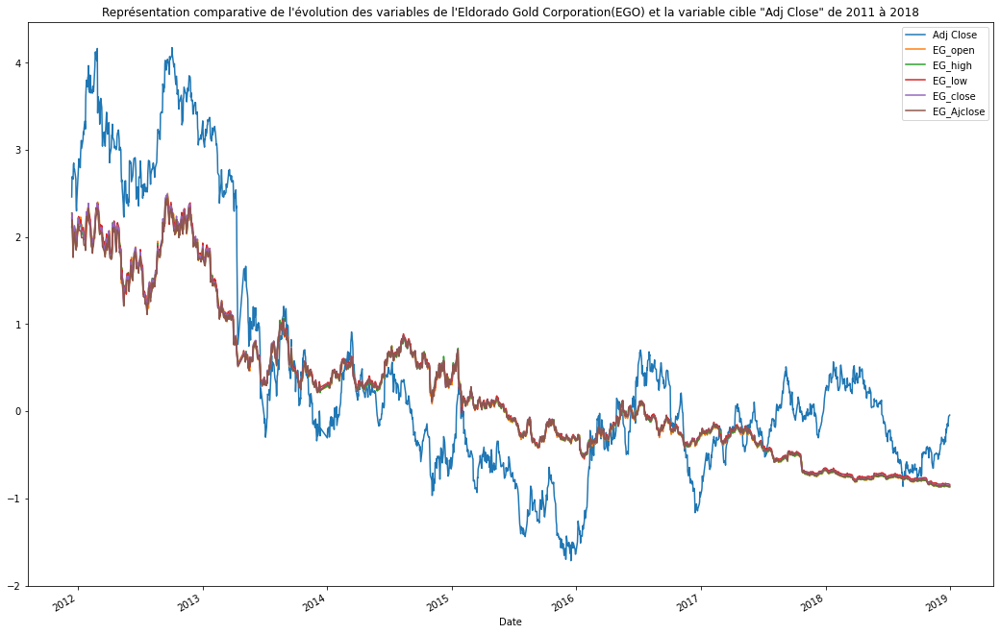

In [41]:
EGO = ['Adj Close','EG_open', 'EG_high', 'EG_low', 'EG_close', 'EG_Ajclose']
df_normaliser[EGO].plot(figsize = (18,12))
plt.title(f'Représentation comparative de l\'évolution des variables de l\'Eldorado Gold Corporation(EGO) et la variable cible "Adj Close" de 2011 à 2018')
plt.legend()
#plt.savefig(f'EGO_Adj Close.png', dpi=200)
plt.show()

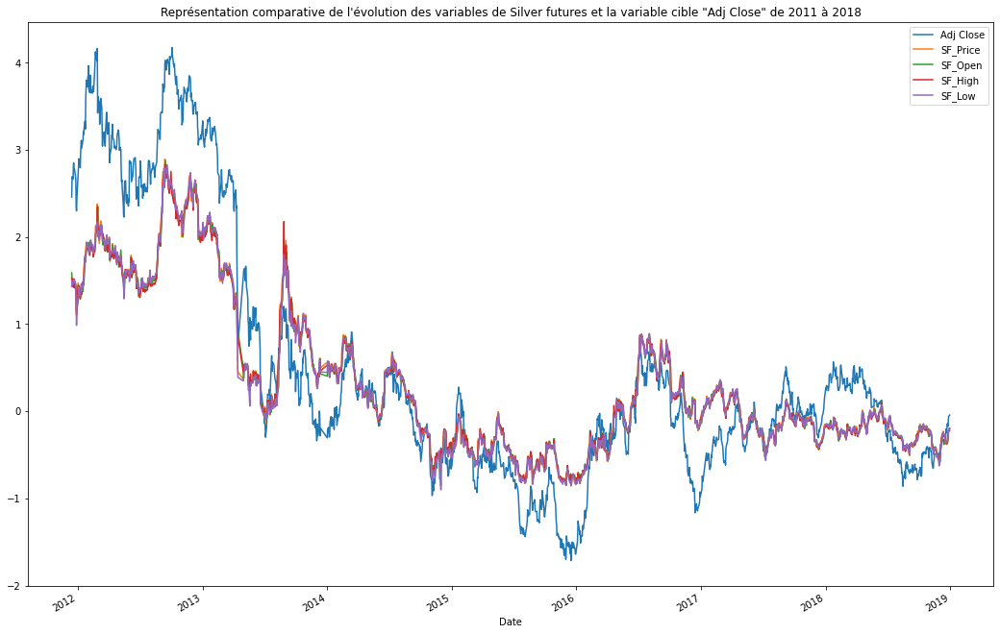

In [42]:
silver_futures = ['Adj Close','SF_Price','SF_Open','SF_High','SF_Low']
df_normaliser[silver_futures].plot(figsize = (18,12))
plt.title(f'Représentation comparative de l\'évolution des variables de Silver futures et la variable cible "Adj Close" de 2011 à 2018')
plt.legend()
#plt.savefig(f'SF_Adj Close.png', dpi=200)
plt.show()

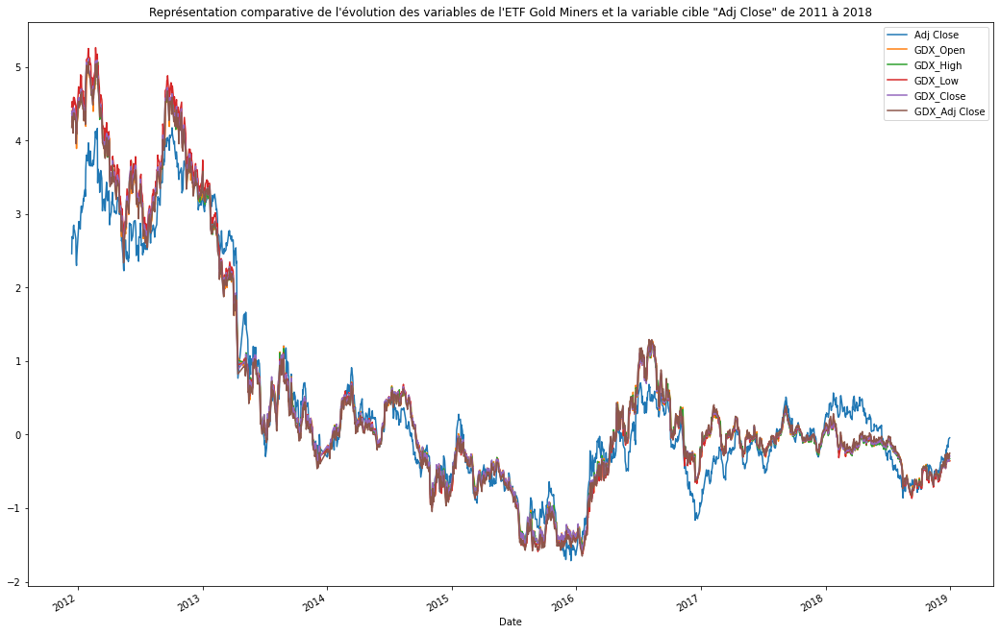

In [43]:
ETF_gold = ['Adj Close','GDX_Open','GDX_High','GDX_Low','GDX_Close','GDX_Adj Close']
df_normaliser[ETF_gold].plot(figsize = (18,12))
plt.title(f'Représentation comparative de l\'évolution des variables de l\'ETF Gold Miners et la variable cible "Adj Close" de 2011 à 2018')
plt.legend()
#plt.savefig(f'ETFGoldMiners_Adj Close.png', dpi=200)
plt.show()

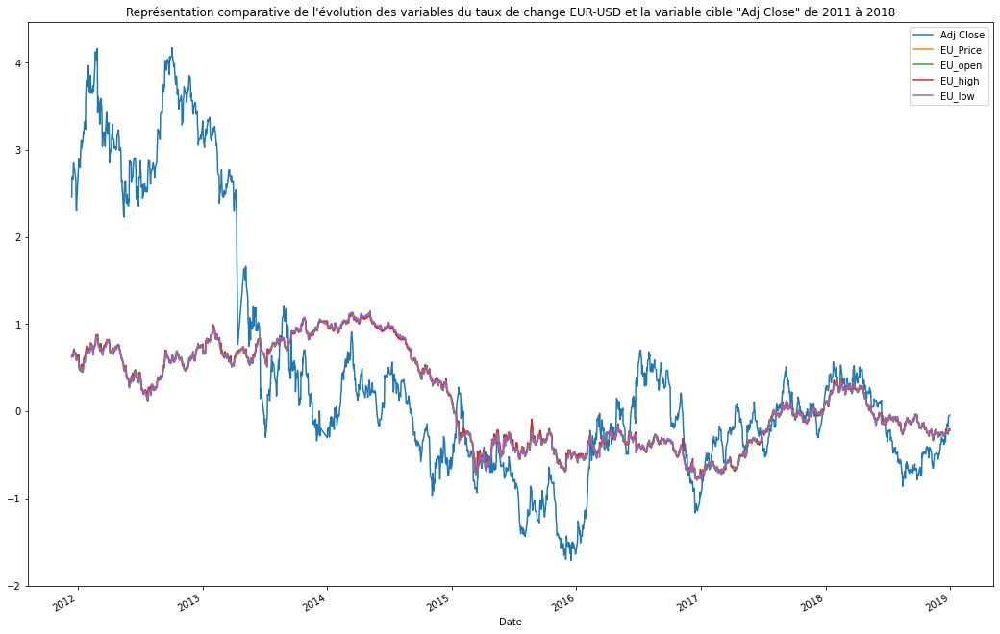

In [44]:
eur_usd = ['Adj Close','EU_Price', 'EU_open', 'EU_high', 'EU_low']
df_normaliser[eur_usd].plot(figsize = (18,12))
plt.title(f'Représentation comparative de l\'évolution des variables du taux de change EUR-USD et la variable cible "Adj Close" de 2011 à 2018')
plt.legend()
#plt.savefig(f'EUR-USD_Adj Close.png', dpi=200)
plt.show()

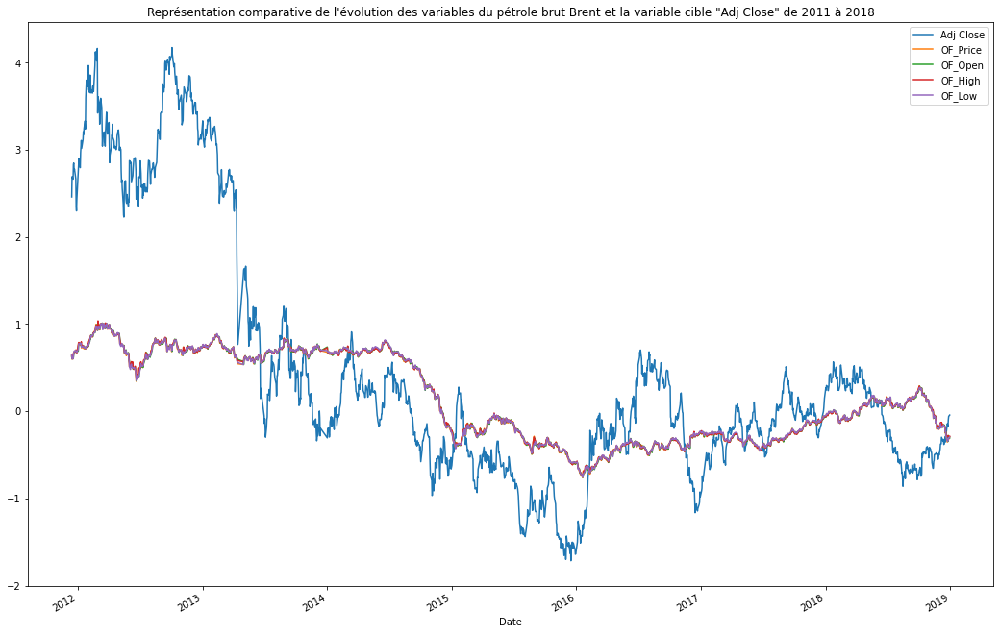

In [45]:
petrol_brend = ['Adj Close','OF_Price','OF_Open', 'OF_High', 'OF_Low']
df_normaliser[petrol_brend].plot(figsize = (18,12))
plt.title(f'Représentation comparative de l\'évolution des variables du pétrole brut Brent et la variable cible "Adj Close" de 2011 à 2018')
plt.legend()
#plt.savefig(f'OFpetrol_Adj Close.png', dpi=200)
plt.show()

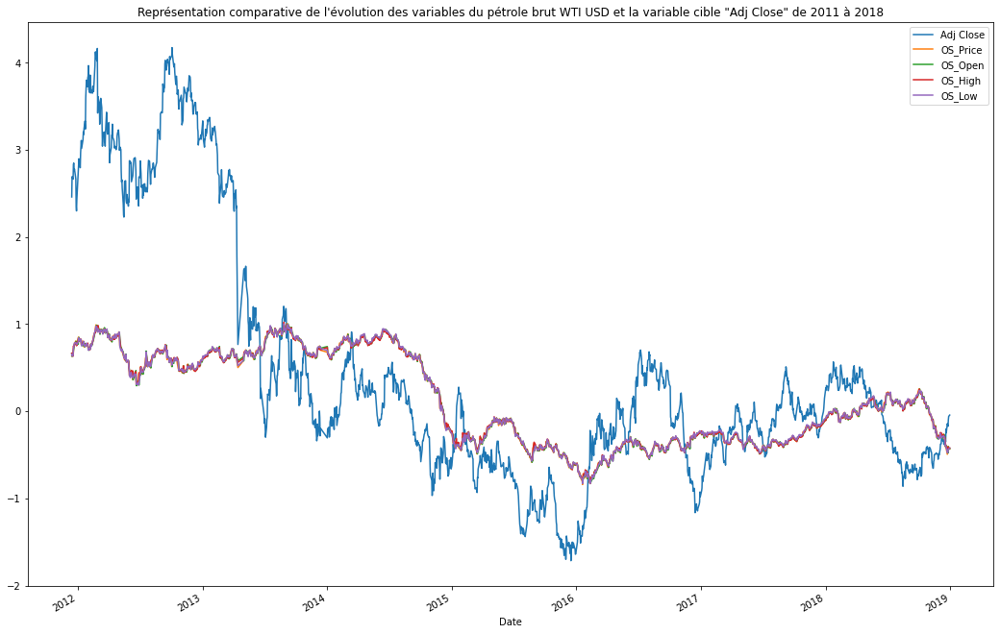

In [46]:
petrol_WTI_USD = ['Adj Close','OS_Price','OS_Open', 'OS_High', 'OS_Low']
df_normaliser[petrol_WTI_USD].plot(figsize = (18,12))
plt.title(f'Représentation comparative de l\'évolution des variables du pétrole brut WTI USD et la variable cible "Adj Close" de 2011 à 2018')
plt.legend()
#plt.savefig(f'OSpetrolbrut_Adj Close.png', dpi=200)
plt.show()

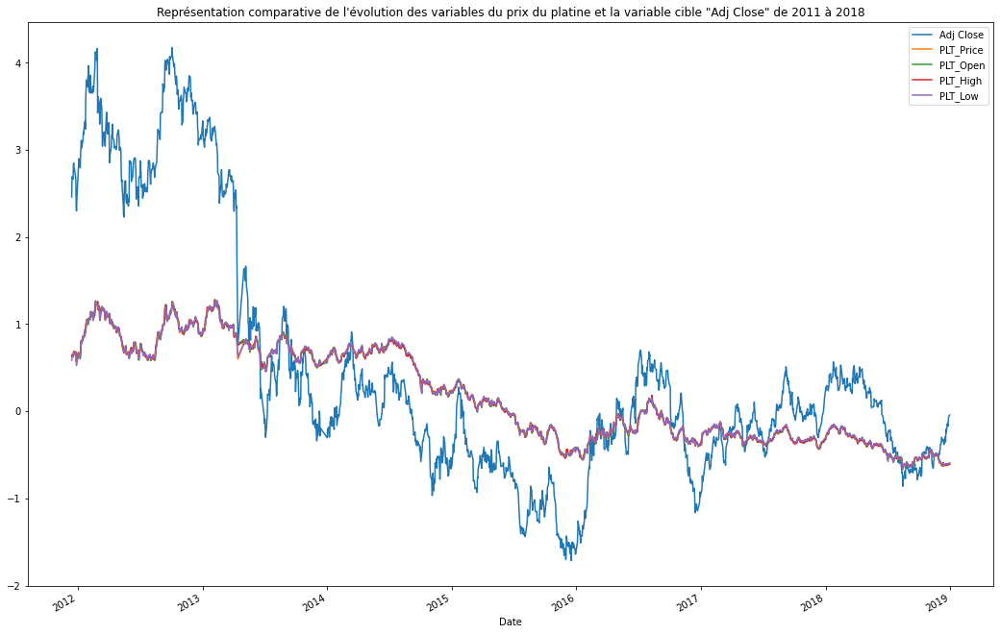

In [47]:
platine = ['Adj Close','PLT_Price','PLT_Open','PLT_High','PLT_Low']
df_normaliser[platine].plot(figsize = (18,12))
plt.title(f'Représentation comparative de l\'évolution des variables du prix du platine et la variable cible "Adj Close" de 2011 à 2018')
plt.legend()
#plt.savefig(f'PLT_Adj Close.png', dpi=200)
plt.show()

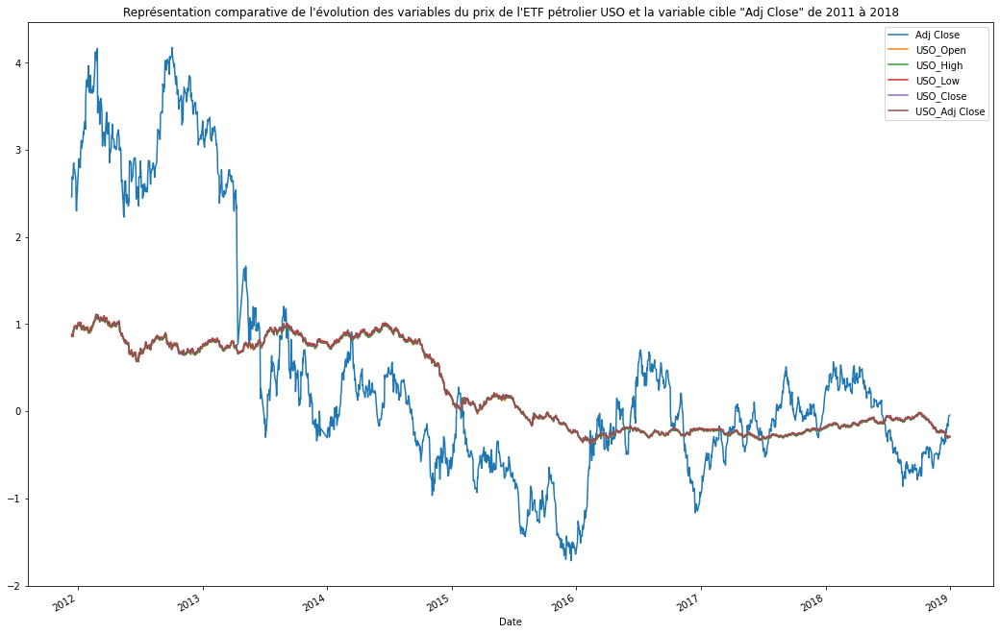

In [48]:
ETF_petrolier = ['Adj Close','USO_Open','USO_High','USO_Low','USO_Close','USO_Adj Close']
df_normaliser[ETF_petrolier].plot(figsize = (18,12))
plt.title(f'Représentation comparative de l\'évolution des variables du prix de l\'ETF pétrolier USO et la variable cible "Adj Close" de 2011 à 2018')
plt.legend()
#plt.savefig(f'ETFperolierUSO_Adj Close.png', dpi=200)
plt.show()

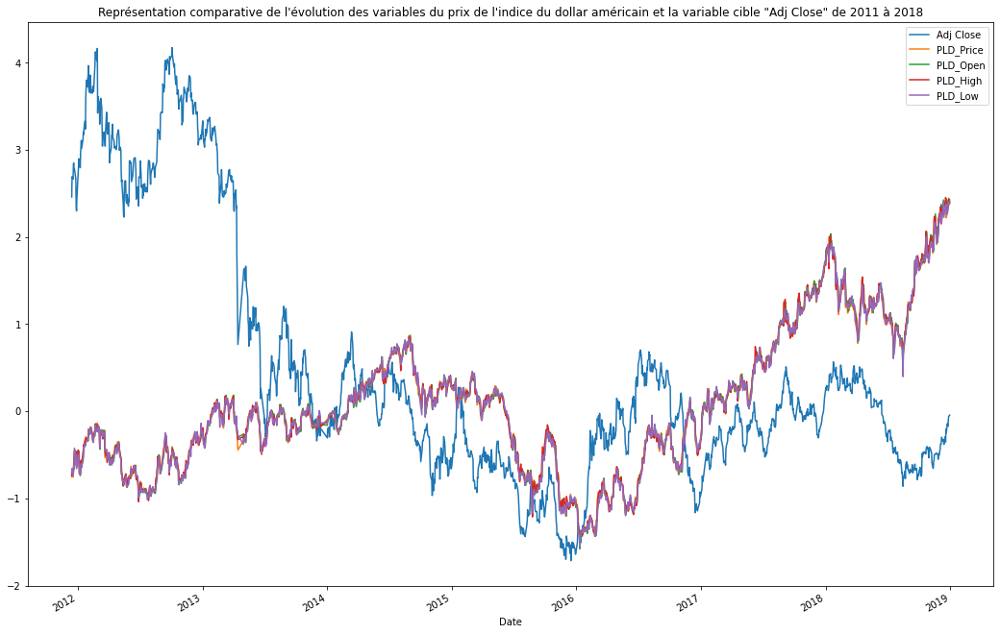

In [49]:
palladium = ['Adj Close','PLD_Price','PLD_Open','PLD_High','PLD_Low']
df_normaliser[palladium].plot(figsize = (18,12))
plt.title(f'Représentation comparative de l\'évolution des variables du prix de l\'indice du dollar américain et la variable cible "Adj Close" de 2011 à 2018')
plt.legend()
#plt.savefig(f'UDSInd_Adj Close.png', dpi=200)
plt.show()

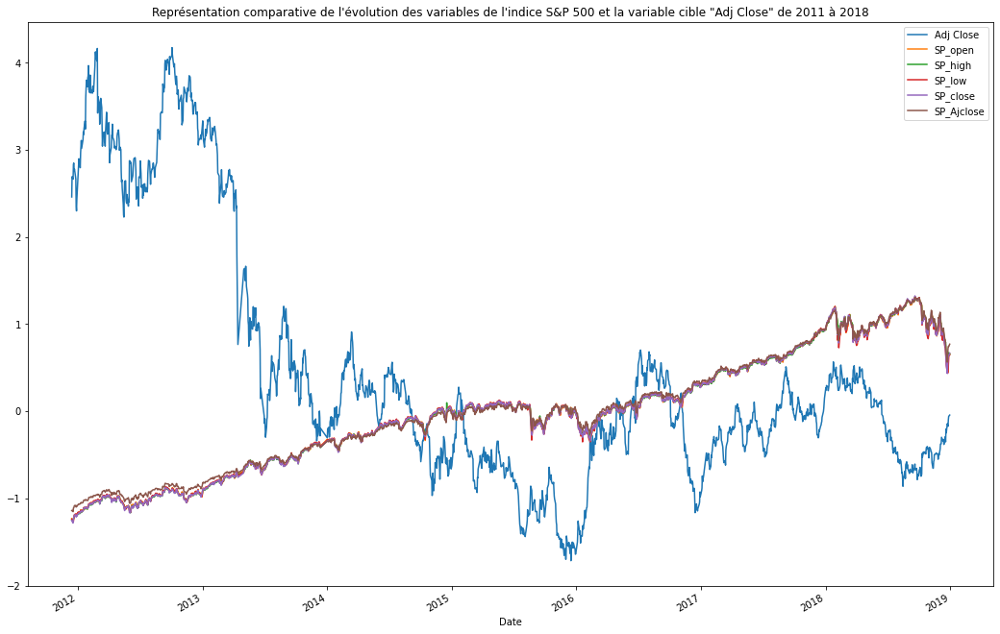

In [50]:
ind_SP_500 = ['Adj Close','SP_open','SP_high','SP_low','SP_close','SP_Ajclose']
df_normaliser[ind_SP_500].plot(figsize = (18,12))
plt.title(f'Représentation comparative de l\'évolution des variables de l\'indice S&P 500 et la variable cible "Adj Close" de 2011 à 2018')
plt.legend()
#plt.savefig(f'SP500_Adj Close.png', dpi=200)
plt.show()

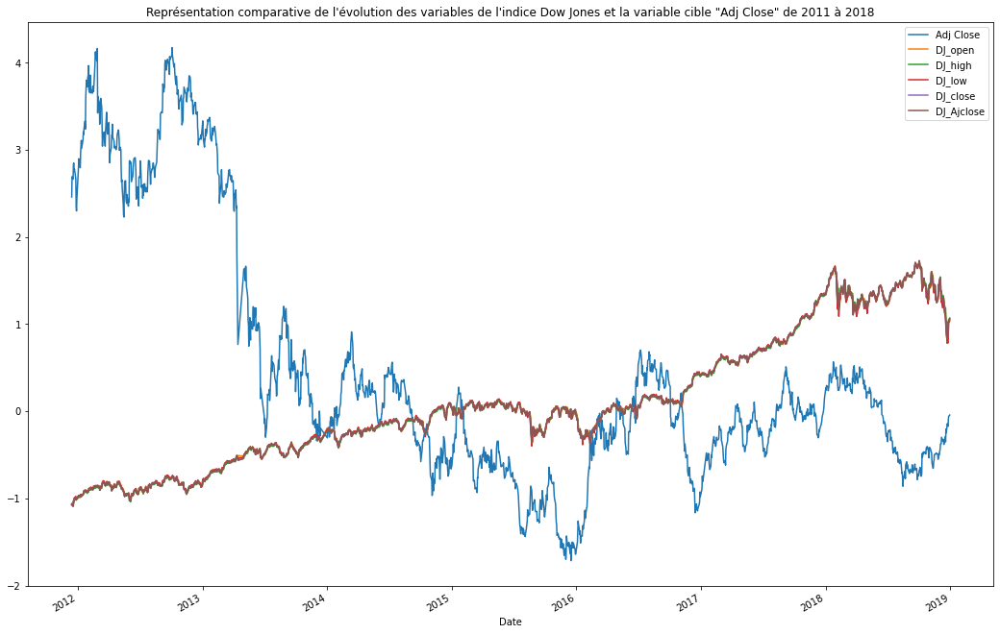

In [51]:
ind_Dow_Jones = ['Adj Close','DJ_open', 'DJ_high', 'DJ_low', 'DJ_close', 'DJ_Ajclose']
df_normaliser[ind_Dow_Jones].plot(figsize = (18,12))
plt.title(f'Représentation comparative de l\'évolution des variables de l\'indice Dow Jones et la variable cible "Adj Close" de 2011 à 2018')
plt.legend()
#plt.savefig(f'indDowJones_Adj Close.png', dpi=200)
plt.show()

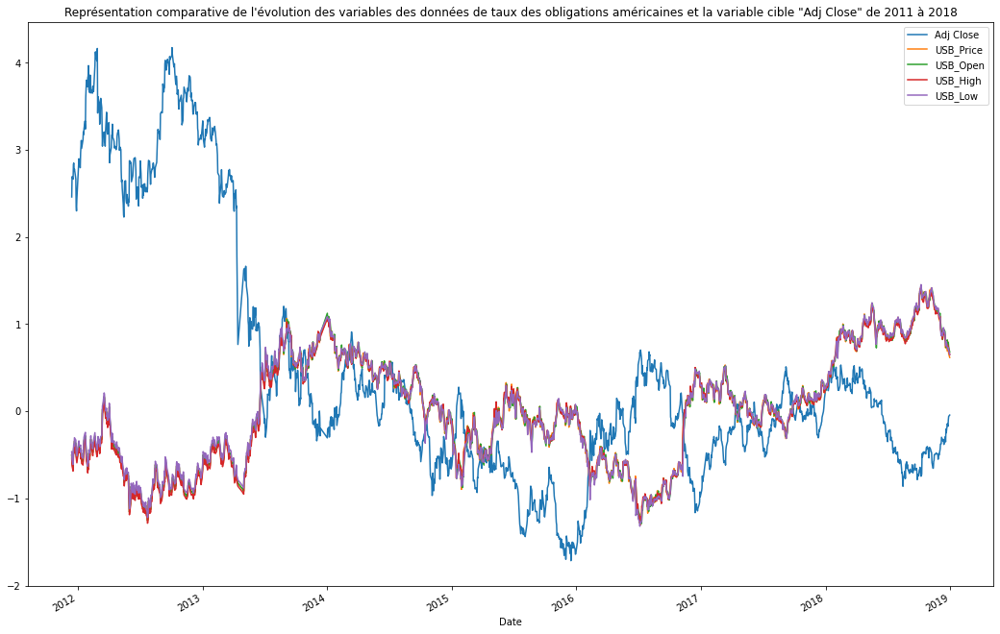

In [52]:
US_obligations = ['Adj Close','USB_Price','USB_Open','USB_High','USB_Low']
df_normaliser[US_obligations].plot(figsize = (18,12))
plt.title(f'Représentation comparative de l\'évolution des variables des données de taux des obligations américaines et la variable cible "Adj Close" de 2011 à 2018')
plt.legend()
#plt.savefig(f'USB_Adj Close.png', dpi=200)
plt.show()

In [53]:
#Tableau des coefficients de correlation de toutes les variables du dataset prises deux-à-deux
df_corr = df.corr()

#Affichage des cinq(5) premières lignes
df_corr.head()

,Open,High,Low,Close,Adj Close,Volume,SP_open,SP_high,SP_low,SP_close,SP_Ajclose,SP_volume,DJ_open,DJ_high,DJ_low,DJ_close,DJ_Ajclose,DJ_volume,EG_open,EG_high,EG_low,EG_close,EG_Ajclose,EG_volume,EU_Price,EU_open,EU_high,EU_low,EU_Trend,OF_Price,OF_Open,OF_High,OF_Low,OF_Volume,OF_Trend,OS_Price,OS_Open,OS_High,OS_Low,OS_Trend,SF_Price,SF_Open,SF_High,SF_Low,SF_Volume,SF_Trend,USB_Price,USB_Open,USB_High,USB_Low,USB_Trend,PLT_Price,PLT_Open,PLT_High,PLT_Low,PLT_Trend,PLD_Price,PLD_Open,PLD_High,PLD_Low,PLD_Trend,RHO_PRICE,USDI_Price,USDI_Open,USDI_High,USDI_Low,USDI_Volume,USDI_Trend,GDX_Open,GDX_High,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
Open,1.000000,0.999515,0.999442,0.998976,0.998976,0.251921,-0.684314,-0.684597,-0.683464,-0.683998,-0.665788,0.242265,-0.588615,-0.588534,-0.587941,-0.588179,-0.588179,-0.155915,0.863226,0.861273,0.863740,0.862066,0.859143,-0.127269,0.580586,0.579304,0.582948,0.577043,0.010250,0.710348,0.708938,0.711079,0.708038,-0.225405,0.045286,0.630270,0.629795,0.631616,0.628710,0.056485,0.946923,0.946454,0.945632,0.948152,0.708413,0.017132,-0.441423,-0.441780,-0.464759,-0.417975,-0.018419,0.775265,0.774171,0.775528,0.774047,-0.002555,-0.213162,-0.215840,-0.217142,-0.214507,0.018274,0.096399,-0.721133,-0.720350,-0.720013,-0.721968,-0.207064,-0.007063,0.975510,0.975143,0.975479,0.974596,0.974098,-0.514230,0.634872,0.634864,0.634277,0.635138,0.635138,-0.455920
High,0.999515,1.000000,0.999262,0.999535,0.999535,0.261064,-0.688118,-0.688365,-0.687325,-0.687817,-0.669657,0.247883,-0.592459,-0.592376,-0.591864,-0.592072,-0.592072,-0.157978,0.864864,0.863336,0.865556,0.864276,0.861358,-0.124106,0.581787,0.580143,0.584050,0.577891,0.015209,0.711245,0.709720,0.711967,0.708806,-0.225274,0.046764,0.631470,0.630847,0.632808,0.629749,0.058236,0.947434,0.946187,0.945888,0.947901,0.712873,0.023581,-0.443377,-0.443266,-0.466330,-0.419765,-0.021915,0.777601,0.775989,0.777677,0.775923,0.004889,-0.216981,-0.219974,-0.221115,-0.218568,0.022405,0.093272,-0.722573,-0.721454,-0.721134,-0.723371,-0.201262,-0.011713,0.975429,0.975722,0.975650,0.975341,0.974746,-0.508782,0.637101,0.637208,0.636538,0.637483,0.637483,-0.454913
Low,0.999442,0.999262,1.000000,0.999532,0.999532,0.237031,-0.680911,-0.681242,-0.679988,-0.680567,-0.662325,0.235838,-0.585021,-0.585009,-0.584304,-0.584592,-0.584592,-0.153442,0.861282,0.859493,0.862220,0.860614,0.857697,-0.129967,0.580633,0.578906,0.582613,0.576936,0.016249,0.710616,0.709057,0.711224,0.708290,-0.225901,0.047973,0.630436,0.629721,0.631587,0.628832,0.058875,0.947373,0.946032,0.945280,0.948437,0.701648,0.023881,-0.438559,-0.438496,-0.461766,-0.414710,-0.022045,0.774112,0.772421,0.773877,0.772672,0.005959,-0.208824,-0.211947,-0.213075,-0.210420,0.024138,0.098648,-0.720684,-0.719513,-0.719438,-0.721184,-0.212337,-0.013227,0.974725,0.974587,0.975337,0.974568,0.974182,-0.519988,0.633591,0.633623,0.633140,0.633994,0.633994,-0.457628
Close,0.998976,0.999535,0.999532,1.000000,1.000000,0.246778,-0.684618,-0.684904,-0.683750,-0.684284,-0.666071,0.241949,-0.588800,-0.588778,-0.588157,-0.588411,-0.588411,-0.155526,0.862900,0.861479,0.863917,0.862770,0.859850,-0.126586,0.581036,0.579036,0.582969,0.577000,0.019913,0.710693,0.709096,0.711334,0.708266,-0.225436,0.048205,0.630817,0.630046,0.632001,0.629083,0.059510,0.947420,0.945557,0.945203,0.947842,0.706505,0.028100,-0.441347,-0.440822,-0.464116,-0.417352,-0.025933,0.775861,0.773760,0.775481,0.773993,0.011355,-0.213179,-0.216426,-0.217490,-0.214919,0.026536,0.095782,-0.721569,-0.720140,-0.720023,-0.722078,-0.205954,-0.016641,0.974824,0.975255,0.975561,0.975459,0.974980,-0.514616,0.635197,0.635311,0.634732,0.635675,0.635675,-0.456193
Adj Close,0.998976,0.999535,0.999532,1.000000,1.000000,0.246778,-0.684618,-0.684904,-0.683750,-0.684284,-0.666071,0.241949,-0.588800,-0.588778,-0.588157,-0.588411,-0.588411,-0.155526,0.862900,0.861479,0.863917,0.862770,0.859850,-0.126586,0.581036,0.579036,0.582969,

##### Tableau de correlation entre les features et la varible cible  "Adj Close"

In [54]:
pd.set_option('display.max_rows', None) #pour afficher toutes les lignes
pd.DataFrame(df_corr['Adj Close'])

,Adj Close
Open,0.998976
High,0.999535
Low,0.999532
Close,1.000000
Adj Close,1.000000
Volume,0.246778
SP_open,-0.684618
SP_high,-0.684904
SP_low,-0.683750
SP_close,-0.684284


##### Affichage des corrélations avec des features avec la variable cible

<AxesSubplot:title={'center':'Correlation with Adj Close'}>

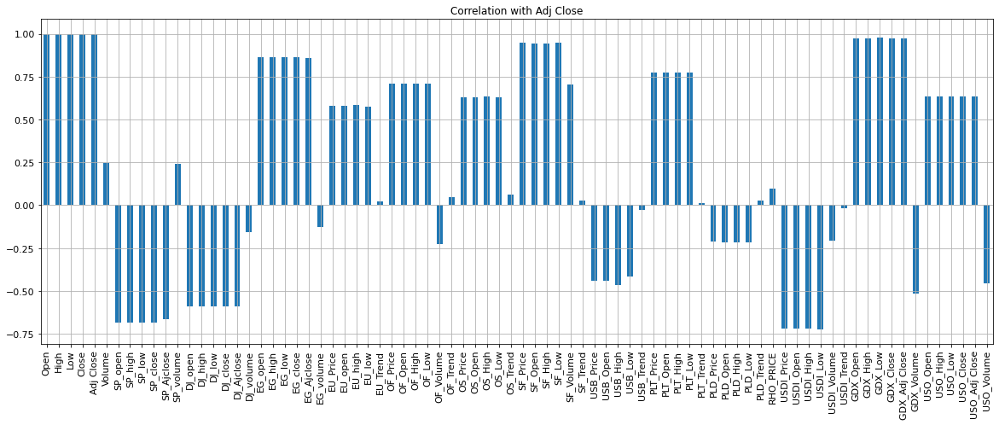

In [55]:
df.corrwith(df['Adj Close']).plot.bar(
        figsize = (20, 7), title = "Correlation with Adj Close", fontsize = 11,
        rot = 90, grid = True)

### h) Identification des outliers (valeurs aberrantes)

Pour visualiser s'il y a des valeurs aberrantes parmi les données du dataset, on utilisera les boîtes à moustaches de chaque variable quantitative continue. <br>
Ces valeurs seront visiblement des points situés après les extrémités de la boîte à moustache. <br>
Ensuite, on les déterminera après calcul.

##### Boîte à moustache de chaque variable

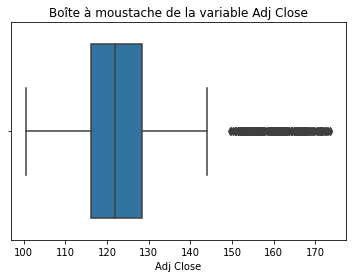

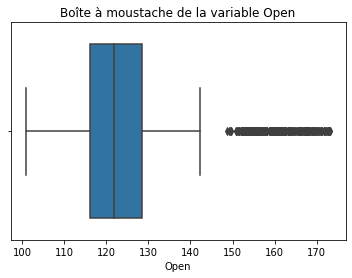

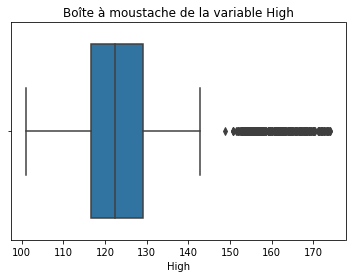

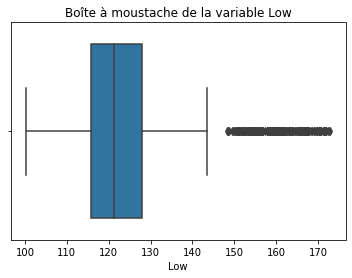

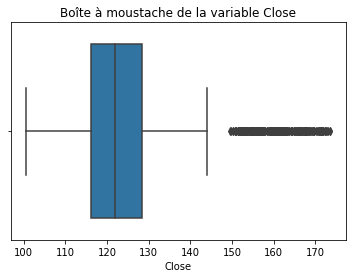

...

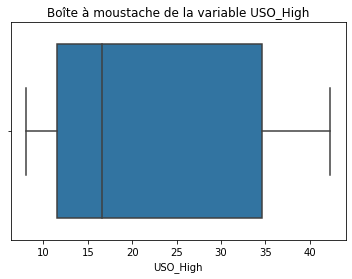

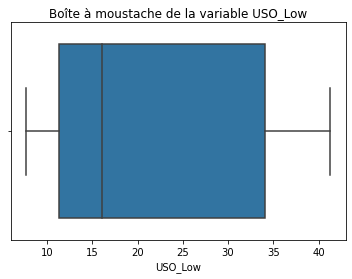

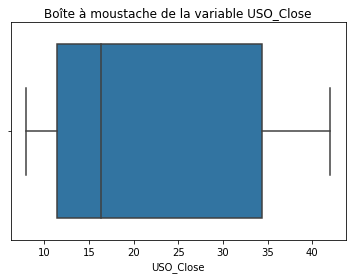

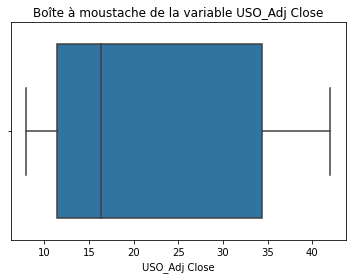

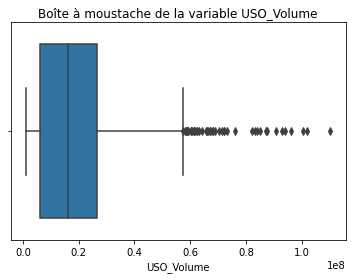

In [56]:
for i in features_list_quanti:    
    print("="*110)

    #Boîte à moustache d'une variable
    plt.title(f'Boîte à moustache de la variable {i}')
    sns.boxplot(data = df, x = i)
    plt.show()

##### Détermination des valeurs aberrantes (outliers) pour chaque variable

In [57]:
#Fonction d'extraction des outliers des variables d'un dataframe

def outliers_extraction(dataframe):
    for col in dataframe.columns:
        #On calcule Q1
        q1 = dataframe[col].quantile(0.25)
        q1
        #On calcule Q3
        q3 = dataframe[col].quantile(0.75)
        q3
        #On calcule l'écart interquartile (IQR)
        iqr = q3-q1
        iqr
        #On calcule la borne inférieure à l'aide du Q1 et de l'écart interquartile
        borne_inf = q1-1.5*iqr

        #On calcule la borne supérieure à l'aide du Q3 et de l'écart interquartile
        borne_sup = q3 +1.5*iqr

        outliers = []
        outliers_index = []
        
        for i in dataframe[col]:
            if (i > borne_sup) or (i < borne_inf):
                outliers.append(i) #ajout des outliers dans une liste
                outliers_index.append(dataframe[dataframe[col] == i].index.tolist()) #récupération dans des dates des outliers
        
        #aplatir la liste de listes (outliers_index)
        index = []
        for item in outliers_index:
            index += item 
        
        #Création d'un dataframe avec les outliers et leurs dates correspondantes
        df_outliers = pd.DataFrame((zip(index,outliers)), columns=['Date',col])
        
        #Affichage des résultats pour chaque variable
        print("="*110)
        if len(df_outliers) == 0 :
            print(f'La variable "{col}" possède {len(df_outliers)} valeurs aberrantes (outliers).')
            print(df_outliers)
        else :
            print(f'La variable "{col}" possède {len(df_outliers)} valeurs aberrantes (outliers).')
            print(f'Les valeurs aberrantes (outliers) pour la variable "{col}" sont: \n')
            print(df_outliers)

In [58]:
outliers_extraction(df)

La variable "Open" possède 326 valeurs aberrantes (outliers).
Les valeurs aberrantes (outliers) pour la variable "Open" sont: 

          Date        Open
0   2011-12-15  154.740005
1   2011-12-16  154.309998
2   2011-12-19  155.479996
3   2011-12-20  156.820007
4   2011-12-21  156.979996
5   2011-12-22  156.350006
6   2011-12-23  156.350006
7   2011-12-22  155.080002
8   2011-12-23  154.050003
9   2011-12-27  149.089996
10  2011-12-28  152.139999
11  2011-12-29  154.759995
12  2011-12-30  155.429993
13  2012-01-03  155.369995
14  2012-01-04  158.589996
15  2012-01-05  157.360001
16  2012-01-06  158.970001
17  2012-01-09  159.339996
18  2012-01-10  161.020004
19  2012-01-11  159.320007
20  2012-01-12  161.169998
21  2012-01-13  159.940002
22  2012-01-17  160.960007
23  2012-01-18  160.500000
24  2012-01-19  162.320007
25  2012-01-20  161.809998
26  2012-01-23  161.070007
27  2012-01-24  167.440002
28  2012-01-25  168.190002
29  2012-01-27  169.770004
30  2012-01-30  169.750000
31  2012

La variable "Low" possède 325 valeurs aberrantes (outliers).
Les valeurs aberrantes (outliers) pour la variable "Low" sont: 

          Date         Low
0   2011-12-15  151.710007
1   2011-12-16  153.899994
2   2013-03-12  154.360001
3   2011-12-19  156.580002
4   2013-03-25  156.130005
5   2011-12-20  155.330002
6   2012-04-04  155.820007
7   2011-12-21  154.539993
8   2011-12-22  150.660004
9   2011-12-23  148.270004
10  2011-12-27  151.789993
11  2011-12-28  154.550003
12  2011-12-29  155.339996
13  2011-12-30  155.250000
14  2012-01-03  156.380005
15  2012-01-04  156.190002
16  2012-01-05  158.470001
17  2012-01-06  158.910004
18  2012-01-09  159.830002
19  2012-01-10  158.009995
20  2012-04-10  160.419998
21  2012-01-11  159.679993
22  2012-04-09  160.330002
23  2012-01-12  160.000000
24  2012-01-13  162.320007
25  2012-01-17  161.529999
26  2012-01-18  160.289993
27  2012-01-19  167.410004
28  2012-01-20  167.740005
29  2012-01-23  167.720001
30  2012-01-24  169.080002
31  2012-0

La variable "Adj Close" possède 325 valeurs aberrantes (outliers).
Les valeurs aberrantes (outliers) pour la variable "Adj Close" sont: 

          Date   Adj Close
0   2011-12-15  152.330002
1   2011-12-16  155.229996
2   2011-12-19  154.869995
3   2011-12-20  156.979996
4   2011-12-21  157.160004
5   2012-06-19  156.039993
6   2011-12-22  156.309998
7   2011-12-23  154.910004
8   2011-12-27  151.029999
9   2011-12-28  150.339996
10  2011-12-29  151.990005
11  2011-12-30  155.919998
12  2012-01-03  156.710007
13  2012-01-04  157.779999
14  2012-01-05  157.199997
15  2012-01-06  156.500000
16  2012-01-09  158.639999
17  2012-01-10  159.669998
18  2012-01-11  160.380005
19  2012-01-12  159.259995
20  2012-01-13  160.500000
21  2012-01-17  161.600006
22  2012-01-18  161.220001
23  2012-01-19  162.070007
24  2012-01-20  163.160004
25  2012-01-23  162.009995
26  2012-01-24  166.419998
27  2012-01-25  168.970001
28  2012-01-27  168.029999
29  2012-01-30  169.309998
30  2012-01-31  169.55999

La variable "EG_close" possède 67 valeurs aberrantes (outliers).
Les valeurs aberrantes (outliers) pour la variable "EG_close" sont: 

         Date   EG_close
0  2011-12-15  72.900002
1  2012-02-06  74.900002
2  2011-12-16  73.699997
3  2012-01-03  73.099998
4  2012-11-20  73.199997
5  2012-01-04  71.949997
6  2012-01-05  71.949997
7  2012-01-06  71.849998
8  2012-01-09  75.250000
9  2012-01-06  74.150002
10 2012-01-09  75.550003
11 2012-01-10  75.800003
12 2012-01-27  77.500000
13 2012-01-30  73.800003
14 2012-11-07  72.900002
15 2012-01-31  72.449997
16 2012-09-13  72.000000
17 2012-02-01  73.849998
18 2012-02-02  74.400002
19 2012-02-03  75.349998
20 2011-12-15  76.000000
21 2012-02-06  77.599998
22 2012-02-07  76.550003
23 2012-04-17  77.000000
24 2012-10-16  74.500000
25 2012-02-21  72.000000
26 2012-04-12  72.250000
27 2012-02-22  72.449997
28 2012-11-13  73.400002
29 2012-02-23  72.750000
30 2012-02-24  72.349998
31 2012-02-27  75.550003
32 2012-10-04  78.750000
33 2012-02-28  

La variable "SF_Open" possède 68 valeurs aberrantes (outliers).
Les valeurs aberrantes (outliers) pour la variable "SF_Open" sont: 

         Date  SF_Open
0  2012-02-29    60687
1  2012-09-04    59700
2  2012-09-05    60240
3  2012-09-06    62049
4  2012-09-07    62037
5  2012-09-10    64008
6  2012-09-11    64102
7  2012-09-12    63899
8  2012-09-13    63268
9  2012-09-14    65400
10 2012-09-17    64120
11 2012-09-18    63651
12 2012-09-19    64599
13 2012-09-20    64320
14 2012-09-21    64448
15 2012-09-24    63121
16 2012-09-25    62599
17 2012-09-26    62390
18 2012-09-27    62669
19 2012-09-28    63048
20 2012-10-01    62642
21 2012-10-03    62872
22 2012-10-04    62344
23 2012-10-05    62250
24 2012-10-09    61560
25 2012-10-10    61570
26 2012-10-11    62161
27 2012-10-12    61761
28 2012-10-15    61066
29 2012-10-16    59919
30 2012-10-17    60167
31 2012-10-18    60592
32 2012-10-19    60650
33 2012-10-22    59845
34 2012-10-23    59691
35 2012-11-01    59870
36 2012-11-02   

La variable "PLD_Price" possède 29 valeurs aberrantes (outliers).
Les valeurs aberrantes (outliers) pour la variable "PLD_Price" sont: 

         Date  PLD_Price
0  2018-10-23    1126.10
1  2018-11-15    1137.60
2  2018-11-16    1158.90
3  2018-12-21    1146.20
4  2018-11-19    1129.30
5  2018-11-21    1126.00
6  2018-11-26    1126.50
7  2018-11-27    1156.10
8  2018-11-28    1157.70
9  2018-11-29    1147.20
10 2018-11-30    1162.40
11 2018-12-03    1181.00
12 2018-12-04    1156.90
13 2018-12-06    1171.35
14 2018-12-07    1164.85
15 2018-12-10    1176.00
16 2018-12-11    1192.30
17 2018-12-18    1191.80
18 2018-12-12    1169.65
19 2018-12-13    1188.00
20 2018-12-14    1176.00
21 2018-12-17    1195.00
22 2018-12-11    1188.45
23 2018-12-18    1158.90
24 2018-12-19    1172.80
25 2018-12-20    1190.10
26 2018-11-16    1196.00
27 2018-12-21    1185.20
28 2018-12-24    1197.50
La variable "PLD_Open" possède 29 valeurs aberrantes (outliers).
Les valeurs aberrantes (outliers) pour la variab

La variable "USDI_High" possède 0 valeurs aberrantes (outliers).
Empty DataFrame
Columns: [Date, USDI_High]
Index: []
La variable "USDI_Low" possède 0 valeurs aberrantes (outliers).
Empty DataFrame
Columns: [Date, USDI_Low]
Index: []
La variable "USDI_Volume" possède 77 valeurs aberrantes (outliers).
Les valeurs aberrantes (outliers) pour la variable "USDI_Volume" sont: 

         Date  USDI_Volume
0  2012-06-01        57680
1  2013-05-22        70880
2  2013-05-23        61590
3  2013-06-06       106680
4  2013-06-07        74330
5  2013-06-11        59580
6  2013-06-12        66880
7  2013-06-20        58000
8  2014-09-10        58230
9  2014-09-17        66610
10 2014-10-16        59860
11 2014-10-31        64770
12 2014-11-07        65230
13 2014-12-04        67520
14 2014-12-09        64120
15 2014-12-17        60780
16 2015-01-15        80170
17 2015-01-16        60080
18 2015-01-22        60130
19 2015-01-23        57850
20 2015-02-03        58630
21 2015-03-10        71850
22 2

La variable "GDX_High" possède 304 valeurs aberrantes (outliers).
Les valeurs aberrantes (outliers) pour la variable "GDX_High" sont: 

          Date   GDX_High
0   2011-12-15  53.139999
1   2011-12-16  53.180000
2   2011-12-19  52.549999
3   2011-12-20  53.250000
4   2011-12-21  53.430000
5   2011-12-22  52.619999
6   2011-12-23  52.790001
7   2011-12-27  52.520000
8   2011-12-28  51.869999
9   2011-12-29  51.200001
10  2011-12-30  52.080002
11  2012-01-03  54.020000
12  2012-01-04  54.540001
13  2012-01-17  54.270000
14  2012-01-05  54.290001
15  2012-01-06  53.950001
16  2012-01-09  55.070000
17  2012-01-10  54.509998
18  2012-01-11  55.450001
19  2012-01-12  54.169998
20  2012-01-13  54.540001
21  2012-01-04  53.580002
22  2012-01-17  53.419998
23  2012-01-18  52.779999
24  2012-01-19  53.270000
25  2012-01-20  52.580002
26  2012-09-26  55.410000
27  2012-01-23  57.369999
28  2012-01-24  56.910000
29  2012-03-06  57.709999
30  2012-01-25  57.150002
31  2012-01-27  57.939999
32  20

La variable "GDX_Close" possède 306 valeurs aberrantes (outliers).
Les valeurs aberrantes (outliers) pour la variable "GDX_Close" sont: 

          Date  GDX_Close
0   2011-12-15  51.680000
1   2011-12-16  52.680000
2   2011-12-19  51.169998
3   2011-12-20  52.990002
4   2011-12-21  52.959999
5   2012-09-24  52.400002
6   2011-12-22  52.790001
7   2012-09-26  51.869999
8   2011-12-23  50.060001
9   2011-12-27  51.200001
10  2011-12-28  51.430000
11  2012-10-24  53.799999
12  2011-12-29  53.740002
13  2011-12-30  53.900002
14  2012-01-03  53.349998
15  2012-01-04  53.650002
16  2012-01-05  54.470001
17  2012-01-06  54.310001
18  2012-01-09  54.720001
19  2012-10-05  54.049999
20  2012-01-10  53.180000
21  2012-01-11  53.240002
22  2012-01-12  52.150002
23  2012-01-13  52.180000
24  2012-01-17  53.009998
25  2012-01-18  51.820000
26  2012-03-09  55.230000
27  2012-01-19  57.139999
28  2012-01-20  56.459999
29  2012-01-23  56.459999
30  2012-01-24  56.560001
31  2012-01-25  57.470001
32  

# 2. PRÉDICTION DU PRIX DE L'OR

### a) pre-processing

In [60]:
df.head()

,Open,High,Low,Close,Adj Close,Volume,SP_open,SP_high,SP_low,SP_close,SP_Ajclose,SP_volume,DJ_open,DJ_high,DJ_low,DJ_close,DJ_Ajclose,DJ_volume,EG_open,EG_high,EG_low,EG_close,EG_Ajclose,EG_volume,EU_Price,EU_open,EU_high,EU_low,EU_Trend,OF_Price,OF_Open,OF_High,OF_Low,OF_Volume,OF_Trend,OS_Price,OS_Open,OS_High,OS_Low,OS_Trend,SF_Price,SF_Open,SF_High,SF_Low,SF_Volume,SF_Trend,USB_Price,USB_Open,USB_High,USB_Low,USB_Trend,PLT_Price,PLT_Open,PLT_High,PLT_Low,PLT_Trend,PLD_Price,PLD_Open,PLD_High,PLD_Low,PLD_Trend,RHO_PRICE,USDI_Price,USDI_Open,USDI_High,USDI_Low,USDI_Volume,USDI_Trend,GDX_Open,GDX_High,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-12-15,154.740005,154.949997,151.710007,152.330002,152.330002,21521900,123.029999,123.199997,121.989998,122.180000,105.441238,199109200,11825.29004,11967.83984,11825.21973,11868.80957,11868.80957,136930000,74.550003,76.150002,72.150002,72.900002,70.431755,787900,1.3018,1.2982,1.3051,1.2957,1,105.09,104.88,106.50,104.88,14330,1,93.42,94.91,96.00,93.33,0,53604,54248,54248,52316,119440,1,1.911,1.911,1.911,1.911,1,1414.65,1420.30,1423.35,1376.85,0,618.85,614.70,615.00,614.60,1,1425,80.341,80.565,80.630,80.130,22850,0,53.009998,53.139999,51.570000,51.680000,48.973877,20605600,36.900002,36.939999,36.049999,36.130001,36.130001,12616700
2011-12-16,154.309998,155.369995,153.899994,155.229996,155.229996,18124300,122.230003,122.949997,121.300003,121.589996,105.597549,220481400,11870.25000,11968.17969,11819.30957,11866.38965,11866.38965,389520000,73.599998,75.099998,73.349998,74.900002,72.364037,896600,1.3035,1.3020,1.3087,1.2997,1,103.35,103.51,104.56,102.46,140080,0,93.79,93.43,94.80,92.53,1,53458,53650,54030,52890,65390,0,1.851,1.851,1.851,1.851,0,1420.25,1414.75,1431.75,1400.70,1,623.65,622.60,623.45,622.30,1,1400,80.249,80.175,80.395,79.935,13150,0,52.500000,53.180000,52.040001,52.680000,49.921513,16285400,36.180000,36.500000,35.730000,36.270000,36.270000,12578800
2011-12-19,155.479996,155.860001,154.360001,154.869995,154.869995,12547200,122.059998,122.320000,120.029999,120.290001,104.468536,183903000,11866.54004,11925.87988,11735.19043,11766.25977,11766.25977,135170000,69.099998,69.800003,64.199997,64.699997,62.509384,2096700,1.2995,1.3043,1.3044,1.2981,0,103.64,103.63,104.57,102.37,147880,1,94.09,93.77,94.43,92.55,1,52961,53400,53400,52544,67280,0,1.810,1.810,1.810,1.810,0,1411.10,1422.65,1427.60,1404.60,0,608.80,626.00,630.00,608.60,0,1400,80.207,80.300,80.470,80.125,970,0,52.490002,52.549999,51.029999,51.169998,48.490578,15120200,36.389999,36.450001,35.930000,36.200001,36.200001,7418200
2011-12-20,156.820007,157.429993,156.580002,156.979996,156.979996,9136300,122.180000,124.139999,120.370003,123.930000,107.629784,225418100,11769.20996,12117.12988,11768.83008,12103.58008,12103.58008,165180000,66.449997,68.099998,66.000000,67.000000,64.731514,875300,1.3079,1.3003,1.3133,1.2994,1,106.73,104.30,107.27,103.91,170240,1,95.55,96.39,99.70,96.39,1,53487,52795,53575,52595,55130,1,1.927,1.927,1.927,1.927,1,1434.75,1408.95,1436.55,1408.15,1,626.65,622.45,622.45,622.45,1,1400,80.273,80.890,80.940,80.035,22950,1,52.380001,53.250000,52.369999,52.990002,50.215282,11644900,37.299999,37.610001,37.220001,37.560001,37.560001,10041600
2011-12-21,156.979996,157.529999,156.130005,157.160004,157.160004,11996100,123.930000,124.360001,122.750000,124.169998,107.838242,194230900,12103.58008,12119.70020,11999.44043,12107.74023,12107.74023,163250000,67.099998,69.400002,66.900002,68.500000,66.180725,837600,1.3045,1.3079,1.3197,1.3024,0,107.71,107.15,108.17,106.16,145090,1,99.01,97.54,99.26,96.81,1,53148,53519,54184,52937,75950,0,1.970,1.970,1.970,1.970,1,1429.05,1434.40,1453.75,1417.65,0,635.90,625.70,641.50,623.80,1,1400,80.350,80.105,80.445,79.550,24140,1,53.150002,53.430000,52.419998,52.959999,50.186852,8724300,37.669998,38.240002,37.520000,38.110001,38.110001,10728000


In [74]:
features = ['Open','High','Low','Close','Adj Close','Volume','DJ_open', 'DJ_high', 'DJ_low', 'DJ_close', 'DJ_Ajclose','USB_Price','USB_Open','USB_High','USB_Low','SP_open','SP_high','SP_low','SP_close','SP_Ajclose','USO_Open','USO_High','USO_Low','USO_Close','USO_Adj Close','PLT_Price','PLT_Open','PLT_High','PLT_Low', 'OS_Price','OS_Open', 'OS_High', 'OS_Low', 'OF_Price','OF_Open', 'OF_High', 'OF_Low', 'EU_Price', 'EU_open', 'EU_high', 'EU_low','GDX_Open','GDX_High','GDX_Low','GDX_Close','GDX_Adj Close','SF_Price','SF_Open','SF_High','SF_Low','EG_open', 'EG_high', 'EG_low', 'EG_close', 'EG_Ajclose']

In [75]:
df_final = df[features]

In [76]:
df_final.head()

,Open,High,Low,Close,Adj Close,Volume,DJ_open,DJ_high,DJ_low,DJ_close,DJ_Ajclose,USB_Price,USB_Open,USB_High,USB_Low,SP_open,SP_high,SP_low,SP_close,SP_Ajclose,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,PLT_Price,PLT_Open,PLT_High,PLT_Low,OS_Price,OS_Open,OS_High,OS_Low,OF_Price,OF_Open,OF_High,OF_Low,EU_Price,EU_open,EU_high,EU_low,GDX_Open,GDX_High,GDX_Low,GDX_Close,GDX_Adj Close,SF_Price,SF_Open,SF_High,SF_Low,EG_open,EG_high,EG_low,EG_close,EG_Ajclose
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-12-15,154.740005,154.949997,151.710007,152.330002,152.330002,21521900,11825.29004,11967.83984,11825.21973,11868.80957,11868.80957,1.911,1.911,1.911,1.911,123.029999,123.199997,121.989998,122.180000,105.441238,36.900002,36.939999,36.049999,36.130001,36.130001,1414.65,1420.30,1423.35,1376.85,93.42,94.91,96.00,93.33,105.09,104.88,106.50,104.88,1.3018,1.2982,1.3051,1.2957,53.009998,53.139999,51.570000,51.680000,48.973877,53604,54248,54248,52316,74.550003,76.150002,72.150002,72.900002,70.431755
2011-12-16,154.309998,155.369995,153.899994,155.229996,155.229996,18124300,11870.25000,11968.17969,11819.30957,11866.38965,11866.38965,1.851,1.851,1.851,1.851,122.230003,122.949997,121.300003,121.589996,105.597549,36.180000,36.500000,35.730000,36.270000,36.270000,1420.25,1414.75,1431.75,1400.70,93.79,93.43,94.80,92.53,103.35,103.51,104.56,102.46,1.3035,1.3020,1.3087,1.2997,52.500000,53.180000,52.040001,52.680000,49.921513,53458,53650,54030,52890,73.599998,75.099998,73.349998,74.900002,72.364037
2011-12-19,155.479996,155.860001,154.360001,154.869995,154.869995,12547200,11866.54004,11925.87988,11735.19043,11766.25977,11766.25977,1.810,1.810,1.810,1.810,122.059998,122.320000,120.029999,120.290001,104.468536,36.389999,36.450001,35.930000,36.200001,36.200001,1411.10,1422.65,1427.60,1404.60,94.09,93.77,94.43,92.55,103.64,103.63,104.57,102.37,1.2995,1.3043,1.3044,1.2981,52.490002,52.549999,51.029999,51.169998,48.490578,52961,53400,53400,52544,69.099998,69.800003,64.199997,64.699997,62.509384
2011-12-20,156.820007,157.429993,156.580002,156.979996,156.979996,9136300,11769.20996,12117.12988,11768.83008,12103.58008,12103.58008,1.927,1.927,1.927,1.927,122.180000,124.139999,120.370003,123.930000,107.629784,37.299999,37.610001,37.220001,37.560001,37.560001,1434.75,1408.95,1436.55,1408.15,95.55,96.39,99.70,96.39,106.73,104.30,107.27,103.91,1.3079,1.3003,1.3133,1.2994,52.380001,53.250000,52.369999,52.990002,50.215282,53487,52795,53575,52595,66.449997,68.099998,66.000000,67.000000,64.731514
2011-12-21,156.979996,157.529999,156.130005,157.160004,157.160004,11996100,12103.58008,12119.70020,11999.44043,12107.74023,12107.74023,1.970,1.970,1.970,1.970,123.930000,124.360001,122.750000,124.169998,107.838242,37.669998,38.240002,37.520000,38.110001,38.110001,1429.05,1434.40,1453.75,1417.65,99.01,97.54,99.26,96.81,107.71,107.15,108.17,106.16,1.3045,1.3079,1.3197,1.3024,53.150002,53.430000,52.419998,52.959999,50.186852,53148,53519,54184,52937,67.099998,69.400002,66.900002,68.500000,66.180725


In [77]:
trainset, testset = train_test_split(df_final, test_size = 0.3, random_state = 0)

In [82]:
def split_Xy(Dataframe):
    X = Dataframe.drop('Adj Close', axis=1)
    y = Dataframe['Adj Close']
    print("Taille de X:", X.shape)
    print("Taille de y:", y.shape)
    return X,y

In [83]:
X_train, y_train = split_Xy(trainset)

Taille de X: (1202, 54)
Taille de y: (1202,)


In [86]:
X_test, y_test = split_Xy(testset)

Taille de X: (516, 54)
Taille de y: (516,)


In [154]:
#Fonction d'évaluation de modèles (au minimum deux(2) modèles) 

def evaluation(model_list):
    
    for item in model_list:
        model = make_pipeline(RobustScaler(), item)
        model.fit(X_train, y_train)
        
        print('=='*50)
        print('EVALUATION DU MODELE:', item, "\n")

        y_train_pred = model.predict(X_train)        
        y_pred = model.predict(X_test)
        
        print("Score du modèle:", model.score(X_train, y_train))
        print("Score du modèle:", model.score(X_test, y_test))
        print("MAE :", median_absolute_error(y_test, y_pred))
        print("MSE :", mean_squared_error(y_test, y_pred))
        #N, train_score, val_score = learning_curve(model, X_train, y_train,
                                                   # cv=5, scoring = 'f1', 
                                                   # train_sizes=np.linspace(0.1, 1, 10))
        #plt.figure(figsize=(12,8))
        #plt.title(f"Courbe train-test du modèle {item}")
        #plt.plot(N, train_score.mean(axis=1), label='train score')
        #plt.plot(N, val_score.mean(axis=1), label='validation score')
        #plt.legend()        

In [166]:
model_1 = LinearRegression()
model_2 = Ridge(random_state = 0)
model_3 = ElasticNet(random_state = 0)
model_4 = RANSACRegressor(random_state = 0)
model_5 = TheilSenRegressor(random_state = 0)
model_6 = HuberRegressor()
model_7 = SVR(kernel = "linear")

In [167]:
model_list = [model_1, model_2, model_3, model_4, model_5, model_6, model_7]

In [168]:
evaluation(model_list)

EVALUATION DU MODELE: LinearRegression() 

Score du modèle: 1.0
Score du modèle: 1.0
MAE : 1.4210854715202004e-14
MSE : 6.461565789866123e-28
EVALUATION DU MODELE: Ridge(random_state=0) 

Score du modèle: 0.9999410848062914
Score du modèle: 0.9999469391343624
MAE : 0.07429982506418753
MSE : 0.01696781830788176
EVALUATION DU MODELE: ElasticNet(random_state=0) 

Score du modèle: 0.989470230565492
Score du modèle: 0.989686571173247
MAE : 1.0432269190164973
MSE : 3.298031126346945
EVALUATION DU MODELE: RANSACRegressor(random_state=0) 

Score du modèle: 1.0
Score du modèle: 1.0
MAE : 2.842170943040401e-14
MSE : 5.639682800240511e-28
EVALUATION DU MODELE: TheilSenRegressor(max_subpopulation=10000, random_state=0) 

Score du modèle: 1.0
Score du modèle: 1.0
MAE : 5.826450433232822e-13
MSE : 4.142873413262868e-25
EVALUATION DU MODELE: HuberRegressor() 

Score du modèle: 0.9998533469417255
Score du modèle: 0.999865967412422
MAE : 0.1182160250661255
MSE : 0.04286097797375405
EVALUATION DU MODELE